In [ ]:
# in this notebook,  I will try to fit a model relating the mean behavior of L4,  L2/3,  SST and VIP cells

In [ ]:
# load the data

In [1]:
import pyute as ut
import autograd.numpy as np
import matplotlib.pyplot as plt
import sklearn
import h5py
import pdb
import scipy.optimize as sop
from mpl_toolkits.mplot3d import Axes3D
import sklearn.discriminant_analysis as skd
import autograd.scipy.special as ssp
from autograd import elementwise_grad as egrad
from autograd import grad
from autograd import jacobian
from autograd import hessian
import size_contrast_analysis as sca
import scipy.stats as sst
import sim_utils
from importlib import reload
reload(sim_utils)
import calnet.utils
import calnet.fitting_spatial_feature_model
import opto_utils
import nub_utils
import scipy.interpolate as sip
from numpy import maximum as npmaximum
import size_contrast_figures as scf
import scipy.signal as ssi
reload(scf)
%matplotlib notebook
%load_ext autoreload
%autoreload 2

/Users/dan/Documents/code/downloads/OASIS/oasis/functions.py:14: UserWarning: Could not find cvxpy. Don't worry, you can still use OASIS, just not the slower interior point methods we compared to in the papers.
  "just not the slower interior point methods we compared to in the papers.")


In [2]:
reload(opto_utils)

<module 'opto_utils' from '/Users/dan/Documents/code/adesnal/opto_utils.py'>

In [3]:
# inp = [[1,  2,  3],  [4,  5,  6]]
shp = (1,  2,  3,  4,  5)
inp = np.arange(np.prod(shp)).reshape(shp).tolist()

In [4]:
reload(ut)
outp = ut.apply_fn_to_nested_lists_single_out(lambda x: x,  [None,  None],  inp)

In [5]:
reload(scf)
reload(ut)
rsfile = 'data/celltype_rate_summary_exptwise_200828.npy'
ca_obj = scf.ca_imaging(rsfile)

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:666: RuntimeWarning: Mean of empty slice
  rsexpt[iexpt] = np.nanmean(rso[expt_ids==iexpt],0)


In [6]:
ca_obj.rsexpt_colors_for_2d

[[[array([0., 1., 0.]), array([0., 1., 0.])],
  [array([0.5, 0.5, 0.5]), array([0.5, 0.5, 0.5])],
  [array([1. , 0.5, 0. ]), array([1. , 0.5, 0. ])],
  [array([1, 0, 1]), array([1, 0, 1])],
  [array([0, 0, 1]), array([0, 0, 1])]],
 [[array([0., 1., 0.]), array([0., 1., 0.])],
  [array([0.5, 0.5, 0.5]), array([0.5, 0.5, 0.5])],
  [array([1. , 0.5, 0. ]), array([1. , 0.5, 0. ])],
  [array([1, 0, 1]), array([1, 0, 1])],
  [array([0, 0, 1]), array([0, 0, 1])]]]

In [7]:
ca_obj.compute_smis()

/Users/dan/Documents/code/adesnal/size_contrast_figures.py:789: RuntimeWarning: Mean of empty slice
  to_return = np.nanmean(data,-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:794: RuntimeWarning: All-NaN slice encountered
  to_return = to_return - np.nanmin(np.nanmin(to_return,1),1)[:,np.newaxis,np.newaxis]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:799: RuntimeWarning: All-NaN slice encountered
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/Users/dan/.local/lib/python3.6/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


In [8]:
ca_obj.compute_c50s()

/Users/dan/Documents/code/adesnal/size_contrast_figures.py:758: RuntimeWarning: Mean of empty slice
  this_data = np.nanmean(data,2)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:759: RuntimeWarning: Mean of empty slice
  this_sem = np.nanmean(data,2)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:760: RuntimeWarning: Mean of empty slice
  this_data[:,0] = np.nanmean(this_data[:,0])


In [9]:
ca_obj.compute_csis()

/Users/dan/Documents/code/adesnal/size_contrast_figures.py:789: RuntimeWarning: Mean of empty slice
  to_return = np.nanmean(data,-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:794: RuntimeWarning: All-NaN slice encountered
  to_return = to_return - np.nanmin(np.nanmin(to_return,1),1)[:,np.newaxis,np.newaxis]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:805: RuntimeWarning: All-NaN slice encountered
  return this_data[:,:,1]/np.nanmax(this_data,2)


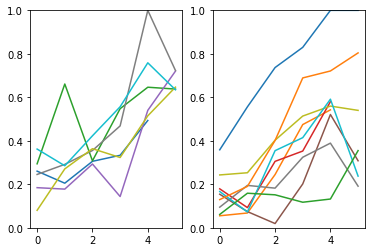

In [10]:
plt.figure()
for itype in range(2):
    plt.subplot(1,  2,  itype+1)
    plt.plot(ca_obj.csis[0][itype][0].T)
    plt.ylim((0,  1))

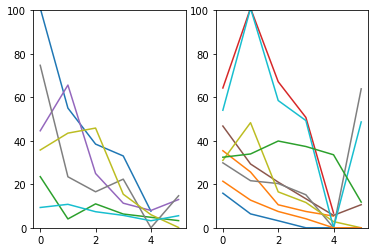

In [11]:
plt.figure()
for itype in range(2):
    plt.subplot(1,  2,  itype+1)
    plt.plot(ca_obj.c50s[0][itype][0].T)
    plt.ylim((0,  100))

In [12]:
reload(scf)
ca_obj2 = scf.ca_imaging(rsfile)

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:666: RuntimeWarning: Mean of empty slice
  rsexpt[iexpt] = np.nanmean(rso[expt_ids==iexpt],0)


In [13]:
ca_obj.fit_ayaz_models()

/Users/dan/Documents/code/adesnal/size_contrast_figures.py:357: RuntimeWarning: Mean of empty slice
  data = np.nanmean(rsexpt,self.ori_dim)
/Users/dan/Documents/code/adesnal/naka_rushton_analysis.py:615: RuntimeWarning: divide by zero encountered in double_scalars
  self.c50top = self.theta[3]**(-1/self.theta[-3])
/Users/dan/Documents/code/adesnal/naka_rushton_analysis.py:616: RuntimeWarning: divide by zero encountered in double_scalars
  self.c50bottom = self.theta[6]**(-1/self.theta[-3])
/Users/dan/Documents/code/adesnal/nub_utils.py:236: RuntimeWarning: divide by zero encountered in double_scalars
  return 0.5*(ssp.erf((0.5*diam - mu)/np.sqrt(2*sigma2)) - ssp.erf((-0.5*diam - mu)/np.sqrt(2*sigma2)))
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: divide by zero encountered in true_divide
  return f_raw(*args, **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:52: RuntimeWarning: invalid value encount

In [ ]:
ca_obj2.compute_c50s()

/Users/dan/Documents/code/adesnal/size_contrast_figures.py:742: RuntimeWarning: Mean of empty slice
  this_data = np.nanmean(data,2)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:743: RuntimeWarning: Mean of empty slice
  this_sem = np.nanmean(data,2)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:744: RuntimeWarning: Mean of empty slice
  this_data[:,0] = np.nanmean(this_data[:,0])


/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:659: RuntimeWarning: Mean of empty slice
  rsexpt[iexpt] = np.nanmean(rso[expt_ids==iexpt],0)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:703: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(to_plot.reshape((to_plot.shape[0],-1)),-1)


2.5290093590772433


/Users/dan/Documents/code/adesnal/size_contrast_figures.py:703: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(to_plot.reshape((to_plot.shape[0],-1)),-1)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:703: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(to_plot.reshape((to_plot.shape[0],-1)),-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:703: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(to_plot.reshape((to_plot.shape[0],-1)),-1)


2.2049598702846227
3.098279979464226
2.7435670231506393


/Users/dan/Documents/code/adesnal/size_contrast_figures.py:703: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(to_plot.reshape((to_plot.shape[0],-1)),-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:703: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(to_plot.reshape((to_plot.shape[0],-1)),-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:703: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(to_plot.reshape((to_plot.shape[0],-1)),-1)


3.9143609068896055
4.983392668794143
0.9182298642931612


/Users/dan/Documents/code/adesnal/size_contrast_figures.py:703: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(to_plot.reshape((to_plot.shape[0],-1)),-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:703: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(to_plot.reshape((to_plot.shape[0],-1)),-1)


0.9344238221318399
2.0100417565227082
2.0495240765738276


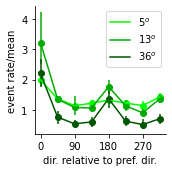

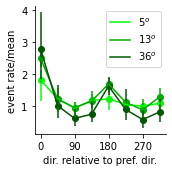

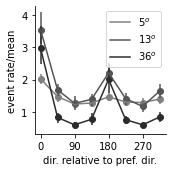

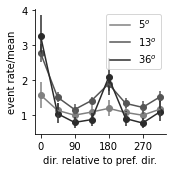

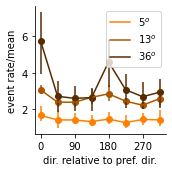

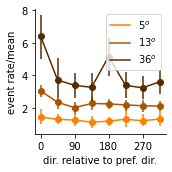

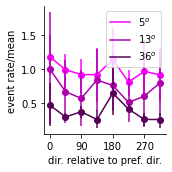

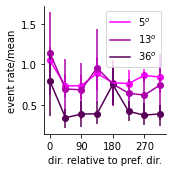

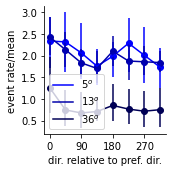

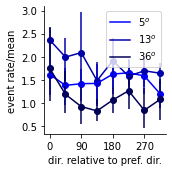

In [ ]:
        reload(scf)
        reload(ut)
        ca_obj2 = scf.ca_imaging(rsfile)
        self = ca_obj2
        opt = {}
        opt['filebase'] = 'figures/%s_ori_tuning_by_size_full_contrast_%s.eps'
        opt['rsexpt_inds'] = [1, 2]#(lbls[itype],  alignment_lbls[ialign])
        opt['ind_list'] = [[0], None, None]
        opt['fn'] = self.plot_ori_by_size
        opt['attr_args'] = ['rsexpt', 'rsexpt_colors_for_2d']
        opt['add_kwargs'] = {}
        scf.fig_gen(opt, self, save=False)

In [ ]:
self.gen_2d_colors(3)

[array([[0.        , 1.        , 0.        ],
        [0.        , 0.66666667, 0.        ],
        [0.        , 0.33333333, 0.        ]]),
 array([[0.5       , 0.5       , 0.5       ],
        [0.33333333, 0.33333333, 0.33333333],
        [0.16666667, 0.16666667, 0.16666667]]),
 array([[1.        , 0.5       , 0.        ],
        [0.66666667, 0.33333333, 0.        ],
        [0.33333333, 0.16666667, 0.        ]]),
 array([[1.        , 0.        , 1.        ],
        [0.66666667, 0.        , 0.66666667],
        [0.33333333, 0.        , 0.33333333]]),
 array([[0.        , 0.        , 1.        ],
        [0.        , 0.        , 0.66666667],
        [0.        , 0.        , 0.33333333]])]

In [ ]:
def filter_dir(arr, kappa=0.5):
    kappa_arr = np.arange(-2, 3)
    kappa_arr = kappa**np.abs(kappa_arr)
    kappa_arr = kappa_arr/kappa_arr.sum()
    arr_wrap = np.concatenate((arr[-2:], arr, arr[:2]))
    return ssi.convolve(kappa_arr,  arr_wrap,  mode='valid')
signal = 1+np.cos(np.arange(8)/8*2*np.pi)
signal_filt = filter_dir(signal, kappa=0.5)

In [ ]:
plt.figure()
irun = 0
itype = 1
ialign = 0
pc_arr = np.nanmean(self.rsexpt[irun][itype][ialign],  0)[:,  -1,  :]
itype = 2
sst_arr = self.rsexpt[irun][itype][ialign][:,  :,  -1,  :]
opt_kappa = np.nan*np.ones(sst_arr.shape[:2])
def cost_(kappa, xdata, ydata):
    return np.sum((ydata - filter_dir(xdata, kappa))**2)
for iexpt in range(sst_arr.shape[0]):
    for isize in range(sst_arr.shape[1]):
        if not np.all(np.isnan(sst_arr[iexpt, isize, :])):
            def this_cost(kappa):
                return cost_(kappa, pc_arr[isize]/pc_arr[isize].mean(), sst_arr[iexpt, isize]/sst_arr[iexpt, isize].mean())
            result = sop.minimize(this_cost, 0.5, bounds=[(0, 1)])
            opt_kappa[iexpt, isize] = result['x']


<Figure size 432x288 with 0 Axes>

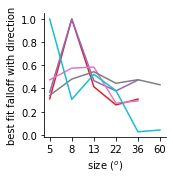

In [ ]:
plt.figure(figsize=(2.5, 2.5))
plt.plot(opt_kappa.T)
plt.xticks(np.arange(6), self.usize)
ut.erase_top_right()
plt.ylabel('best fit falloff with direction')
plt.xlabel('size ($^o$)')
plt.tight_layout()
# plt.savefig('figures/pc_sst_orientation_kernel.eps')

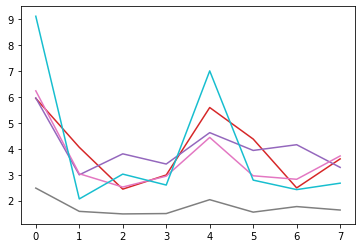

In [ ]:
plt.figure()
plt.plot(sst_arr[:, 4, :].T)

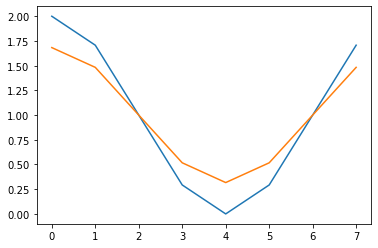

In [ ]:
plt.figure()
plt.plot(signal)
plt.plot(signal_filt)

In [36]:
signal.mean()

0.9999999999999999

In [37]:
from autograd.scipy import signal as ss

In [38]:
# scatter plots showing quality of Ayaz model fits

# for itype in range(5):
#     plt.figure(figsize=(7.5, 2.5))
#     for im, m in enumerate([modeled_sub_ind_n_offset[itype], modeled_div_ind_n_offset[itype], modeled_one_n_offset[itype], modeled_sub_three_n_offset[itype]]):
#         plt.subplot(1, 4, im+1)
#         sca.scatter_size_contrast_errorbar(np.nanmean(rsexpt[irun][itype][ialign], 3), m, equate_0=True)
#     plt.title(itype)
#     plt.figure()
#     for iexpt in range(rsexpt[irun][itype][ialign].shape[0]):
#         plt.subplot(4, 4, iexpt+1)
#         if np.sum(~np.isnan(np.nanmean(rsexpt[irun][itype][ialign], 3)[iexpt])):
#             sca.scatter_size_contrast(np.nanmean(rsexpt[irun][itype][ialign], 3)[iexpt], modeled_sub_ind_n_offset[itype][iexpt])
            

In [39]:
# side-by-side comparison of different Ayaz model fits

# reload(nub_utils)
# reload(sim_utils)
# usize0 = np.concatenate(((0, ), usize))
# fns = [ayaz_model_sub_ind_n_offset_no_delta, ayaz_model_div_ind_n_offset_no_delta, ayaz_model_two_n_offset_no_delta, ayaz_model_sub_three_n_offset_no_delta]

# cfrac = np.linspace(1, 0, this_ncontrast+1)[:-1]
# c_l4 = cfrac[:, np.newaxis]*np.array(((0, 1, 0)))
# c_sst = cfrac[:, np.newaxis]*np.array(((1, 0.65, 0)))
# c_vip = cfrac[:, np.newaxis]*np.array(((1, 0, 1)))
# c_pv = cfrac[:, np.newaxis]*np.array(((0, 0, 1)))
# c_l23 = cfrac[:, np.newaxis]*np.array(((0.5, 0.5, 0.5)))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]

# reload(ut)

# for itype, c in enumerate(colors):
#     if True:#itype==3:
#         plt.figure(figsize=(10, 2.5))

#         these_contrasts = [1, 3, 5]
#         this_ncontrast = len(these_contrasts)
#         this_ucontrast = np.array([ucontrast[i] for i in these_contrasts])
#         this_usize = usize_interp

#         this_data = np.nanmean(rsexpt[irun][itype][ialign], 3)
#         this_data = sim_utils.gen_size_tuning(this_data)
#         for im, (this_theta, fn) in enumerate(zip([theta_sub_ind_n_offset[itype], theta_div_ind_n_offset[itype], theta_two_n_offset[itype], theta_sub_three_n_offset[itype]], fns)):
#             this_modeled = np.nan*np.ones((this_data.shape[0], len(this_usize), this_ncontrast))
#             for iexpt in range(this_data.shape[0]):
#                 this_modeled[iexpt] = nub_utils.ayaz_like_theta(this_ucontrast, this_usize, this_theta[iexpt], fn=fn)
#             plt.subplot(1, 4, im+1)
#             ut.plot_bootstrapped_errorbars_hillel(usize0, this_data[:, :, [1, 3, 5]].transpose((0, 2, 1)), linewidth=0, colors=c)
#             for icontrast in range(this_ncontrast):
#                 plt.plot(usize_interp, np.nanmean(this_modeled, 0)[:, icontrast], c=c[icontrast])
#         plt.title(itype)

#     #     this_theta = theta_one_n_offset[itype]
#     #     fn = ayaz_model_one_n_offset_no_delta
# #         this_theta = theta_sub_three_n_offset[itype]
# #         fn = ayaz_model_sub_three_n_offset_no_delta
#         this_theta = theta_sub_ind_n_offset[itype]
#         fn = ayaz_model_sub_ind_n_offset_no_delta

#         plt.figure()  

#         these_contrasts = [1, 3, 5]
#         this_ncontrast = len(these_contrasts)
#         this_ucontrast = np.array([ucontrast[i] for i in these_contrasts])
#         this_usize = usize_interp

#         for iexpt in range(rsexpt[irun][itype][ialign].shape[0]):
#             plt.subplot(4, 4, iexpt+1)
#             this_data = np.nanmean(rsexpt[irun][itype][ialign][iexpt], -1)
#             this_data = sim_utils.gen_size_tuning(this_data[np.newaxis])[0]
#     #         this_modeled = np.nan*np.ones((len(this_usize), this_ncontrast))
#             this_modeled = nub_utils.ayaz_like_theta(this_ucontrast, this_usize, this_theta[iexpt], fn=fn)
#             ut.plot_bootstrapped_errorbars_hillel(usize0, this_data[np.newaxis, :, these_contrasts].transpose((0, 2, 1)), linewidth=0, colors=c)
#             for icontrast in range(this_ncontrast):
#                 plt.plot(usize_interp, this_modeled[:, icontrast], c=c[icontrast])

#         plt.figure()

#         these_sizes = [0, 2, 4]
#         this_nsize = len(these_sizes)
#         this_usize = np.array([usize[i] for i in these_sizes])
#         this_ucontrast = ucontrast_interp

#         for iexpt in range(rsexpt[irun][itype][ialign].shape[0]):
#             plt.subplot(4, 4, iexpt+1)
#             this_data = np.nanmean(rsexpt[irun][itype][ialign][iexpt], -1)
#     #         this_data = sim_utils.gen_size_tuning(this_data[np.newaxis])[0]
#     #         this_modeled = np.nan*np.ones((len(this_usize), this_ncontrast))
#             this_modeled = nub_utils.ayaz_like_theta(this_ucontrast, this_usize, this_theta[iexpt], fn=fn)
#             ut.plot_bootstrapped_errorbars_hillel(ucontrast, this_data[np.newaxis, these_sizes, :].transpose((0, 1, 2)), linewidth=0, colors=c)
#             for isize in range(this_nsize):
#                 plt.plot(ucontrast_interp, this_modeled[isize, :], c=c[isize])

In [40]:
# reload(ut)
# lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
# c_l4 = np.array((0, 0.5, 0))
# c_l23 = np.array((0.5, 0.5, 0.5))
# c_sst = np.array((1, 0.65, 0))
# c_vip = np.array((1, 0, 1))
# c_pv = np.array((0, 0, 1))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
# usize = np.array((5, 8, 13, 22, 36, 60))
# ucontrast = np.array((0, 6, 12, 25, 50, 100))
# import naka_rushton_analysis as nra
# reload(nra)
# ucontrast = np.array([0, 6, 12, 25, 50, 100])
# c50mis = [None for ialign in range(2)]
# c50s = [None for ialign in range(2)]
# # opt_params = [[[None for itype in range(5)] for irun in range(2)] for ialign in range(2)]
# cmax = 6
# c50cutoff = 99
# for ialign in range(2):
#     c50mis[ialign] = [None for irun in range(2)]
#     c50s[ialign] = [None for irun in range(2)]
#     for irun in range(2):
#         c50mis[ialign][irun] = [None for itype in range(5)]
#         c50s[ialign][irun] = [None for itype in range(5)]
#         for itype in [0, 1, 4]:
# #             irun, ialign = 0, 0
#             nroi = rsexpt[irun][itype][ialign].shape[0]
#             c50s[ialign][irun][itype] = np.nan*np.ones((nroi, 6))
# #             opt_params[ialign][irun][itype] = np.nan*np.ones((nroi, 6))
#             for iroi in range(nroi):
#                 print(iroi)
#             #     this_data, this_error = rs[irun][itype][ialign][iroi], rs_sem[irun][itype][ialign][iroi]
#             #     this_data = np.nanmean(this_data, 2)
#             #     this_error = combine_sem(this_error, 2)
#                 this_data = np.nanmean(rsexpt[irun][itype][ialign][iroi], 2)
#                 lkat = np.all(~np.isnan(this_data), 1)
#                 nparams = np.sum(lkat)
# # #                 opt_params = nra.fit_opt_params_two_n(ucontrast[:cmax], this_data[lkat, :cmax])
# #                 opt_params[ialign][irun][itype][iroi, lkat] = nra.fit_opt_params_monotonic(ucontrast[:cmax], this_data[lkat, :cmax])
#                 opt_params = nra.fit_opt_params_monotonic(ucontrast[:cmax], this_data[lkat, :cmax])
#                 c50s[ialign][irun][itype][iroi, lkat] = opt_params[nparams+1:2*nparams+1]
#             c50s[ialign][irun][itype][c50s[ialign][irun][itype]>c50cutoff] = np.nan
#             c50mis[ialign][irun][itype] = c50s[ialign][irun][itype][:, 0]-c50s[ialign][irun][itype][:, -1]

#             plt.figure(figsize=(2.5, 2.5))
#             plt.plot(usize, c50s[ialign][irun][itype].T, alpha=0.2, c=colors[itype])
#             ut.plot_bootstrapped_errorbars_hillel(usize, c50s[ialign][irun][itype][:, np.newaxis], pct=(16, 84), colors=np.array(colors[itype])[np.newaxis])
# #             ut.plot_parametric_fn(usize, c50s[ialign][irun][itype].T, alpha=0.2, colors=np.array(colors[itype])[np.newaxis])
# #             ut.plot_parametric_fn_errorbars(usize, c50s[ialign][irun][itype][:, np.newaxis], fit_fn=nra.fit_opt_params_two_asymptote_fn, plot_fn=nra.two_asymptote_fn, colors=np.array(colors[itype])[np.newaxis], errorstyle='bs')
#             plt.xlabel('size ($^o$)')
#             plt.ylabel('$C_{50}$')
#             ut.erase_top_right()
#             plt.tight_layout()
# #             plt.savefig('figures/%s_c50_by_size_%s_%s.jpg'%(lbls[itype], running_lbls[irun], alignment_lbls[ialign]), dpi=300)

In [1]:
reload(scf)
reload(ut)
reload(opto_utils)
ca_obj2 = scf.ca_imaging(rsfile)
self = ca_obj2
exptwise = False
self.compute_c50s(first_ind=0, last_ind=5, exptwise=exptwise)
self.compute_csis(first_ind=0, last_ind=5, exptwise=exptwise, xaxis=self.usize, norm_to_max=True)

NameError: name 'reload' is not defined

In [ ]:
opt = {}
opt['filebase'] = 'figures/%s_c50_by_size_%s_%s.jpg'
opt['rsexpt_inds'] = [1,  0,  2]#(lbls[itype], alignment_lbls[ialign])
opt['ind_list'] = [None, None, None]
opt['fn'] = self.plot_c50_vs_size
opt['attr_args'] = ['c50s',  'rsexpt_colors']
opt['add_kwargs'] = {}
scf.fig_gen(opt,  self,  save=False)

# filebase = 'figures/%s_c50_by_size_%s_%s.jpg'
# rsexpt_inds = [1, 0, 2]#%(lbls[itype], running_lbls[irun], alignment_lbls[ialign])
# savefiles = self.gen_rsexpt_filenames(filebase, rsexpt_inds=rsexpt_inds)
# ut.apply_fn_to_nested_lists_no_out(self.plot_c50_vs_size, [None, None, None], self.c50s, self.rsexpt_colors, savefiles)

AttributeError: 'ca_imaging' object has no attribute 'c50s'

In [13]:
reload(scf)
self = scf.ca_imaging(rsfile)
exptwise = False
norm_to_max = True
self.compute_smis(exptwise=exptwise, xaxis=self.ucontrast, norm_to_max=norm_to_max)
self.compute_csis(exptwise=exptwise, xaxis=self.usize, norm_to_max=norm_to_max)

irun, itype, ialign = 0, 1, 0
self.smis[0][0][0].shape
# smis_expt = scf.average_expt_means(self.expt_ids[irun][itype][ialign], self.smis[irun][itype][ialign], self.nexpt[irun][itype][ialign])
# csis_expt = scf.average_expt_means(self.expt_ids[irun][itype][ialign], self.csis[irun][itype][ialign], self.nexpt[irun][itype][ialign])

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:651: RuntimeWarning: Mean of empty slice
  rsexpt[iexpt] = np.nanmean(rso[expt_ids==iexpt],0)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:774: RuntimeWarning: Mean of empty slice
  to_return = np.nanmean(data,-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: invalid value encountered in true_divide
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:779: RuntimeWarning: All-NaN slice encountered
  to_return = to_return - np.nanmin(np.nanmin(to_return,1),1)[:,np.newaxis,np.newaxis]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: All-NaN slice encountered
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/Users/dan/Documents/code/adesnal/siz

(10, 6)

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:651: RuntimeWarning: Mean of empty slice
  rsexpt[iexpt] = np.nanmean(rso[expt_ids==iexpt],0)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:774: RuntimeWarning: Mean of empty slice
  to_return = np.nanmean(data,-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: invalid value encountered in true_divide
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:779: RuntimeWarning: All-NaN slice encountered
  to_return = to_return - np.nanmin(np.nanmin(to_return,1),1)[:,np.newaxis,np.newaxis]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: All-NaN slice encountered
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)


0.5007213714793859
0.4934785219898715
0.7197604258590159
0.31899226382046525
0.5665760437369082
0.5518655980786383
0.6222243702040801
0.7609868875820035


/Users/dan/Documents/code/adesnal/pyute.py:143: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
/Users/dan/Documents/code/adesnal/pyute.py:143: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
/Users/dan/Documents/code/adesnal/pyute.py:143: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
/Users/dan/Documents/code/adesnal/pyute.py:143: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)


0.5402109088902542
0.49610166476140916


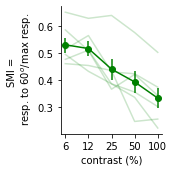

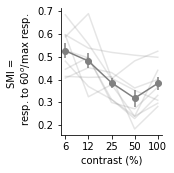

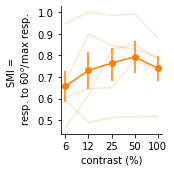

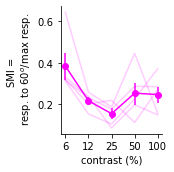

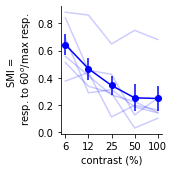

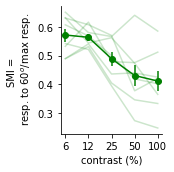

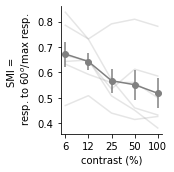

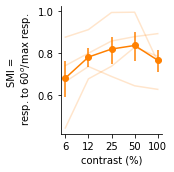

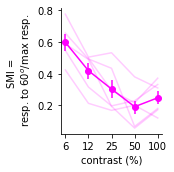

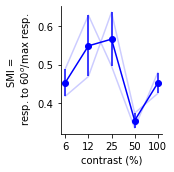

In [228]:
reload(scf)
self = scf.ca_imaging(rsfile)
exptwise = False
self.compute_smis(exptwise=exptwise, xaxis=self.ucontrast, norm_to_max=norm_to_max, big_ind=-2)

opt = {}
opt['filebase'] = 'figures/semilogx_%s_smi_by_contrast_%s.jpg'
opt['rsexpt_inds'] = [1, 0]#%(lbls[itype], running_lbls[irun])
opt['ind_list'] = [None, None, [0]]
# if exptwise:
opt['fn'] = self.plot_smi_vs_contrast_semilogx
# else:
#     opt['fn'] = self.plot_smi_vs_contrast_semilogx_roiwise
opt['attr_args'] = ['smis', 'rsexpt_colors']
opt['add_kwargs'] = {}
scf.fig_gen(opt, self, save=False)

p-value: 0.031250
p-value: 0.003906
p-value: 0.007812
p-value: 0.062500


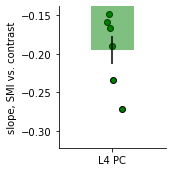

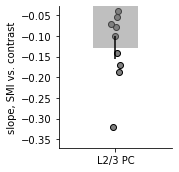

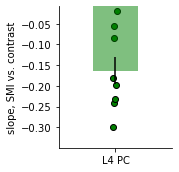

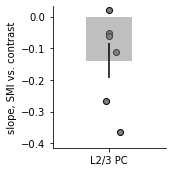

In [54]:
reload(scf)
scf.pc_smimi_bars(self,  mi_type='slope', ylim=True, save=False)

In [48]:
self.smi_last_ind

5

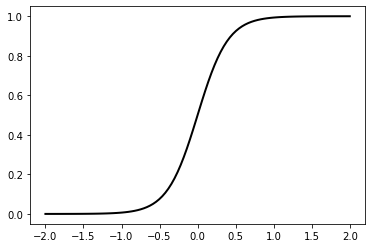

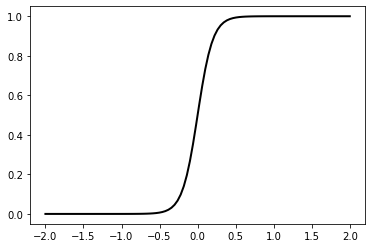

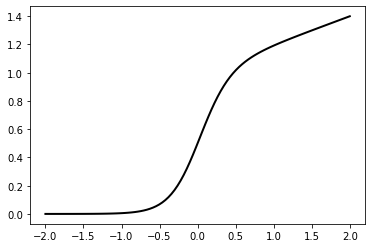

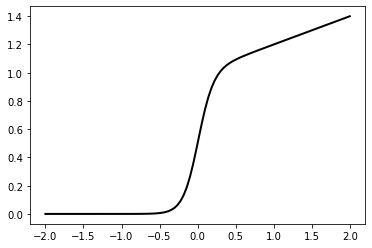

In [115]:
plt.figure()
x = np.linspace(-2, 2, 100)
y = 1/(1+np.exp(-5*x))
plt.plot(x, y, c='k', linewidth=2)
plt.savefig('figures/basic_sigmoid.eps')

plt.figure()
x = np.linspace(-2, 2, 100)
y = 1/(1+np.exp(-10*x))
plt.plot(x, y, c='k', linewidth=2)
plt.savefig('figures/steeper_sigmoid.eps')

plt.figure()
x = np.linspace(-2, 2, 100)
y = (0.2 * x + 1)/(1+np.exp(-5*x))
plt.plot(x, y, c='k', linewidth=2)
plt.savefig('figures/sloped_sigmoid.eps')

plt.figure()
x = np.linspace(-2, 2, 100)
y = (0.2 * x + 1)/(1+np.exp(-10*x))
plt.plot(x, y, c='k', linewidth=2)
plt.savefig('figures/steeper_sloped_sigmoid.eps')

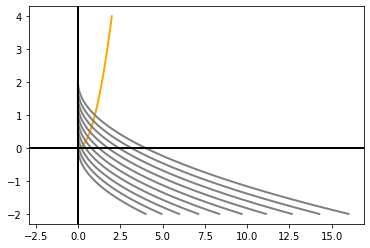

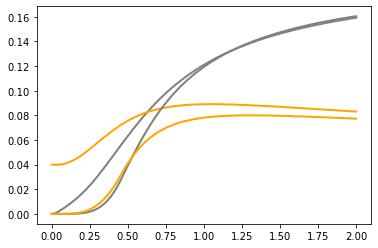

In [142]:
def x_(y, a): return np.maximum(a - y, 0)**2
def y_(x): return np.maximum(x, 0)**2
plt.figure()
xs = np.linspace(-2, 2, 100)
ys = y_(xs)
plt.plot(xs, ys, c='orange', linewidth=2)
ys = np.linspace(-2, 2, 100)
lower = 0
upper = 2
for a in np.linspace(lower, upper, 10):
    xs = x_(ys, a)
    plt.plot(xs, ys, c='gray', linewidth=2)
    plt.axhline(0, c='k', linewidth=2)
    plt.axvline(0, c='k', linewidth=2)

a_list = np.linspace(lower, upper, 100)
solns = []
for a in a_list:
    def cost(x, y):
        return (x - x_(y, a))**2 + (y - y_(x))**2
    cost_ = lambda xy: cost(*xy)
    x0 = np.array([0, 0])
    res = sop.minimize(cost_, x0, method='Nelder-Mead')
    solns.append(res.x)
arr_solns = np.array(solns)

plt.figure()
a_list = np.linspace(lower, upper, 100)
for d in [-0.2, 0.2]:
    solns = []
    for a in a_list:
        def cost(x, y):
            return (x - x_(y, a))**2 + (y - y_(x - d))**2
        cost_ = lambda xy: cost(*xy)
        x0 = np.array([0, 0])
        res = sop.minimize(cost_, x0, method='Nelder-Mead')
        solns.append(res.x)
    arr_solns2 = np.array(solns)

    # plt.figure()
    # plt.plot(a_list, arr_solns[:, 0], c='gray', linewidth=2)
    # plt.plot(a_list, arr_solns[:, 1], c='orange', linewidth=2)
    # plt.plot(a_list, x_(0, a_list) - solns[:, 0], c='k', linewidth=2)

    # plt.figure()
    # plt.plot(a_list, arr_solns2[:, 0], c='gray', linewidth=2, linestyle='--')
    # plt.plot(a_list, arr_solns2[:, 1], c='orange', linewidth=2, linestyle='--')

    # plt.figure()
    for i, color in enumerate(['gray', 'orange']):
        # plt.plot(a_list, arr_solns[:, i], c=color, linewidth=2)
        # plt.plot(a_list, arr_solns2[:, i] - arr_solns[:, i], c=color, linewidth=2)
        plt.plot(a_list, np.abs(arr_solns2[:, i] - arr_solns[:, i]), c=color, linewidth=2)
    # plt.plot(arr_solns[:, 0], arr_solns2[:, 0] - arr_solns[:, 0], c='gray', linewidth=2)
    # plt.plot(arr_solns[:, 1], np.abs(arr_solns2[:, 1] - arr_solns[:, 1]), c='orange', linewidth=2)

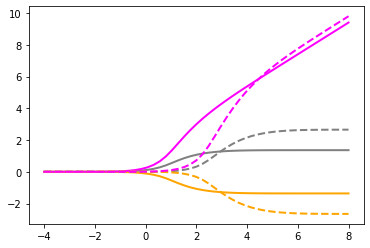

In [182]:
# def f_(u): return np.maximum(u, 0)**2
def f_(u): return sim_utils.f_miller_troyer(u, 1)
def x_(y, a, kxy=1.0): return f_(a - kxy * y)
def y_(x, z, kyx=1.0, kyz=0.2): return f_(kyx * x - kyz * z)
def z_(x, y, kzx=0.2, kzy=1.0, b=1.0): return f_(kzx * x - kzy * y + b)

lower = 0
upper = 1
kyz = 0.7
kzx = 0.1
kyx = 0.5
kxy = 1.3
kzy = 1.3
b = 1.0
# a_list = np.linspace(lower, upper, 100)
# solns = []
# for a in a_list:
#     def cost(x, y, z):
#         return (x - x_(y, a))**2 + (y - y_(x, z, k=kyz))**2 + (z - z_(x, y, k=kzx, b=b))**2
#     cost_ = lambda xyz: cost(*xyz)
#     x0 = np.array([0, 0, 0])
#     res = sop.minimize(cost_, x0, method='Nelder-Mead')
#     solns.append(res.x)
# arr_solns = np.array(solns)

plt.figure()
a_list = (4.0,8.0)#np.linspace(lower, upper, 100)
d_list = np.linspace(-4, 8, 51)
linestyles = [None, '--']
for a, ls in zip(a_list, linestyles):
    solns = []
    for d in d_list:
        def cost(x, y, z):
            return (x - x_(y, a))**2 + (y - y_(x, z, kyx=kyx, kyz=kyz))**2 + (z - z_(x, y, kzx=kzx, kzy=kzy, b=b+d))**2
        cost_ = lambda xyz: cost(*xyz)
        x0 = np.array([0, 0, 0])
        res = sop.minimize(cost_, x0, method='Nelder-Mead')
        solns.append(res.x)
    arr_solns = np.array(solns)

    for i, color in enumerate(['gray', 'orange', 'magenta']):
        plt.plot(d_list, arr_solns[:, i]-arr_solns[0, i], c=color, linewidth=2, linestyle=ls)

    # plt.figure()
    # plt.plot(a_list, arr_solns[:, 0], c='gray', linewidth=2)
    # plt.plot(a_list, arr_solns[:, 1], c='orange', linewidth=2)
    # plt.plot(a_list, x_(0, a_list) - solns[:, 0], c='k', linewidth=2)

    # plt.figure()
    # plt.plot(a_list, arr_solns2[:, 0], c='gray', linewidth=2, linestyle='--')
    # plt.plot(a_list, arr_solns2[:, 1], c='orange', linewidth=2, linestyle='--')

    # # plt.figure()
    # for i, color in enumerate(['gray', 'orange']):#, 'magenta']):
    #     # plt.plot(a_list, arr_solns[:, i], c=color, linewidth=2)
    #     # plt.plot(a_list, arr_solns2[:, i], c=color, linewidth=2, linestyle='--')
    #     plt.plot(a_list, (arr_solns2[:, i] - arr_solns[:, i]), c=color, linewidth=2)
    # # plt.plot(arr_solns[:, 0], arr_solns2[:, 0] - arr_solns[:, 0], c='gray', linewidth=2)
    # # plt.plot(arr_solns[:, 1], np.abs(arr_solns2[:, 1] - arr_solns[:, 1]), c='orange', linewidth=2)

In [166]:
z_(0, 1)

In [59]:
# lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
# c_l4 = np.array((0, 0.5, 0))
# c_l23 = np.array((0.5, 0.5, 0.5))
# c_sst = np.array((1, 0.65, 0))
# c_vip = np.array((1, 0, 1))
# c_pv = np.array((0, 0, 1))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]

# colors_dist = [0.5*c+0.5*np.array((1, 1, 1)) for c in colors]

# both_colors = [colors, colors_dist]

# for itype in [1]:
#     for irun in range(1):
#         plt.figure(figsize=(2.5, 2.5))
#         smi_expts = [None for ialign in range(2)]
#         for ialign in range(2):
#             rs[irun][itype][ialign].shape
#             smi = np.nanmean(rs[irun][itype][ialign], -1)[:, -1, :]/np.nanmax(np.nanmean(rs[irun][itype][ialign], -1), 1)
#             smi_expt = np.nanmean(rsexpt[irun][itype][ialign], -1)[:, -1, :]/np.nanmax(np.nanmean(rsexpt[irun][itype][ialign], -1), 1)
#             smi_expts[ialign] = smi_expt
#             these_expt_ids = expt_ids[irun][itype][ialign]

#             ucontrast = [6, 12, 25, 50, 100]
#             x = np.arange(1, 6)
#     #         plt.plot(x, smi_expt[:, 1:].T, c=colors[itype], alpha=0.2)
#             # for iexpt in range(int(these_expt_ids.max())+1):
#             #     if np.sum(these_expt_ids==iexpt):
#             #         ut.plot_bootstrapped_errorbars_hillel(ucontrast, smi[these_expt_ids==iexpt, np.newaxis, 1:], colors=np.array((0.75, 0.75, 0.75))[np.newaxis])
#             ut.plot_bootstrapped_errorbars_hillel(x, smi_expt[:, np.newaxis, 1:], colors=both_colors[ialign][itype][np.newaxis], pct=(16, 84))
#         plt.xticks(x, ucontrast)
#         plt.ylabel('SMI = \n resp. to 60$^o$/max resp.')
#         plt.xlabel('contrast (%)')
#         ut.erase_top_right()
#         plt.tight_layout()
#         plt.savefig('figures/semilogx_%s_smi_by_contrast_%s_near_far.jpg'%(lbls[itype], running_lbls[irun]), dpi=300)
#         smi_expts = np.concatenate([se[:, :, np.newaxis] for se in smi_expts], axis=2)
#         p = np.zeros((6, ))
#         for icontrast in range(6):
#             this_lkat = ~np.isnan(smi_expts[:, icontrast].sum(1))
#             _, p[icontrast] = sst.wilcoxon(smi_expts[this_lkat, icontrast, 0], smi_expts[this_lkat, icontrast, 1])

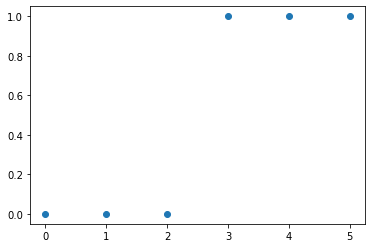

In [230]:
x = np.arange(6)
y = (x > 2).astype('int')
plt.scatter(x, y)
slope, _, _, _, _ = sst.linregress(x, y)

In [60]:
# lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
# c_l4 = np.array((0, 0.5, 0))
# c_l23 = np.array((0.5, 0.5, 0.5))
# c_sst = np.array((1, 0.65, 0))
# c_vip = np.array((1, 0, 1))
# c_pv = np.array((0, 0, 1))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]

# colors_dist = [0.5*c+0.5*np.array((1, 1, 1)) for c in colors]

# both_colors = [colors, colors_dist]

# for itype in [0, 1, 2, 3, 4]:
#     both_these_colors = [colors[itype], colors_dist[itype]]
#     for irun in range(2):
#         plt.figure(figsize=(2.5, 2.5))
#         pref_size = [None for ialign in range(2)]
#         these_expt_ids = [None for ialign in range(2)]
#         for ialign in range(2):
#             pref_size[ialign] = np.argmax(np.nanmean(rsexpt[irun][itype][ialign], -1), 1).astype('float')
#             nan_out = (np.sum(np.isnan(np.nanmean(rsexpt[irun][itype][ialign], -1)), 1)>0)
#             pref_size[ialign][nan_out] = np.nan
# #             these_expt_ids[ialign] = np.unique(expt_ids[irun][itype][ialign])
#         pref_size = np.concatenate([ps[:, :, np.newaxis] for ps in pref_size], axis=2)
#         ut.plot_bootstrapped_errorbars_hillel(np.arange(1, 6), pref_size[:, 1:].transpose((0, 2, 1)), pct=(16, 84), colors=both_these_colors)
#         plt.xticks(np.arange(1, 6), ucontrast)
#         plt.yticks(np.arange(6), usize)
#         plt.xlabel('contrast (%)')
#         plt.ylabel('pref. size ($^o$)')
#         ut.erase_top_right()
#         plt.tight_layout()
#         plt.savefig('figures/%s_pref_size_by_contrast_%s_near_far.jpg'%(lbls[itype], running_lbls[irun]), dpi=300)
#         p = np.nan*np.ones((6, ))
#         for icontrast in range(1, 6):
#             this_lkat = ~np.isnan(pref_size.sum(1).sum(1))
#             try:
#                 _, p[icontrast] = sst.wilcoxon(pref_size[this_lkat, icontrast, 0], pref_size[this_lkat, icontrast, 1])
#             except:
#                 p[icontrast] = np.nan
#         print(p)

In [1]:
rrs, rfs = ut.loadmat('/Users/dan/Documents/data/julia/VIPHaloSizeContNoInterp.mat', ['rrs', 'rfs'])
ucontrast_ephys = np.array([0, 5, 10, 20, 40, 80])
usize_ephys = np.array([8, 20, 60])
usize_ephys0 = np.concatenate(((0, ), usize_ephys))

NameError: name 'ut' is not defined

In [209]:
matfile = '/Users/dan/Documents/data/julia/VIPHaloSizeContNoInterp.mat'
reload(scf)
ephys = scf.ephys(matfile)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

1.907243383597598
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.3916783405645412
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


1.907243383597598
linewidth: 1
plotting
linewidth: 1
plotting
3.6477635756056808
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

plotting
linewidth: 1
plotting
linewidth: 1
plotting
2.8581187729993958
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

3.6477635756056808
linewidth: 1
plotting
linewidth: 1
plotting
2.824034239840092
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

1.9082899827268245
linewidth: 1
plotting
linewidth: 1
plotting
2.7831200319280374
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


6.64054198158223
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

3.6720022572071014
linewidth: 1
plotting
linewidth: 1
plotting
6.64054198158223
linewidth: 1
plotting
linewidth: 1
plotting


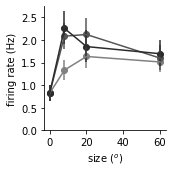

<Figure size 180x180 with 0 Axes>

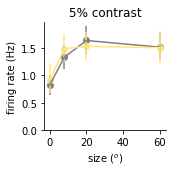

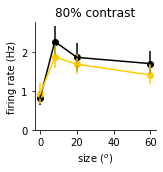

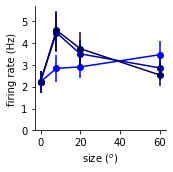

<Figure size 180x180 with 0 Axes>

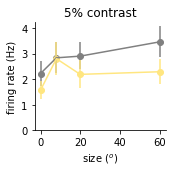

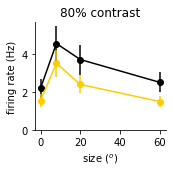

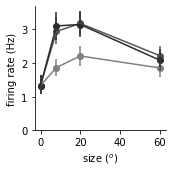

<Figure size 180x180 with 0 Axes>

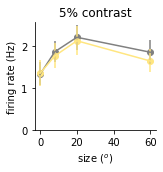

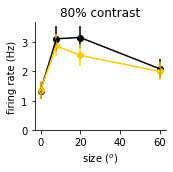

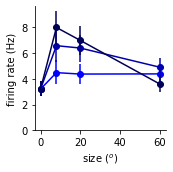

<Figure size 180x180 with 0 Axes>

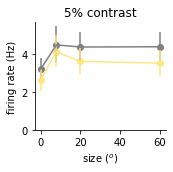

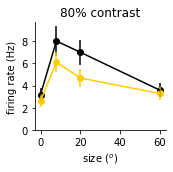

In [182]:
ephys.plot_size_tuning(save_fig=True, show_legend=False)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

2.0111704939768407
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
3.6477635756056808
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

2.847084162328082
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
6.64054198158223
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


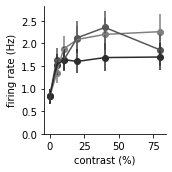

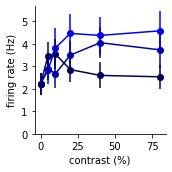

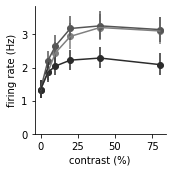

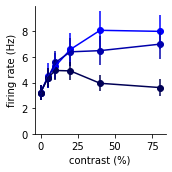

In [129]:
ephys.plot_contrast_tuning(save_fig=True, show_legend=False)

0.4886170076187598
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.5955547071310289
linewidth: 1
plotting
0.5972335710709584
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.6631902593128397
linewidth: 1
plotting
0.4264759072485026
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.4121669271640064
linewidth: 1
plotting
0.5356912882272412
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.6244251369494211
linewidth: 1
plotting
p-value: 0.167807
p-value: 0.073138


/Users/dan/.local/lib/python3.6/site-packages/scipy/stats/morestats.py:2957: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


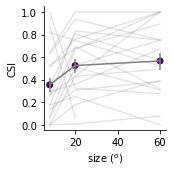

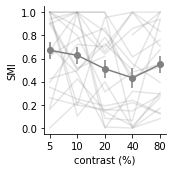

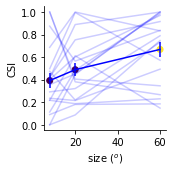

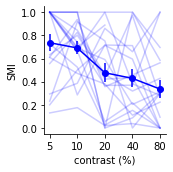

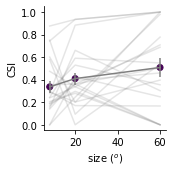

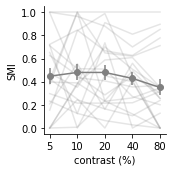

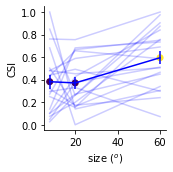

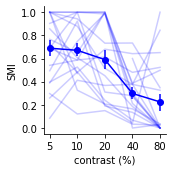

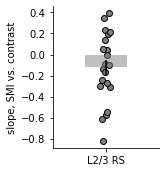

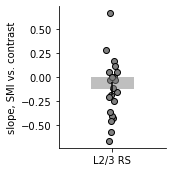

In [232]:
ephys.plot_csi_smi_baseline(norm_to_max=True)

/Users/dan/Documents/code/adesnal/size_contrast_figures.py:768: RuntimeWarning: All-NaN slice encountered
  
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:773: RuntimeWarning: All-NaN slice encountered
  def csi_fn(data,subtract_min=True,avg_last=True):
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:773: RuntimeWarning: invalid value encountered in true_divide
  def csi_fn(data,subtract_min=True,avg_last=True):
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:779: RuntimeWarning: All-NaN slice encountered
  def interp_numeric_c50_fn(data,resolution=501,thresh=0.5,show_fig=False):
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequenc

(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 20)
(8, 20)
(10, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 20)
(40, 80)
(10, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 20)
(8, 20)
(10, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 80)
(8, 60)
(5, 

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.6631902593128397
linewidth: 1
plotting
linewidth: 1
plotting
0.4319033992182525
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.6244251369494211
linewidth: 1
plotting
linewidth: 1
plotting
p-value: 0.585402
p-value: 0.585402
p-value: 0.337660
p-value: 0.038438


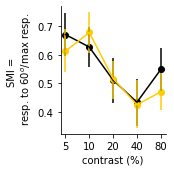

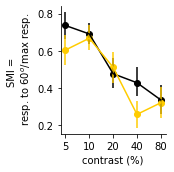

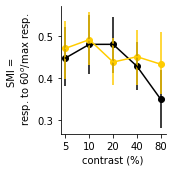

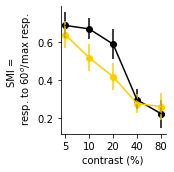

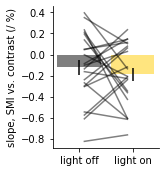

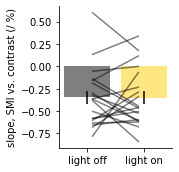

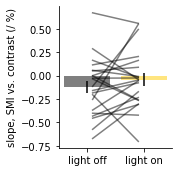

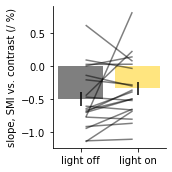

In [210]:
ephys.plot_csi_smi_opto(norm_to_max=True)

In [372]:
# # c_l4 = np.array(((0, 0.3, 0), (0, 0.6, 0), (0, 1, 0)))
# # c_l23 = np.array(((0.5, 0.5, 0.5), (0.25, 0.25, 0.25), (0., 0., 0.)))
# # c_sst = np.array(((0.3, 0.2, 0), (0.6, 0.4, 0), (1, 0.65, 0)))
# # c_vip = np.array(((0.3, 0, 0.3), (0.6, 0, 0.6), (1, 0, 1)))
# # c_pv = np.array(((0, 0, 0.3), (0, 0, 0.6), (0, 0, 1)))
# # colors = [c_l4, c_l23, c_sst, c_vip, c_pv]

# cfrac = np.linspace(1, 0, this_ncontrast+1)[:-1]
# c_l4 = cfrac[:, np.newaxis]*np.array(((0, 1, 0)))
# c_sst = cfrac[:, np.newaxis]*np.array(((1, 0.5, 0)))
# c_vip = cfrac[:, np.newaxis]*np.array(((1, 0, 1)))
# c_pv = cfrac[:, np.newaxis]*np.array(((0, 0, 1)))
# c_l23 = cfrac[:, np.newaxis]*np.array(((0.5, 0.5, 0.5)))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]

In [84]:
# for irun in range(2):
#     for data, c, lbl in zip([rrs[irun], rfs[irun]], [c_l23, c_pv], ['pc_l23', 'pv_l23']):
#         shp = data.shape
#         nexpt = shp[0]
#         nlight = shp[3]
#         size_tuning = np.zeros((shp[0], shp[1]+1, shp[2], shp[3]))
#         for iexpt in range(nexpt):
#             for ilight in range(nlight):
#                 size_tuning[iexpt, :, :, ilight] = gen_size_tuning(data[iexpt, :, :, ilight])

#         plt.figure(figsize=(2.5, 2.5))
#         ut.plot_bootstrapped_errorbars_hillel(usize_ephys0, size_tuning[:, :, [1, 3, 5], 0].transpose((0, 2, 1)), pct=(16, 84), colors=c)
#         plt.legend(['5%', '20%', '80%'])
#         plt.xlabel('size ($^o$)')
#         plt.ylabel('firing rate (Hz)')
#         plt.tight_layout()
#         ut.erase_top_right()
#         plt.savefig('figures/ephys_%s_size_by_3_contrasts_%s_.eps'%(lbl, running_lbls[irun]))

In [85]:
# for irun in range(2):
#     for data, c, lbl in zip([rrs[irun], rfs[irun]], [c_l23, c_pv], ['pc_l23', 'pv_l23']):
#         shp = data.shape
#         nexpt = shp[0]
#         nlight = shp[3]
# #         size_tuning = np.zeros((shp[0], shp[1]+1, shp[2], shp[3]))
# #         for iexpt in range(nexpt):
# #             for ilight in range(nlight):
# #                 size_tuning[iexpt, :, :, ilight] = gen_size_tuning(data[iexpt, :, :, ilight])

#         plt.figure(figsize=(2.5, 2.5))
#         ut.plot_bootstrapped_errorbars_hillel(ucontrast_ephys, data[:, :, :, 0].transpose((0, 1, 2)), pct=(16, 84), colors=c)
#         plt.legend(['8$^o$', '20$^o$', '60$^o$'])
#         plt.xlabel('contrast (%)')
#         plt.ylabel('firing rate (Hz)')
#         plt.tight_layout()
#         ut.erase_top_right()
#         plt.savefig('figures/ephys_%s_contrast_by_3_sizes_%s_.eps'%(lbl, running_lbls[irun]))


In [162]:
#     lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
#     c_l4 = np.array((0, 0.5, 0))
#     c_l23 = np.array((0.5, 0.5, 0.5))
#     c_sst = np.array((1, 0.65, 0))
#     c_vip = np.array((1, 0, 1))
#     c_pv = np.array((0, 0, 1))
#     colors = [c_l23, c_pv]
#     import naka_rushton_analysis as nra
#     reload(nra)
#     ucontrast = np.array([0, 6, 12, 25, 50, 100])
#     c50mis = [None for irun in range(2)]
#     c50s = [None for irun in range(2)]
#     cmax = 6
# # for ialign in range(2):
# #     c50mis[ialign] = [None for irun in range(2)]
# #     c50s[ialign] = [None for irun in range(2)]
#     for irun in range(2):
#         c50mis[irun] = [None for itype in range(2)]
#         c50s[irun] = [None for itype in range(2)]
#         for data, c, lbl, itype in zip([rrs[irun], rfs[irun]], [c_l23, c_pv], ['pc_l23', 'pv_l23'], [0, 1]):
#             nroi = data.shape[0]
#             c50s[irun][itype] = np.nan*np.ones((nroi, 3))
#             for iroi in range(nroi):
#                 print(iroi)
#             #     this_data, this_error = rs[irun][itype][ialign][iroi], rs_sem[irun][itype][ialign][iroi]
#             #     this_data = np.nanmean(this_data, 2)
#             #     this_error = combine_sem(this_error, 2)
#                 this_data = data[iroi, :, :, 0]
#                 lkat = np.all(~np.isnan(this_data), 1)
#                 nparams = np.sum(lkat)
#                 opt_params = nra.fit_opt_params_two_n(np.array(ucontrast_ephys[:cmax]), this_data[lkat, :cmax])
# #                 opt_params = nra.fit_opt_params(ucontrast[:cmax], this_data[lkat, :cmax])
#                 c50s[irun][itype][iroi, lkat] = opt_params[nparams+1:2*nparams+1]
#             c50mis[irun][itype] = c50s[irun][itype][:, 0]-c50s[irun][itype][:, -1]

#             plt.figure(figsize=(2.5, 2.5))
#             plt.plot(usize_ephys, c50s[irun][itype].T, alpha=0.2, c=colors[itype])
#             ut.plot_bootstrapped_errorbars_hillel(usize_ephys, c50s[irun][itype][:, np.newaxis], pct=(16, 84), colors=np.array(colors[itype])[np.newaxis])
#             plt.xlabel('size ($^o$)')
#             plt.ylabel('$C_{50}$')
#             ut.erase_top_right()
#             plt.tight_layout()
#             plt.savefig('figures/ephys_%s_c50_by_size_%s_%s.jpg'%(lbls[itype], running_lbls[irun], alignment_lbls[ialign]), dpi=300)

In [159]:
# for irun in range(2):
#     for itype in range(2):
#         _, p = sst.wilcoxon(c50mis[irun][itype])
#         print(p)

In [440]:
# lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
# c_l4 = np.array((0, 0.5, 0))
# c_l23 = np.array((0.5, 0.5, 0.5))
# c_sst = np.array((1, 0.65, 0))
# c_vip = np.array((1, 0, 1))
# c_pv = np.array((0, 0, 1))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]

In [160]:
# smimis = [None for irun in range(2)]
# p = [None for irun in range(2)]
# for irun in range(2):
#     smimis[irun] = [None for itype in range(2)]
#     p[irun] = [None for itype in range(2)]
#     for itype, data, c, lbl in zip([0, 1], [rrs[irun], rfs[irun]], [c_l23, c_pv], ['pc_l23', 'pv_l23']):
#         shp = data.shape
#         nexpt = shp[0]
#         nlight = shp[3]
#         smi_expt = data[:, -1, :, 0]/np.nanmax(data[:, :, :, 0], 1)
#         plt.figure(figsize=(2.5, 2.5))
#         ucontrast = [5, 10, 20, 40, 80]
#         plt.plot(ucontrast, smi_expt[:, 1:].T, c=c, alpha=0.2)
#         ut.plot_bootstrapped_errorbars_hillel(ucontrast, smi_expt[:, np.newaxis, 1:], colors=c[np.newaxis], pct=(16, 84))
# #         plt.legend(['5%', '20%', '80%'])
# #         plt.xlabel('size ($^o$)')
#         plt.ylabel('SMI = \n resp. to 60$^o$/max resp.')
#         plt.xlabel('contrast (%)')
        
#         plt.tight_layout()
        
#         smimis[irun][itype] = smi_expt[:, 1]-smi_expt[:, -1]
#         ut.erase_top_right()
#         plt.savefig('figures/ephys_%s_c50_by_size_%s.jpg'%(lbl, running_lbls[irun]), dpi=300)
#         _, p[irun][itype] = sst.wilcoxon(smi_expt[:, 1], smi_expt[:, -1])

In [161]:
# epsilon = 0.05
# colors = [(0.5, 0.5, 0.5), (0, 0, 1)]
# for irun in range(2):
#     plt.figure(figsize=(2.5, 2.5))
#     for iitype, itype in enumerate([0, 1]):
#         smimi = smimis[irun][itype].copy()
#         plt.bar((iitype, ), np.nanmean(smimi, 0), color=colors[itype], alpha=0.5)
#         plt.errorbar((iitype, ), np.nanmean(smimi, 0), np.nanstd(smimi, 0)/np.sqrt(np.sum(~np.isnan(smimi), 0)), fmt='none', c='k')
#         plt.scatter(iitype*np.ones_like(smimi)+epsilon*np.random.randn(smimi.shape[0]), smimi, facecolor=colors[itype], linewidth=1, edgecolor='k')
#     # plt.plot((0+epsilon, 1-epsilon), smimi.T, c='k', alpha=0.5)
#     plt.xticks((0, 1, 2), ['L2/3 PC', 'L2/3 PV'])
#     plt.ylabel('SMI at 6% - SMI at 100%')
#     plt.tight_layout()
# # _, p = sst.wilcoxon(smimi[:, 0], smimi[:, 1])
# # print(p)
#     ut.erase_top_right()
#     plt.savefig('figures/ephys_pc_pv_smimi_bars_%s.jpg'%(running_lbls[irun]), dpi=300)

In [183]:
# halo_colors = [np.array((0, 0, 0)), np.array((1, 0.8, 0))]
# smimis = [None for irun in range(2)]
# p = [None for irun in range(2)]
# for irun in range(2):
#     smimis[irun] = [None for itype in range(2)]
#     p[irun] = [None for itype in range(2)]
#     for itype, data, c, lbl in zip([0, 1], [rrs[irun], rfs[irun]], [c_l23, c_pv], ['pc_l23', 'pv_l23']):
#         shp = data.shape
#         nexpt = shp[0]
#         nlight = shp[3]
#         smi_expt = data[:, -1, :, :]/np.nanmax(data[:, :, :, :], 1)
#         plt.figure(figsize=(2.5, 2.5))
#         ucontrast = [5, 10, 20, 40, 80]
# #         plt.plot(ucontrast, smi_expt[:, 1:, ilight].T, c=c, alpha=0.2)
#         ut.plot_bootstrapped_errorbars_hillel(ucontrast, smi_expt[:, 1:, :].transpose((0, 2, 1)), pct=(16, 84), colors=halo_colors)
# #         plt.legend(['5%', '20%', '80%'])
# #         plt.xlabel('size ($^o$)')
#         plt.ylabel('SMI = \n resp. to 60$^o$/max resp.')
#         plt.xlabel('contrast (%)')
        
#         plt.tight_layout()
        
#         smimis[irun][itype] = smi_expt[:, 1]-smi_expt[:, -1]
#         ut.erase_top_right()
#         plt.savefig('figures/ephys_vip_halo_%s_smi_by_size_%s.jpg'%(lbl, running_lbls[irun]), dpi=300)
# #         _, p[irun][itype] = sst.wilcoxon(smi_expt[:, 1], smi_expt[:, -1])

In [189]:
# halo_colors = [np.array((0, 0, 0)), np.array((1, 0.8, 0))]
# itype = 0
# running_lbls = ['non_running', 'running']
# for irun in range(2):
#     for itype, lbl in zip(range(2), ['pc_l23', 'pv_l23']):
#         plt.figure(figsize=(2.5, 2.5))
#         data = smimis[irun][itype]
#         epsilon = 0.1
#         colors = ['k', np.array((1, 0.8, 0))]
#         for ilight in range(2):
#             plt.bar((ilight, ), np.nanmean(data, 0)[ilight], color=halo_colors[ilight], alpha=0.5)
#         plt.errorbar((0, 1), np.nanmean(data, 0), np.nanstd(data, 0)/np.sqrt(np.sum(~np.isnan(data[:, 0]), 0)), fmt='none', c='k')
#         plt.plot((0+epsilon, 1-epsilon), data.T, c='k', alpha=0.5)
#         plt.xticks((0, 1), ['light off', 'light on'])
#         plt.ylabel('SMI at 6% - SMI at 100%')
#     #     plt.ylim((0, 12))
#         ut.erase_top_right()
#         plt.tight_layout()
#         _, p = sst.wilcoxon(data[:, 0], data[:, 1])
#         print(p)
#         plt.savefig('figures/ephys_vip_halo_%s_smimi_bars_%s.jpg'%(lbl, running_lbls[irun]), dpi=300)

In [190]:
# import sim_utils
# # data = scallanimal.copy()
# datas = [rrs, rfs]
# for irun in range(2):
#     for this_data, lbl in zip(datas, ['pc_l23', 'pv_l23']):
#         data = this_data[irun]
#         size_tuning = np.zeros((data.shape[0], 1+data.shape[1], data.shape[2], data.shape[3]))
#         for ilight in range(2):
#             size_tuning[:, :, :, ilight] = sim_utils.gen_size_tuning(data[:, :, :, ilight]) #[:, :, icontrast, :].transpose((0, 2, 1)).shape
#         ephys_usize = np.array((8, 20, 60))
#         ephys_ucontrast = np.array((0, 5, 10, 20, 40, 80))
#         usize0 = np.concatenate(((0, ), ephys_usize))

#         colors = [np.array(((0.5, 0.5, 0.5), (1, 0.9, 0.5))), np.array(((0, 0, 0), (1, 0.8, 0)))]
#         for iicontrast, icontrast in enumerate([1, 5]):
#             plt.figure(figsize=(2.5, 2.5))
#             ut.plot_bootstrapped_errorbars_hillel(usize0, size_tuning[:, :, icontrast, :].transpose((0, 2, 1)), pct=(16, 84), colors=colors[iicontrast])
#             plt.xlabel('size ($^o$)')
#         #     plt.ylabel('event rate (a.u.)')
#             plt.ylabel('firing rate (Hz)')
#         #     plt.legend(['light off', 'light on'])
#             plt.title('%d%% contrast'%ephys_ucontrast[icontrast])
#             plt.tight_layout()
#             ut.erase_top_right()
#             plt.savefig('figures/ephys_vip_halo_%s_size_by_contrast_%d_%s.eps'%(lbl, icontrast, running_lbls[irun]))

In [192]:
# import sim_utils
# # data = scallanimal.copy()
# datas = [rrs, rfs]
# for irun in range(2):
#     for this_data, lbl in zip(datas, ['pc_l23', 'pv_l23']):
#         data = this_data[irun]
#         size_tuning = np.zeros((data.shape[0], 1+data.shape[1], data.shape[2], data.shape[3]))
#         for ilight in range(2):
#             size_tuning[:, :, :, ilight] = sim_utils.gen_size_tuning(data[:, :, :, ilight]) #[:, :, icontrast, :].transpose((0, 2, 1)).shape
#         ephys_usize = np.array((8, 20, 60))
#         ephys_ucontrast = np.array((0, 5, 10, 20, 40, 80))
#         usize0 = np.concatenate(((0, ), ephys_usize))

#         colors = [np.array(((0.5, 0.5, 0.5), (1, 0.9, 0.5))), np.array(((0, 0, 0), (1, 0.8, 0)))]
#         for iicontrast, icontrast in enumerate([1, 5]):
#             plt.figure(figsize=(2.5, 2.5))
#             ut.plot_bootstrapped_errorbars_hillel(usize0, size_tuning[:, :, icontrast, :].transpose((0, 2, 1)), pct=(16, 84), colors=colors[iicontrast])
#             plt.xlabel('size ($^o$)')
#         #     plt.ylabel('event rate (a.u.)')
#             plt.ylabel('firing rate (Hz)')
#         #     plt.legend(['light off', 'light on'])
#             plt.title('%d%% contrast'%ephys_ucontrast[icontrast])
#             plt.tight_layout()
#             ut.erase_top_right()
# #             plt.savefig('figures/ephys_vip_halo_%s_size_by_contrast_%d_%s.eps'%(lbl, icontrast, running_lbls[irun]))

In [193]:
plt.figure(figsize=(2.5, 2.5))
data = rfs_orig[irun][:, 0, :]
epsilon = 0.1
colors = ['k', np.array((1, 0.8, 0))]
for ilight in range(2):
    plt.bar((ilight, ), np.nanmean(data, 0)[ilight], color=colors[ilight], alpha=0.5)
plt.errorbar((0, 1), np.nanmean(data, 0), np.nanstd(data, 0)/np.sqrt(np.sum(~np.isnan(data[:, 0]), 0)), fmt='none', c='k')
plt.plot((0+epsilon, 1-epsilon), data.T, c='k', alpha=0.5)
plt.xticks((0, 1), ['light off', 'light on'])
plt.ylabel('FS firing rate,  gray screen')
plt.ylim((0, 12))
ut.erase_top_right()
plt.tight_layout()
_, p = sst.wilcoxon(data[:, 0], data[:, 1])
print(p)
# plt.savefig('figures/halo_rs_gray_screen_bars.jpg', dpi=300)

NameError: name 'rfs_orig' is not defined

<Figure size 180x180 with 0 Axes>

In [71]:
def compute_mean_sem(x):
    xmean = np.nanmean(x, 0)
    n_non_nan = np.sum(~np.isnan(x), 0)
    xsem = np.nanstd(x, 0)/np.sqrt(n_non_nan)
    return xmean, xsem
def compute_mean_sem_zero_nonzero(x):
    xmean, xsem = compute_mean_sem(x)
    lkat = ~np.isnan(xsem[:, 0])
    xmean[lkat, 0] = np.nanmean(xmean[lkat, 0])
    xsem[lkat, 0] = np.sqrt(np.nansum(xsem[lkat, 0]**2))/np.sum(lkat)
    return xmean, xsem

<IPython.core.display.Javascript object>


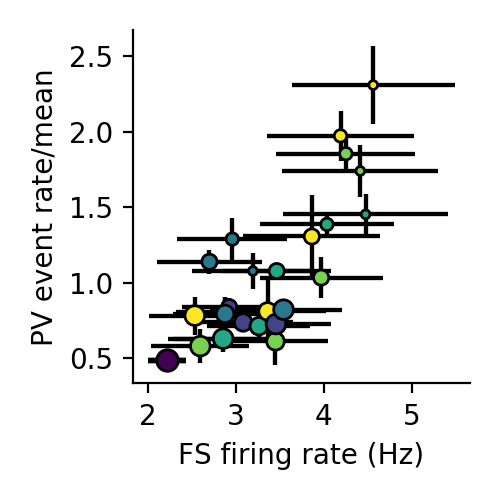

(0.8385671925212623, 7.238058787204119e-09)


<IPython.core.display.Javascript object>


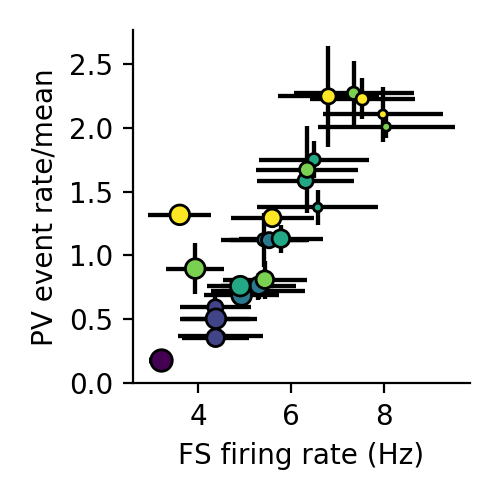

(0.906794829609967, 5.132305389059603e-12)


In [96]:
irun, itype, ialign = 0, 4, 0
running_lbls = ['non_running', 'running']
for irun in range(2):
    plt.figure(figsize=(2.5, 2.5))
    x = rfs[irun][:, :, :, 0]
    xmean, xsem = compute_mean_sem_zero_nonzero(x)
    y = np.nanmean(rsexpt[irun][itype][ialign], -1)
    y = y/np.nanmean(np.nanmean(y, 1), 1)[:, np.newaxis, np.newaxis]
    ymean, ysem = compute_mean_sem_zero_nonzero(y)
    lkat = ~np.isnan(ymean) & ~np.isnan(xmean)
    plt.errorbar(xmean[lkat], ymean[lkat], yerr=ysem[lkat], xerr=xsem[lkat], fmt='none', c='k', zorder=1)
    # sca.scatter_size_contrast(xmean[lkat].reshape((5, 6)), ymean[lkat].reshape((5, 6)), equality_line=False, square=False, equate_0=True)
    sca.scatter_size_contrast_errorbar(x[:, lkat].reshape((-1, 5, 6)), y[:, lkat].reshape((-1, 5, 6)), equality_line=False, square=False, equate_0=True)
    plt.xlabel('FS firing rate (Hz)')
    plt.ylabel('PV event rate/mean')
    plt.tight_layout()
    ut.erase_top_right()
    plt.savefig('figures/fs_ca_comparison_%s.eps'%running_lbls[irun])

    slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(np.nanmean(x[:, lkat], 0).flatten(),  np.nanmean(y[:, lkat], 0).flatten())
    print((r_value, p_value))

<IPython.core.display.Javascript object>


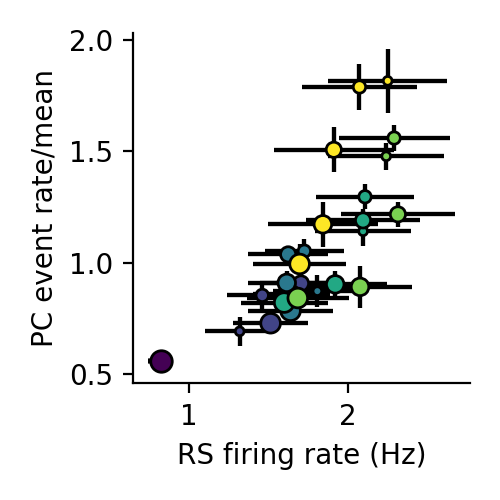

(0.823669263177361, 2.259135161771641e-08)


<IPython.core.display.Javascript object>


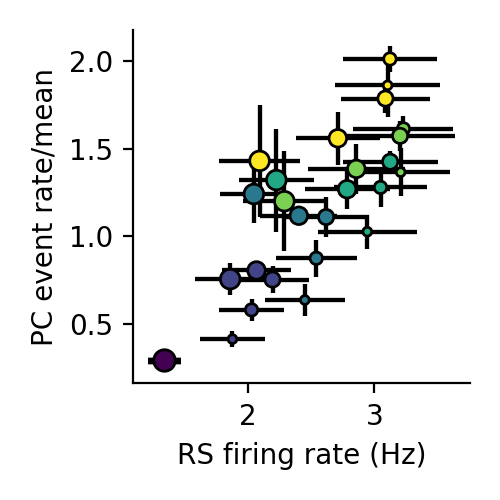

(0.8637795608556368, 7.910321134822828e-10)


In [97]:
irun, itype, ialign = 0, 1, 0
running_lbls = ['non_running', 'running']
for irun in range(2):
    plt.figure(figsize=(2.5, 2.5))
    x = rrs[irun][:, :, :, 0]
    xmean, xsem = compute_mean_sem_zero_nonzero(x)
    y = np.nanmean(rsexpt[irun][itype][ialign], -1)
    y = y/np.nanmean(np.nanmean(y, 1), 1)[:, np.newaxis, np.newaxis]
    ymean, ysem = compute_mean_sem_zero_nonzero(y)
    lkat = ~np.isnan(ymean) & ~np.isnan(xmean)
    plt.errorbar(xmean[lkat], ymean[lkat], yerr=ysem[lkat], xerr=xsem[lkat], fmt='none', c='k', zorder=1)
    # sca.scatter_size_contrast(xmean[lkat].reshape((5, 6)), ymean[lkat].reshape((5, 6)), equality_line=False, square=False, equate_0=True)
    sca.scatter_size_contrast_errorbar(x[:, lkat].reshape((-1, 5, 6)), y[:, lkat].reshape((-1, 5, 6)), equality_line=False, square=False, equate_0=True)
    plt.xlabel('RS firing rate (Hz)')
    plt.ylabel('PC event rate/mean')
    plt.tight_layout()
    ut.erase_top_right()
    plt.savefig('figures/rs_ca_comparison_%s.eps'%running_lbls[irun])

    slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(np.nanmean(x[:, lkat], 0).flatten(),  np.nanmean(y[:, lkat], 0).flatten())
    print((r_value, p_value))

In [165]:
def compute_sem(arr, axis=0):
    n_non_nan = np.sum(~np.isnan(arr), axis=axis)
    return np.nanstd(arr, axis=axis)/np.sqrt(n_non_nan)

In [40]:
self.rsexpt_colors_for_2d[irun][itype][ialign]

array([0., 1., 0.])

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


<IPython.core.display.Javascript object>


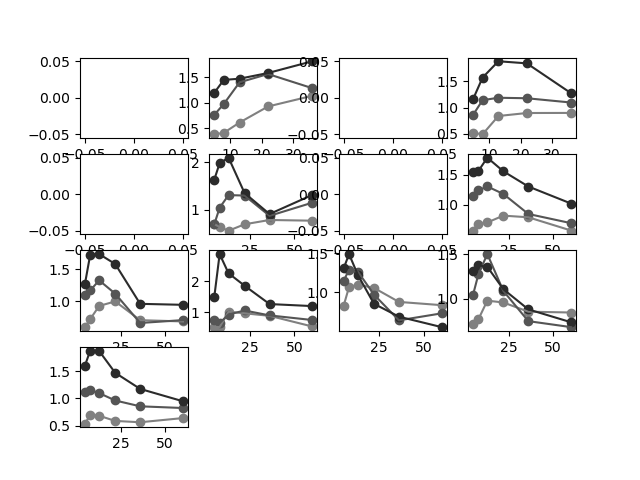

/Users/dan/Documents/code/adesnal/pyute.py:928: RuntimeWarning: Mean of empty slice
  mn_tgt = np.nanmean(arr,0)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/Users/dan/Documents/code/adesnal/pyute.py:930: RuntimeWarning: All-NaN slice encountered
  print(np.nanmax(lb_tgt))
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


nan
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.808860024313714
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
nan
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.8802944572312086
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
nan
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/Users/dan/Documents/code/adesnal/pyute.py:928

2.0938249787890175
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
nan
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

1.786247395633868
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.7394569348173996
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
2.8635277666307686
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.4885923158307852
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.5008577812501125
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.882738613848388
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


<IPython.core.display.Javascript object>


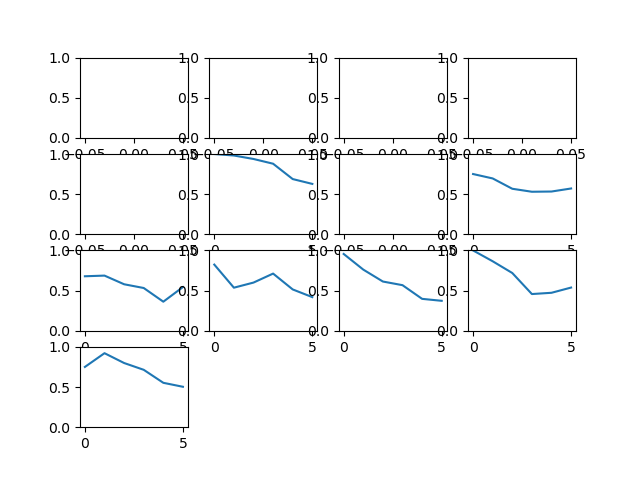

In [45]:
irun = 0
itype = 1
ialign = 0
data = np.nanmean(self.rsexpt[irun][itype][ialign], -1)
colors = self.rsexpt_colors_for_2d[irun][itype][ialign]
isizes = [1, 3, 5]
colors2d = self.gen_2d_colors(len(isizes), celltype_colors=[colors])[0]
plt.figure()
for iexpt in range(data.shape[0]):
    plt.subplot(4, 4, iexpt+1)
    ut.plot_bootstrapped_errorbars_hillel([5, 8, 13, 22, 36, 60], data[iexpt:iexpt+1, :, isizes].transpose((0, 2, 1)), pct=(16, 84), colors=colors2d)
    
smi = data[:, -1, :]/np.max(data, axis=1)
plt.figure()
for iexpt in range(data.shape[0]):
    plt.subplot(4, 4, iexpt+1)
    plt.plot(smi[iexpt])
    plt.ylim((0, 1))

In [353]:
reload(scf)
self = scf.ca_imaging(rsfile)
self.fit_ayaz_models()

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/opto_utils.py:325: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rs_sort[ir][iroi] = rs_sort[ir][iroi][slicer]
/Users/dan/Documents/code/adesnal/opto_utils.py:328: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  others_sort[iother][ir][iroi] = others_sort[iother][ir][iroi][other_slicers[iother]]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:378: Runti

(10, 6, 6, 8)
(10, 6, 6, 8)
(13, 6, 6, 8)
(13, 6, 6, 8)
(10, 6, 6, 8)
(10, 6, 6, 8)
(13, 6, 6, 8)
(13, 6, 6, 8)
(7, 6, 6, 8)
(7, 6, 6, 8)
(10, 6, 6, 8)
(10, 6, 6, 8)
(13, 6, 6, 8)
(13, 6, 6, 8)
(10, 6, 6, 8)
(10, 6, 6, 8)
(13, 6, 6, 8)
(13, 6, 6, 8)
(7, 6, 6, 8)
(7, 6, 6, 8)


/Users/dan/Documents/code/adesnal/size_contrast_figures.py:110: RuntimeWarning: Mean of empty slice
  data = np.nanmean(rsexpt,self.ori_dim)
/Users/dan/Documents/code/adesnal/naka_rushton_analysis.py:477: RuntimeWarning: divide by zero encountered in double_scalars
  
/Users/dan/Documents/code/adesnal/naka_rushton_analysis.py:478: RuntimeWarning: divide by zero encountered in double_scalars
  self.theta0 = theta0
/Users/dan/Documents/code/adesnal/nub_utils.py:236: RuntimeWarning: divide by zero encountered in double_scalars
  return 0.5*(ssp.erf((0.5*diam - mu)/np.sqrt(2*sigma2)) - ssp.erf((-0.5*diam - mu)/np.sqrt(2*sigma2)))
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: divide by zero encountered in true_divide
  return f_raw(*args, **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:52: RuntimeWarning: invalid value encountered in double_scalars
  defvjp(anp.true_divide, lambda ans, x, y : unbroadcast

In [360]:
# ninterp = 101
# usize_interp = np.linspace(0, usize[-1], ninterp)
# ucontrast_interp = np.linspace(0, 1, ninterp)

# div = True
# reload(nub_utils)
# reload(sim_utils)
# import naka_rushton_analysis as nra
# usize0 = np.concatenate(((0, ), usize))
# # fns = [fn]
# # fns = [nub_utils.ayaz_model_div_ind_n_one_ss_offset]
# if div:
#     fns = [nub_utils.ayaz_model_div_ind_n_offset]
#     chosen_theta = [aa.theta for aa in [self.ams_all[irun][itype][ialign] for itype in range(self.ncelltype)]]#theta_sub_ind_n_all
# else:
# #     fns = [nub_utils.ayaz_model_sub_ind_n_offset]
#     fns = [nub_utils.ayaz_model_sub_ind_n_one_ss_offset]
#     chosen_theta = [aa.theta for aa in [self.ams_all[irun][itype][ialign] for itype in range(self.ncelltype)]]#theta_sub_ind_n_all
# reload(nra)

# these_contrasts = [1, 3, 5]
# this_ncontrast = len(these_contrasts)

# cfrac = np.linspace(1, 0, this_ncontrast+1)[:-1]
# c_l4 = cfrac[:, np.newaxis]*np.array(((0, 1, 0)))
# c_sst = cfrac[:, np.newaxis]*np.array(((1, 0.65, 0)))
# c_vip = cfrac[:, np.newaxis]*np.array(((1, 0, 1)))
# c_pv = cfrac[:, np.newaxis]*np.array(((0, 0, 1)))
# c_l23 = cfrac[:, np.newaxis]*np.array(((0.5, 0.5, 0.5)))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
        
# plt.figure(figsize=(12.5, 2.5))
# for itype, c in enumerate(colors):
#     if True:#itype==3:
#         plt.subplot(1, 5, itype+1)
#         these_contrasts = [1, 3, 5]
#         this_ncontrast = len(these_contrasts)
#         this_ucontrast = np.array([ucontrast[i] for i in these_contrasts])
#         this_usize = usize_interp

#         this_data = np.nanmean(rsexpt[irun][itype][ialign], 3)
#         this_data = sim_utils.gen_size_tuning(this_data)
#         for im, (this_theta, fn) in enumerate(zip([chosen_theta[itype]], fns)):
#             this_modeled = nub_utils.ayaz_like_theta(this_ucontrast, this_usize, this_theta, fn=fn)
#             ut.plot_bootstrapped_errorbars_hillel(usize0, this_data[:, :, [1, 3, 5]].transpose((0, 2, 1)), linewidth=0, colors=c)
#             for icontrast in range(this_ncontrast):
#                 plt.plot(usize_interp, this_modeled[:, icontrast], c=c[icontrast])
#         ut.erase_top_right()
#         plt.title(self.celltype_lbls[itype])
#         plt.xlabel('size ($^o$)')
#         plt.ylabel('event rate/mean')
#         plt.tight_layout()
        
# plt.figure(figsize=(12.5, 2.5))
# for itype, c in enumerate(colors):
#     if True:#itype==3:
#         plt.subplot(1, 5, itype+1)        
#         these_sizes = [0, 2, 4]
#         this_nsize = len(these_sizes)
#         this_usize = np.array([usize[i] for i in these_sizes])
#         this_ucontrast = ucontrast_interp
        
#         this_data = np.nanmean(rsexpt[irun][itype][ialign], 3)
#         for im, (this_theta, fn) in enumerate(zip([chosen_theta[itype]], fns)):
#             this_modeled = nub_utils.ayaz_like_theta(this_ucontrast, this_usize, this_theta, fn=fn)
#             ut.plot_bootstrapped_errorbars_hillel(100*ucontrast, this_data[:, these_sizes, :].transpose((0, 1, 2)), linewidth=0, colors=c)
#             for isize in range(this_nsize):
#                 plt.plot(100*ucontrast_interp, this_modeled[isize, :], c=c[isize])
#         ut.erase_top_right()
#         plt.title(self.celltype_lbls[itype])
#         plt.xlabel('contrast (%)')
#         plt.ylabel('event rate/mean')
#         plt.tight_layout()

<IPython.core.display.Javascript object>


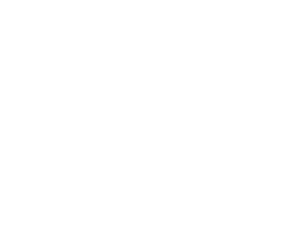

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(1, 7, 6)
1.5029043423508963
linewidth: 0
linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


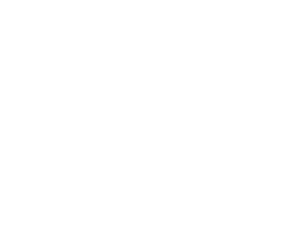

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(1, 7, 6)
1.412644131502623
linewidth: 0
linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


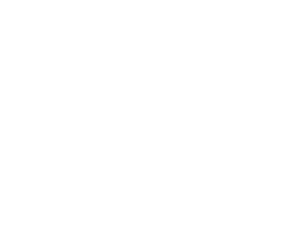

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(1, 7, 6)
1.7667676518740751
linewidth: 0
linewidth: 0
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


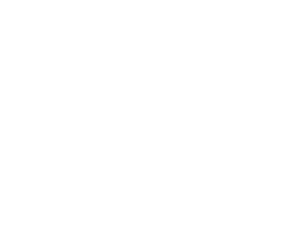

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(1, 7, 6)
1.6322258068477706
linewidth: 0
linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


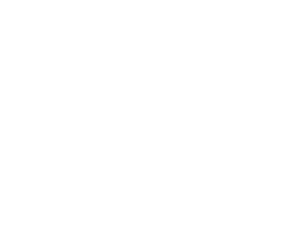

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(1, 7, 6)
3.452057600800515
linewidth: 0
linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


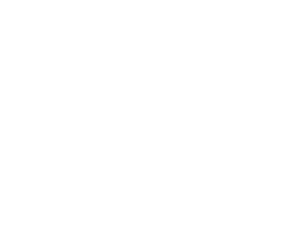

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(1, 7, 6)
4.126927687432527
linewidth: 0
linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


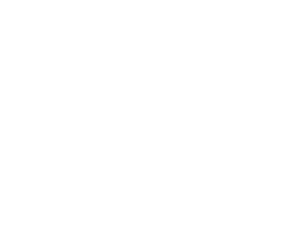

(1, 7, 6)
2.1521330909631367
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


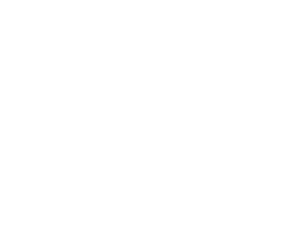

(1, 7, 6)
1.6362094731147911
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


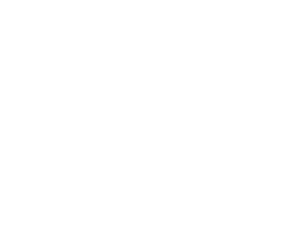

(1, 7, 6)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


2.149612230089103
linewidth: 0
linewidth: 0
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


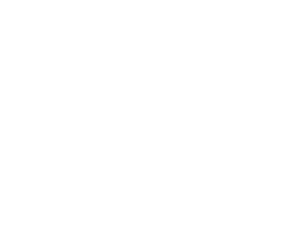

(1, 7, 6)
1.7810692632326348
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


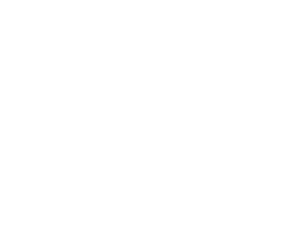

(1, 7, 6)
1.6253195068228625
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


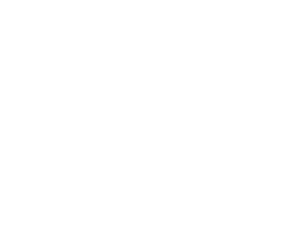

(1, 7, 6)
1.6349275618983417
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0


<IPython.core.display.Javascript object>


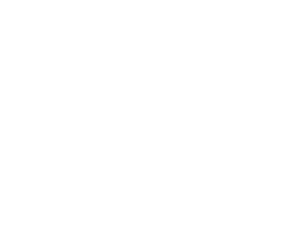

(1, 7, 6)
2.0283972727493
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


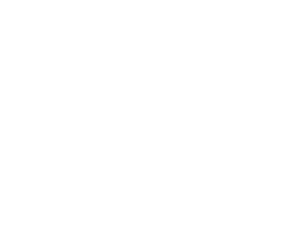

(1, 7, 6)
1.904290610304685
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


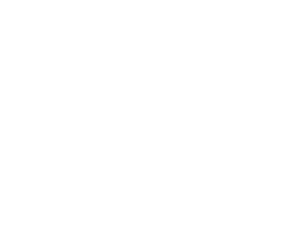

(1, 7, 6)
3.652205993663529
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0


<IPython.core.display.Javascript object>


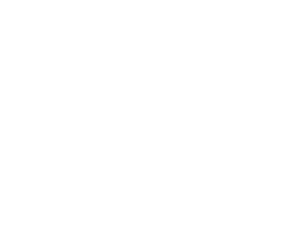

(1, 7, 6)
3.0956855474488907
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0


<IPython.core.display.Javascript object>


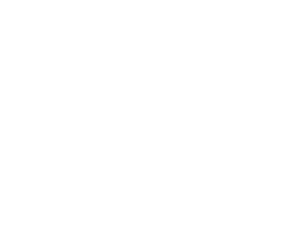

(1, 7, 6)
1.428931399565401
linewidth: 0


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


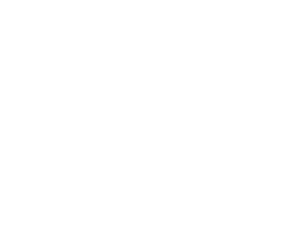

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(1, 7, 6)
1.636519560755919
linewidth: 0
linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


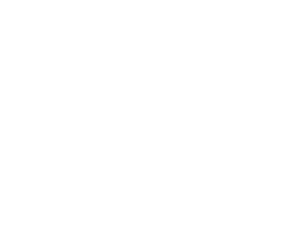

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(1, 7, 6)
2.046979253073106
linewidth: 0
linewidth: 0
linewidth: 0


<IPython.core.display.Javascript object>


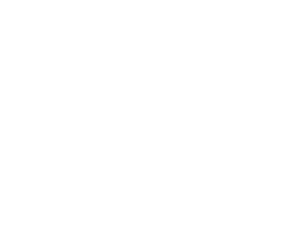

(1, 7, 6)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.



2.655330363262529
linewidth: 0
linewidth: 0
linewidth: 0


In [242]:
reload(scf)
scf.interp_size_tuning(self)

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/opto_utils.py:325: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rs_sort[ir][iroi] = rs_sort[ir][iroi][slicer]
/Users/dan/Documents/code/adesnal/opto_utils.py:328: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  others_sort[iother][ir][iroi] = others_sort[iother][ir][iroi][other_slicers[iother]]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:400: Runti

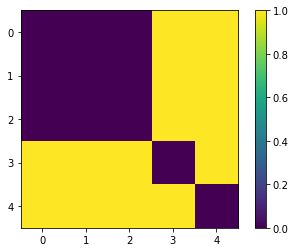

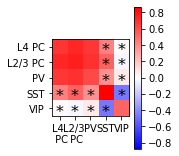

In [14]:
plt.close('all')
reload(scf)
ca_obj2 = scf.ca_imaging(rsfile)
self = ca_obj2
self.compute_ccs(show_fig=True, pval_cutoff=0.05)
colors = self.celltype_colors_for_2d
nlines = 3
self.colors2d = scf.gen_2d_colors(nlines, celltype_colors=colors)


In [82]:
# reload(ut)
# angles = [[0, 4], [2, 6]]
# angle_lbls = ['pref_angle', 'orth_angle']
# for iangle in range(2):
#     for ialign in range(2):
#         for irun in range(2):
#             lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
#             for itype in [0, 1, 2, 3, 4]:#range(len(rsexpt)):
#                 plt.figure(figsize=(3, 2.5))
#                 data = rsexpt[irun][itype][ialign].copy()
#                 data = data/np.nanmean(np.nanmean(np.nanmean(data, -1), -1), -1)[:, np.newaxis, np.newaxis, np.newaxis]
#                 mean_data = np.nanmean(data, 0)
#                 mx = np.nanmax(mean_data)
#                 mn = np.nanmin(mean_data)
#                 wiggle = 0.05*(mx-mn)
# #                 data = np.nanmean(rsexpt[irun][itype][ialign][:, :, :, angles[iangle]], -1)
#                 data = np.nanmean(data[:, :, :, angles[iangle]], -1)

                
#             #     for icontrast in range(6):
#                 #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
#                 ut.plot_bootstrapped_errorbars_hillel([5, 8, 13, 22, 36, 60], data[:, :, [1, 3, 5]].transpose((0, 2, 1)), pct=(16, 84), colors=colors[itype])
# #                 plt.legend(['6%', '25%', '100%'])
#                 plt.xlabel('size ($^o$)')
#                 plt.ylabel('event rate/mean event rate')
#                 plt.ylim(mn-wiggle, mx+wiggle)
#                 ut.erase_top_right()
#                 plt.tight_layout()
# #                 plt.savefig('figures/%s_size_by_3_contrasts_%s_%s_%s.eps'%(lbls[itype], running_lbls[irun], alignment_lbls[ialign], angle_lbls[iangle]))

In [83]:
# #     c_l4 = np.array(((0, 0.3, 0), (0, 0.6, 0), (0, 1, 0)))
# #     c_l23 = np.array(((0.5, 0.5, 0.5), (0.25, 0.25, 0.25), (0., 0., 0.)))
# #     c_sst = np.array(((0.3, 0.2, 0), (0.6, 0.4, 0), (1, 0.65, 0)))
# #     c_vip = np.array(((0.3, 0, 0.3), (0.6, 0, 0.6), (1, 0, 1)))
# #     c_pv = np.array(((0, 0, 0.3), (0, 0, 0.6), (0, 0, 1)))
# #     colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
#     reload(ut)
#     for ialign in range(2):
#         for irun in range(2):
#             lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
#             for itype in [0, 1, 2, 3, 4]:#range(len(rsexpt)):
#                 plt.figure(figsize=(3, 2.5))
#                 data = rsexpt[irun][itype][ialign].copy()
#                 data = data/np.nanmean(np.nanmean(np.nanmean(data, -1), -1), -1)[:, np.newaxis, np.newaxis, np.newaxis]
#                 osi = ut.compute_osi(data[:, :, :, :, np.newaxis], np.arange(0, 360, 45))[:, :, :, 0]
#                 mx = np.nanmax(osi)
#                 mn = np.nanmin(osi)
#                 wiggle = 0.05*(mx-mn)
#             #     for icontrast in range(6):
#                 #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
#                 ut.plot_bootstrapped_errorbars_hillel([5, 8, 13, 22, 36, 60], osi[:, :, these_contrasts].transpose((0, 2, 1)), pct=(16, 84), colors=colors[itype])
# #                 plt.legend(['6%', '25%', '100%'])
#                 plt.xlabel('size ($^o$)')
#                 plt.ylabel('OSI')
#                 plt.ylim((0, 0.5))
#                 ut.erase_top_right()
#                 plt.tight_layout()
# #                 plt.savefig('figures/%s_osi_size_by_3_contrasts_%s_%s.eps'%(lbls[itype], running_lbls[irun], alignment_lbls[ialign]))
                

In [84]:
#     c_l4 = np.array(((0, 0.3, 0), (0, 0.6, 0), (0, 1, 0)))
#     c_l23 = np.array(((0.5, 0.5, 0.5), (0.25, 0.25, 0.25), (0., 0., 0.)))
#     c_sst = np.array(((0.3, 0.2, 0), (0.6, 0.4, 0), (1, 0.65, 0)))
#     c_vip = np.array(((0.3, 0, 0.3), (0.6, 0, 0.6), (1, 0, 1)))
#     c_pv = np.array(((0, 0, 0.3), (0, 0, 0.6), (0, 0, 1)))
#     colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
#     reload(ut)
#     for ialign in range(1): #2):
#         for irun in range(1):
#             lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
#             for itype in [1]:#range(len(rsexpt)):
#                 data = rsexpt[irun][itype][ialign].copy()
#                 data = data/np.nanmean(np.nanmean(np.nanmean(data, -1), -1), -1)[:, np.newaxis, np.newaxis, np.newaxis]
#                 osi = ut.compute_osi(data[:, :, :, :, np.newaxis], np.arange(0, 360, 45))[:, :, :, 0]
#             for itype in [2]:#range(len(rsexpt)):
#                 data = rsexpt[irun][itype][ialign].copy()
#                 data = data/np.nanmean(np.nanmean(np.nanmean(data, -1), -1), -1)[:, np.newaxis, np.newaxis, np.newaxis]
#                 data = np.nanmean(data, -1)
#             plt.figure(figsize=(3, 2.5))
#             xdata = data
#             ydata = osi
#             sca.scatter_size_contrast_errorbar(xdata, ydata, equality_line=False, square=False)
#             slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(np.nanmean(xdata, 0).flatten(), np.nanmean(ydata, 0).flatten())
#             print((r_value, p_value))
#             x = np.linspace(np.nanmin(np.nanmean(xdata, 0)), np.nanmax(np.nanmean(xdata, 0)), 10)
#             y1 = (slope-std_err)*x + intercept
#             y2 = (slope+std_err)*x + intercept
# #             plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
#             plt.xlabel('SST event rate/mean')
#             plt.ylabel('PC OSI')
#             ut.erase_top_right()
#             plt.tight_layout()
# #             plt.savefig('figures/pc_osi_vs_rsst.jpg', dpi=300)
                

In [87]:
#     c_l4 = np.array(((0, 0.3, 0), (0, 0.6, 0), (0, 1, 0)))
#     c_l23 = np.array(((0.5, 0.5, 0.5), (0.25, 0.25, 0.25), (0., 0., 0.)))
#     c_sst = np.array(((0.3, 0.2, 0), (0.6, 0.4, 0), (1, 0.65, 0)))
#     c_vip = np.array(((0.3, 0, 0.3), (0.6, 0, 0.6), (1, 0, 1)))
#     c_pv = np.array(((0, 0, 0.3), (0, 0, 0.6), (0, 0, 1)))
#     colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
#     reload(ut)
#     for ialign in range(1): #2):
#         for irun in range(1):
#             lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
#             for itype in [1]:#range(len(rsexpt)):
#                 data = rsexpt[irun][itype][ialign].copy()
#                 data = data/np.nanmean(np.nanmean(np.nanmean(data, -1), -1), -1)[:, np.newaxis, np.newaxis, np.newaxis]
#                 osi = ut.compute_osi(data[:, :, :, :, np.newaxis], np.arange(0, 360, 45))[:, :, :, 0]
#             for itype in [2]:#range(len(rsexpt)):
#                 data = rsexpt[irun][itype][ialign].copy()
#                 data = data/np.nanmean(np.nanmean(np.nanmean(data, -1), -1), -1)[:, np.newaxis, np.newaxis, np.newaxis]
#                 data = np.nanmean(data, -1)
#             plt.figure(figsize=(3, 2.5))
#             xdata = data.copy()
#             for itype in [3]:#range(len(rsexpt)):
#                 data = rsexpt[irun][itype][ialign].copy()
#                 data = data/np.nanmean(np.nanmean(np.nanmean(data, -1), -1), -1)[:, np.newaxis, np.newaxis, np.newaxis]
#                 data = np.nanmean(data, -1)
#             xdata = np.nanmean(xdata, 0) - np.nanmean(data, 0)
#             ydata = np.nanmean(osi, 0)
#             sca.scatter_size_contrast(xdata, ydata, equality_line=False, square=False)
#             slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), ydata.flatten())
#             print((r_value, p_value))
#             x = np.linspace(np.nanmin(np.nanmean(xdata, 0)), np.nanmax(np.nanmean(xdata, 0)), 10)
#             y1 = (slope-std_err)*x + intercept
#             y2 = (slope+std_err)*x + intercept
# #             plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
#             plt.xlabel('SST $-$ VIP event rate/mean')
#             plt.ylabel('PC OSI')
#             ut.erase_top_right()
#             plt.tight_layout()
#             plt.savefig('figures/pc_osi_vs_sst_minus_vip.jpg', dpi=300)

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/opto_utils.py:325: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rs_sort[ir][iroi] = rs_sort[ir][iroi][slicer]
/Users/dan/Documents/code/adesnal/opto_utils.py:328: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  others_sort[iother][ir][iroi] = others_sort[iother][ir][iroi][other_slicers[iother]]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:403: Runti

0.0625
0.0625


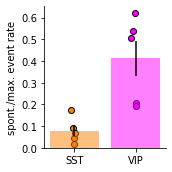

In [28]:
reload(scf)
ca_obj2 = scf.ca_imaging(rsfile)
self = ca_obj2
self.plot_sst_vip_spont_bars()

<IPython.core.display.Javascript object>


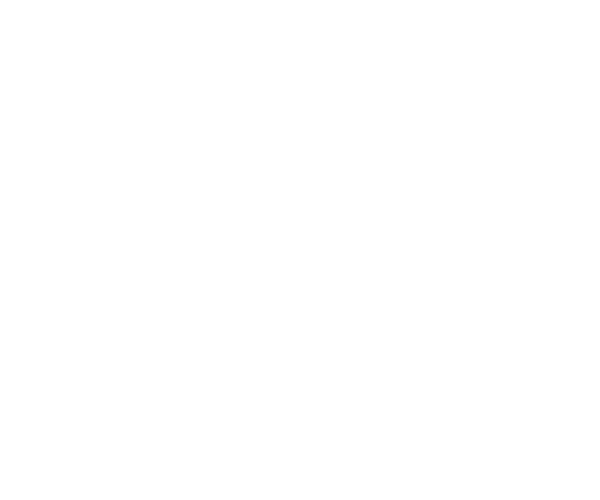

(1, 7, 6)


/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope_avg[slicer] = zdata_slope[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1083: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future 

0.12629176386036448
linewidth: 0
linewidth: 0
linewidth: 0


/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]


ValueError: operands could not be broadcast together with shapes (1,5,6) (1,6,1) 

In [181]:
reload(scf)
scf.interp_size_slope(self)

In [150]:
import naka_rushton_analysis as nra

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope_avg[slicer] = zdata_slope[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1083: Fut

(10, 7, 6)
0.12099998351880198
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted 

(13, 7, 6)
0.16526514625190517
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(10, 7, 6)
0.22838368525225855
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transp

plotting
linewidth: 1
plotting
linewidth: 1
plotting
(13, 7, 6)
0.13695648293335955
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope_avg[slicer] = zdata_slope[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1083: Fut

linewidth: 1
plotting
linewidth: 1
plotting
(7, 7, 6)
0.2569108699530259
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Us

linewidth: 1
plotting
linewidth: 1
plotting
(10, 7, 6)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.16179239998687975
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted 

(13, 7, 6)
0.20747929751279837
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_

(10, 7, 6)
0.18227191603539322
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(13, 7, 6)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transp

0.09495337558288901
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(7, 7, 6)
0.38234060131014214
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a d

plotting
(10, 7, 6)
0.06972436716483359
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted 

(13, 7, 6)
0.08488766063584309
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(10, 7, 6)
0.15325049299138382
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transp

plotting
linewidth: 1
plotting
linewidth: 1
plotting
(13, 7, 6)
0.06596750600585903
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:10

linewidth: 1
plotting
(7, 7, 6)
0.13805331005016686
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted 

(10, 7, 6)
0.09162012308949592
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(13, 7, 6)
0.12552268502808447
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transp

plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope_avg[slicer] = zdata_slope[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1083: Fut

(10, 7, 6)
0.11913483876457252
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(13, 7, 6)
0.08625798707468353
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Us

linewidth: 1
plotting
linewidth: 1
plotting
(7, 7, 6)
0.20363908144951173
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


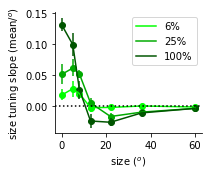

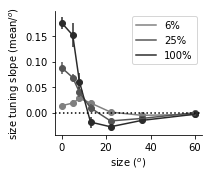

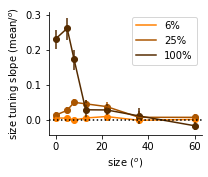

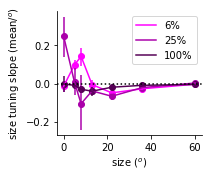

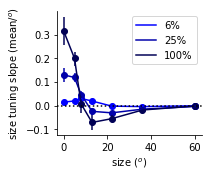

...

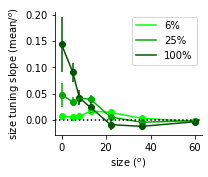

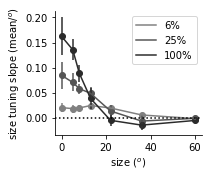

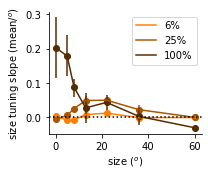

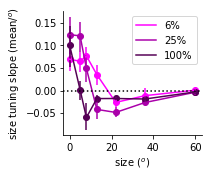

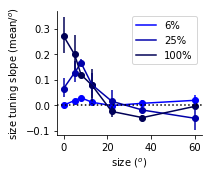

In [29]:
# c_l4 = np.array(((0, 0.3, 0), (0, 0.6, 0), (0, 1, 0)))
# c_l23 = np.array(((0.5, 0.5, 0.5), (0.25, 0.25, 0.25), (0., 0., 0.)))
# c_sst = np.array(((0.3, 0.2, 0), (0.6, 0.4, 0), (1, 0.65, 0)))
# c_vip = np.array(((0.3, 0, 0.3), (0.6, 0, 0.6), (1, 0, 1)))
# c_pv = np.array(((0, 0, 0.3), (0, 0, 0.6), (0, 0, 1)))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
# usize = np.array((5, 8, 13, 22, 36, 60))
# ucontrast = np.array((0, 6, 12, 25, 50, 100))
# reload(ut)
# reload(nra)
colors = self.celltype_colors_for_2d
nlines = 3
colors2d = scf.gen_2d_colors(nlines, celltype_colors=colors)
for ialign in range(2):
    for irun in range(2):
        lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
        for itype in [0, 1, 2, 3, 4]:#range(len(rsexpt)):
            plt.figure(figsize=(3, 2.5))
            usize0 = np.concatenate(((0, ), self.usize))
            starting_data = np.nanmean(self.rsexpt[irun][itype][ialign], -1)
            starting_data = starting_data/np.nanmean(np.nanmean(starting_data, -1), -1)[:, np.newaxis, np.newaxis]
            starting_data = sim_utils.gen_size_tuning(starting_data)
#             nra.plot_interp_size_tuning(ams=ams_all[ialign][irun][itype], usize=usize, these_contrasts=these_contrasts, colors=colors2d[itype], deriv=True)
            data = sca.compute_slope_avg(usize0, starting_data, axis=1)
            ut.plot_bootstrapped_errorbars_hillel(usize0, data[:, :, [1, 3, 5]].transpose((0, 2, 1)), pct=(16, 84), colors=colors2d[itype])
            plt.gca().axhline(0, linestyle='dotted', c='k')
            plt.legend(['6%', '25%', '100%'])
            plt.xlabel('size ($^o$)')
            plt.ylabel('size tuning slope (mean/$^o$)')
            ut.erase_top_right()
            plt.tight_layout()
            plt.savefig('figures/%s_size_slope_by_3_contrasts_%s_%s.eps'%(self.celltype_lbls[itype], self.running_lbls[irun], self.alignment_lbls[ialign]))

In [ ]:
pdb.pm()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.021374042292679557
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.03696798365172845
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.042081853708427944
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.027446763705360908
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.04962697440619499
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.045774839831763545
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.06295861822260403
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.07937678891519787
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.06607036052316374
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.06933604990717049
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.015077459673571552
linewidth: 1


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.04019962623943073
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead

linewidth: 1
plotting
0.0359074227349174
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.013956983908842008
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.027074738468205767
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.04535302535500697
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.07158824888317436
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.050716021765317684
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.0750635327487317
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.05271862254208851
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


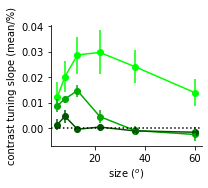

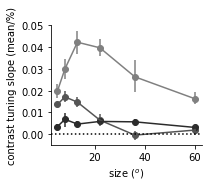

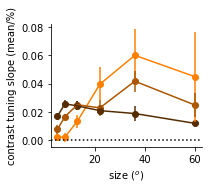

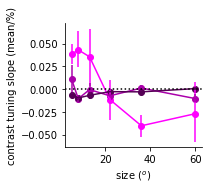

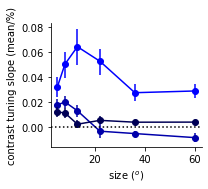

...

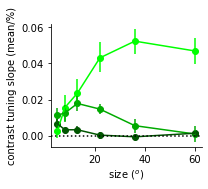

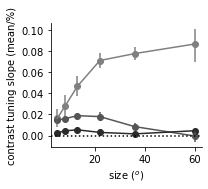

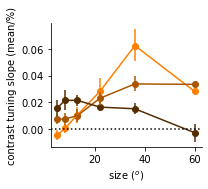

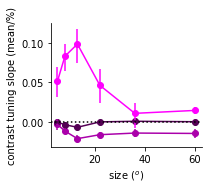

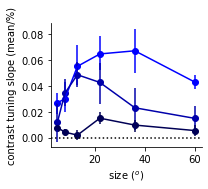

In [32]:
ucontrast = np.array((0, 6, 12, 25, 50, 100))
reload(ut)
# reload(nra)
colors = self.celltype_colors_for_2d
nlines = 3
colors2d = scf.gen_2d_colors(nlines, celltype_colors=colors)
# ams_all = self.ams_all
for ialign in range(2):
    for irun in range(2):
        lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
        for itype in [0, 1, 2, 3, 4]:#range(len(rsexpt)):
            plt.figure(figsize=(3, 2.5))
            starting_data = np.nanmean(self.rsexpt[irun][itype][ialign], -1)
            starting_data = starting_data/np.nanmean(np.nanmean(starting_data, -1), -1)[:, np.newaxis, np.newaxis]
            data = scf.compute_slope_avg(self.ucontrast, starting_data, axis=2)
#             colors2d = scf.gen_2d_colors(nlines, celltype_colors=[colors[itype]])[0]
        #     for icontrast in range(6):
            #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
#             nra.plot_interp_size_tuning(ams=ams_all[ialign][irun][itype], usize=usize, these_contrasts=these_contrasts, colors=colors[itype], deriv=True, deriv_axis=2)
            ut.plot_bootstrapped_errorbars_hillel([5, 8, 13, 22, 36, 60], data[:, :, [1, 3, 5]].transpose((0, 2, 1)), pct=(16, 84), colors=colors2d[itype])
            plt.gca().axhline(0, linestyle='dotted', c='k')
#             plt.legend(['6%', '25%', '100%'])
            plt.xlabel('size ($^o$)')
            plt.ylabel('contrast tuning slope (mean/%)')
            ut.erase_top_right()
            plt.tight_layout()
            plt.savefig('figures/%s_contrast_slope_by_3_contrasts_%s_%s.eps'%(self.celltype_lbls[itype], self.running_lbls[irun], self.alignment_lbls[ialign]))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.022729947658167087
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, whic

0.049014938840865996
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.030972410360383687
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Us

linewidth: 1
plotting
linewidth: 1
plotting
0.03516715756898094
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a dif

plotting
0.04521746631293255
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, whic

0.05204694022187814
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.06295861822260403
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.07937678891519787
linewidth: 1


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.0795616636773202
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.06933604990717049
linewidth: 1


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.014647265098159161
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.05517680786291638
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, whic

0.039608286240892916
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

0.008658855330150372
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, whi

0.027074738468205767
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.03988532066979951
linewidth: 1


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:942: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  for axind in [0,-1]:
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:947: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer2 = slicer.copy()
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:954: FutureWarning: Using a non-tuple sequence for multidimensional indexing 

plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.08887193049595904
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Us

linewidth: 1
plotting
linewidth: 1
plotting
0.04490511390896464
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Us

linewidth: 1
plotting
0.08477162245881009
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transp

plotting
linewidth: 1
plotting
linewidth: 1
plotting
0.07070469311961677
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


linewidth: 1
plotting


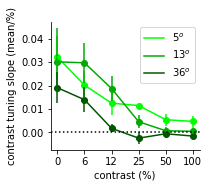

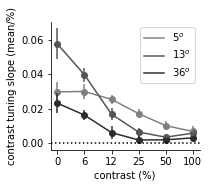

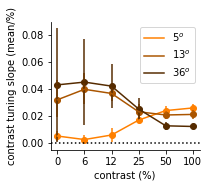

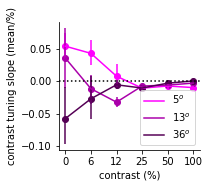

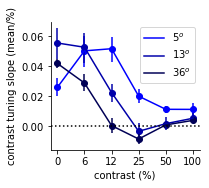

...

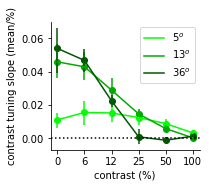

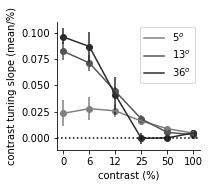

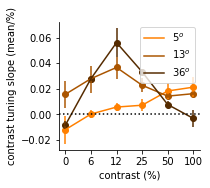

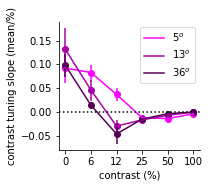

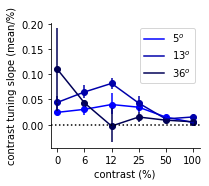

In [34]:
ucontrast = np.array((0, 6, 12, 25, 50, 100))
these_sizes = [0, 2, 4]
reload(ut)
# reload(nra)
colors = self.celltype_colors_for_2d
nlines = len(these_sizes)
colors2d = scf.gen_2d_colors(nlines, celltype_colors=colors)
for ialign in range(2):
    for irun in range(2):
        lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
        for itype in [0, 1, 2, 3, 4]:#range(len(rsexpt)):
            plt.figure(figsize=(3, 2.5))
            starting_data = np.nanmean(self.rsexpt[irun][itype][ialign], -1)
            starting_data = starting_data/np.nanmean(np.nanmean(starting_data, -1), -1)[:, np.newaxis, np.newaxis]
            data = scf.compute_slope_avg(self.ucontrast, starting_data, axis=2)
#         #     for icontrast in range(6):
#             #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
# #             ut.plot_bootstrapped_errorbars_hillel([5, 8, 13, 22, 36, 60], data[:, :, [1, 3, 5]].transpose((0, 2, 1)), pct=(16, 84), colors=colors[itype])
            ut.plot_bootstrapped_errorbars_hillel(np.arange(6), data[:, [1, 3, 5], :], pct=(16, 84), colors=colors2d[itype])
#             nra.plot_interp_contrast_tuning(ams=ams_all[ialign][irun][itype], usize=usize, these_sizes=these_sizes, colors=colors[itype], deriv=True, deriv_axis=2)
            plt.xticks(np.arange(6), ucontrast)
            plt.gca().axhline(0, linestyle='dotted', c='k')
            plt.legend(['5$^o$', '13$^o$', '36$^o$'])
            plt.xlabel('contrast (%)')
            plt.ylabel('contrast tuning slope (mean/%)')
            ut.erase_top_right()
            plt.tight_layout()
            plt.savefig('figures/%s_contrast_slope_by_3_sizes_%s_%s.eps'%(self.celltype_lbls[itype], self.running_lbls[irun], self.alignment_lbls[ialign]))

In [308]:
ams_all[ialign][irun][itype].ucontrast

array([0.  , 0.06, 0.12, 0.25, 0.5 , 1.  ])

In [610]:
ucontrast

[5, 10, 20, 40, 80]

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

(10, 7, 6)
1.3871364120050824
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(13, 7, 6)
1.6383597582989435
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

(10, 7, 6)
3.0738286245820703
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(13, 7, 6)
1.609921504627585
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a

(7, 7, 6)
1.9189218885330432
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(10, 7, 6)
1.53358906274295
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

(13, 7, 6)
1.9597399310875674
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(10, 7, 6)
3.285911831702177
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

(13, 7, 6)
1.2987700058923979
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(7, 7, 6)
1.94257343161066
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

(10, 7, 6)
1.2051143238782989
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(13, 7, 6)
1.5149630777710283
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

(10, 7, 6)
3.7162984439304876
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

(13, 7, 6)
1.3947480280799704
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(7, 7, 6)
1.6528130893375033
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

(10, 7, 6)
1.550054726319509
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(13, 7, 6)
1.7363765345351536
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(10, 7, 6)
2.8232785853887843
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

linewidth: 1
plotting
(13, 7, 6)
1.4541730091962843
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

(7, 7, 6)
2.2816270321630507
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


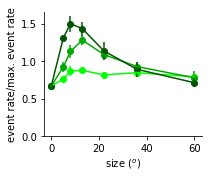

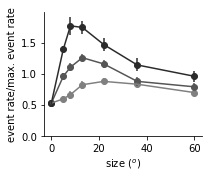

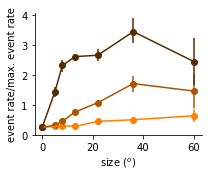

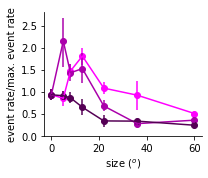

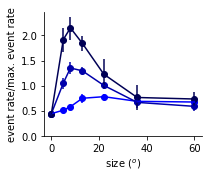

...

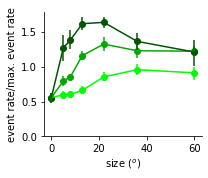

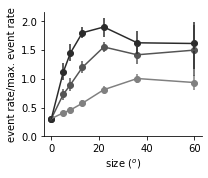

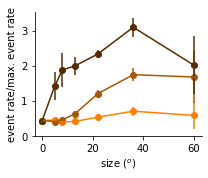

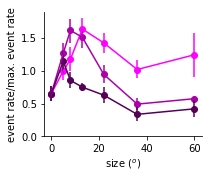

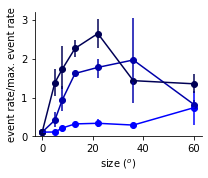

In [35]:
# c_l4 = np.array(((0, 0.3, 0), (0, 0.6, 0), (0, 1, 0)))
# c_l23 = np.array(((0.5, 0.5, 0.5), (0.25, 0.25, 0.25), (0., 0., 0.)))
# c_sst = np.array(((0.3, 0.2, 0), (0.6, 0.4, 0), (1, 0.65, 0)))
# c_vip = np.array(((0.3, 0, 0.3), (0.6, 0, 0.6), (1, 0, 1)))
# c_pv = np.array(((0, 0, 0.3), (0, 0, 0.6), (0, 0, 1)))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
these_contrasts = [1, 3, 5]
colors = self.celltype_colors_for_2d
nlines = len(these_contrasts)
self.colors2d = scf.gen_2d_colors(nlines, celltype_colors=colors)
usize = self.usize
usize0 = np.concatenate(((0, ), usize))
reload(ut)
for ialign in range(2):
    for irun in range(2):
        lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
        for itype in [0, 1, 2, 3, 4]:#range(len(rsexpt)):
            plt.figure(figsize=(3, 2.5))
            data = np.nanmean(self.rsexpt[irun][itype][ialign], -1)
            data = sim_utils.gen_size_tuning(data)
            #data = data/np.nanmax(data, axis=1)[:, np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
            ut.plot_bootstrapped_errorbars_hillel(usize0, data[:, :, these_contrasts].transpose((0, 2, 1)), pct=(16, 84), colors=self.colors2d[itype])
#             plt.legend(['6%', '25%', '100%'])
            plt.xlabel('size ($^o$)')
            plt.ylabel('event rate/max. event rate')
            ut.erase_top_right()
#             plt.ylim(0.2, 1.05)
            plt.gca().set_ylim(bottom=0)
            plt.tight_layout()
            plt.savefig('figures/%s_size_by_3_contrasts_%s_%s.eps'%(self.celltype_lbls[itype], self.running_lbls[irun], self.alignment_lbls[ialign]))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


<IPython.core.display.Javascript object>


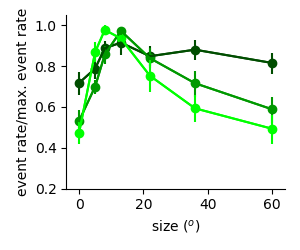

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(10, 7, 6)
0.953848410786367


<IPython.core.display.Javascript object>


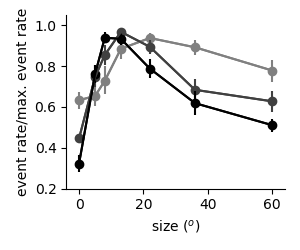

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(13, 7, 6)
0.9516556168234196


<IPython.core.display.Javascript object>


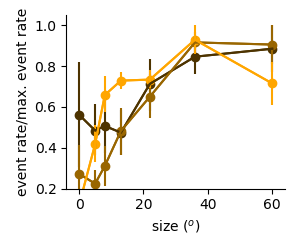

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(10, 7, 6)
0.865831663245849


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


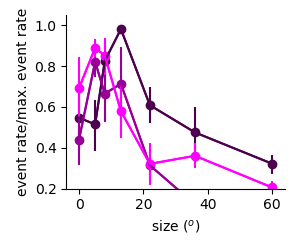

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(13, 7, 6)
0.9624956896948569


<IPython.core.display.Javascript object>


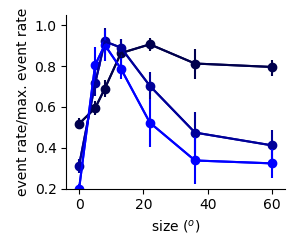

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(7, 7, 6)
0.8749793581945446


<IPython.core.display.Javascript object>


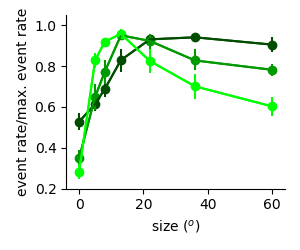

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(10, 7, 6)
0.9326738766691006


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


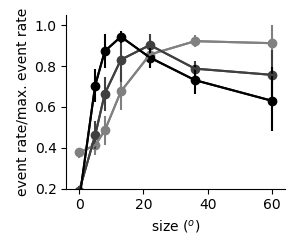

(13, 7, 6)
0.9147376906938471


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


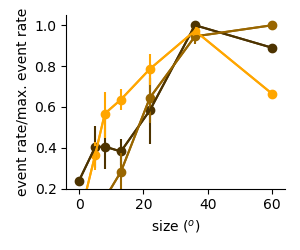

(10, 7, 6)
1.0


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


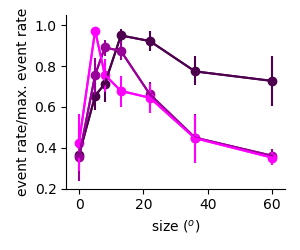

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(13, 7, 6)
0.9563702504135612


<IPython.core.display.Javascript object>


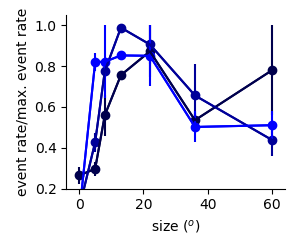

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(7, 7, 6)
0.9761964371657396


<IPython.core.display.Javascript object>


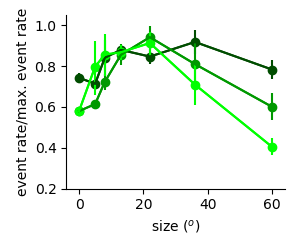

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(10, 7, 6)
0.88844605035566


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


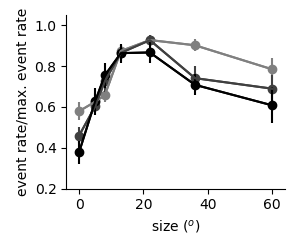

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(13, 7, 6)
0.9006536535093354


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


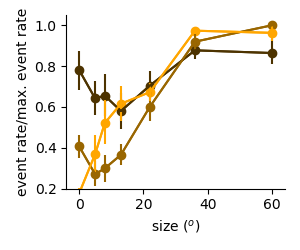

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(10, 7, 6)
1.0


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


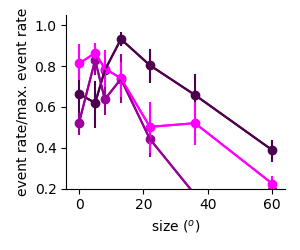

(13, 7, 6)
0.897862414740701


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


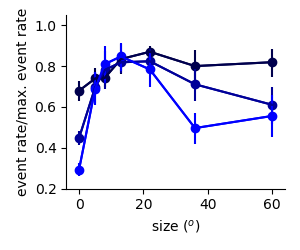

(7, 7, 6)
0.8420039759027369


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


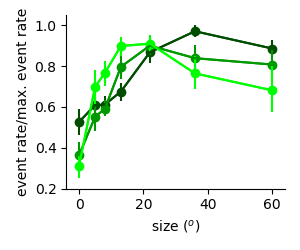

(10, 7, 6)
0.9408663577521075


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


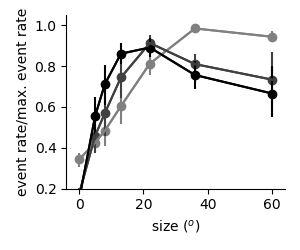

(13, 7, 6)
0.973345503847158


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


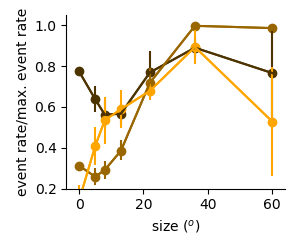

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(10, 7, 6)
0.9941718104869259


<IPython.core.display.Javascript object>


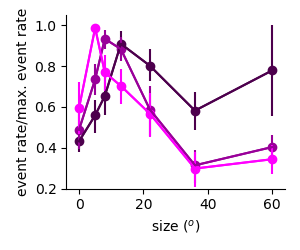

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(13, 7, 6)
0.9737153945526442


<IPython.core.display.Javascript object>


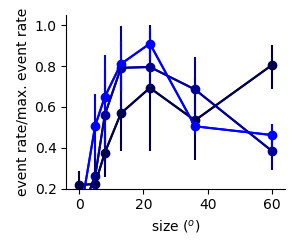

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


(7, 7, 6)
0.8329096331565449


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


In [207]:
c_l4 = np.array(((0, 0.3, 0), (0, 0.6, 0), (0, 1, 0)))
c_l23 = np.array(((0.5, 0.5, 0.5), (0.25, 0.25, 0.25), (0., 0., 0.)))
c_sst = np.array(((0.3, 0.2, 0), (0.6, 0.4, 0), (1, 0.65, 0)))
c_vip = np.array(((0.3, 0, 0.3), (0.6, 0, 0.6), (1, 0, 1)))
c_pv = np.array(((0, 0, 0.3), (0, 0, 0.6), (0, 0, 1)))
colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
reload(ut)
for ialign in range(2):
    for irun in range(2):
        lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
        for itype in [0, 1, 2, 3, 4]:#range(len(rsexpt)):
            plt.figure(figsize=(3, 2.5))
            data = np.nanmean(rsexpt[irun][itype][ialign], -1)
            data = sim_utils.gen_size_tuning(data)
            data = data/np.nanmax(data, axis=1)[:, np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
            ut.plot_bootstrapped_errorbars_hillel([0, 5, 8, 13, 22, 36, 60], data[:, :, these_contrasts].transpose((0, 2, 1)), pct=(16, 84), colors=colors[itype])
#             plt.legend(['6%', '25%', '100%'])
            plt.xlabel('size ($^o$)')
            plt.ylabel('event rate/max. event rate')
            ut.erase_top_right()
            plt.ylim(0.2, 1.05)
            plt.tight_layout()
#             plt.savefig('figures/%s_size_by_3_contrasts_%s_%s_norm_to_max.eps'%(lbls[itype], running_lbls[irun], alignment_lbls[ialign]))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning

1.3719448841485047
1.2339053386655878
1.6844219196465129
1.4047654627659705
2.412785594303932
1.0020181388728238


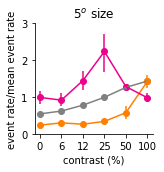

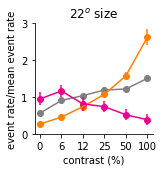

In [198]:
save_fig = True

reload(ut)
ialign = 0
irun = 0
idir = 0

# ylim = (0,2.5)
ylim = (0,3)

if True:#for iconn,ylim in zip([0,2,3,4],[ylim for _ in range(4)]):

    # nr = network_resps[0][iconn][:,15].reshape((-1,6,6,8))
    # nr_baseline = network_resps[0][0][:,15].reshape((-1,6,6,8))

    # data = sim_utils.gen_size_tuning(data)
    # data = data/np.nanmax(data, axis=1)[:, np.newaxis]

    lbls = ['pc_l4','pc_l23','sst','vip','pv']
    c_l4 = np.array((0,0.5,0))
    c_l23 = [np.array((0.5, 0.5, 0.5)) for i in range(2)]#[np.array((0.33,0.33,0.33)),np.array((0.5,0.5,0.5))][::-1]
    c_sst = [np.array((1, 0.5, 0)) for i in range(2)]#[np.array((0.75,0.45,0)),np.array((1,0.65,0))][::-1]
    c_vip = [np.array((236, 0, 140))/255 for i in range(2)]#[np.array((0.75,0,0.75)),np.array((1,0,1))][::-1]
    c_pv = np.array((0,0,1))
    colors = [c_l4,c_l23,c_sst,c_vip,c_pv]
    usize = [5,8,13,22,36,60]
    ucontrast = [0,6,12,25,50,100]

    for iisize,isize in enumerate([0,3]): #[0,4]):
        plt.figure(figsize=(2.5,2.5))
        these_types = [1,2,3]
        for itype in these_types:#range(len(rsexpt)):
            data = np.nanmean(rsexpt[irun][itype][ialign], -1)
            data = ut.norm_to_mean(data)
#             data = data/np.nanmean(np.nanmean(data,1),1)[:,np.newaxis,np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5,8,13,22,36,60],np.nanmean(data,0)[:,icontrast],compute_sem(data,0)[:,icontrast])
#             ut.plot_pct_errorbars_hillel(ucontrast,data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
            ut.plot_bootstrapped_errorbars_hillel(np.arange(6),data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
            plt.xticks(np.arange(6),ucontrast)
    #         plt.legend(['6%','25%','100%'])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate/mean event rate')
#         plt.legend(['PC','SST','VIP'],frameon=False)
        plt.title('%d$^o$ size'%usize[isize])
        plt.ylim(ylim)
        ut.erase_top_right()
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/meas_pc_sst_vip_contrast_by_size_%d.eps'%(isize))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/Users/dan/Documents/code/adesnal/pyute.py:143: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/Users/dan/Documents/code/adesnal/pyute.py:143: RuntimeWarning: Mean of empty slice
  stat 

(13, 7, 6)
0.920405229829757
(10, 7, 6)
0.5326679209914666
(13, 7, 6)
1.7025095508579984
(13, 7, 6)
1.0732339576426297
(10, 7, 6)
0.912211181063665
(13, 7, 6)
1.6553551298003644


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/Users/dan/Documents/code/adesnal/pyute.py:143: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/Users/dan/Documents/code/adesnal/pyute.py:143: RuntimeWarning: Mean of empty slice
  stat 

(13, 7, 6)
1.3303549356484883
(10, 7, 6)
1.5812168294522688
(13, 7, 6)
1.683899294016559
(13, 7, 6)
1.8115688069046878
(10, 7, 6)
3.3609679197435454
(13, 7, 6)
0.8813181659634617


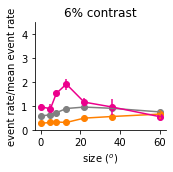

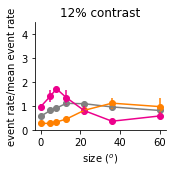

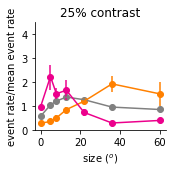

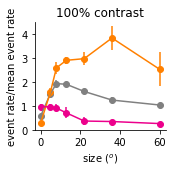

In [230]:
save_fig = False

reload(ut)
ialign = 0
irun = 0
idir = 0

# ylim = (0,2.5)
ylim = (0,4.5)

if True:#for iconn,ylim in zip([0,2,3,4],[ylim for _ in range(4)]):

    # nr = network_resps[0][iconn][:,15].reshape((-1,6,6,8))
    # nr_baseline = network_resps[0][0][:,15].reshape((-1,6,6,8))

    # data = sim_utils.gen_size_tuning(data)
    # data = data/np.nanmax(data, axis=1)[:, np.newaxis]

    icontrasts = [1, 2, 3, 5]
    nfig = len(icontrasts)

    lbls = ['pc_l4','pc_l23','sst','vip','pv']
    c_l4 = np.array((0,0.5,0))
    c_l23 = [np.array((0.5, 0.5, 0.5)) for i in range(nfig)]#[np.array((0.33,0.33,0.33)),np.array((0.5,0.5,0.5))][::-1]
    c_sst = [np.array((1, 0.5, 0)) for i in range(nfig)]#[np.array((0.75,0.45,0)),np.array((1,0.65,0))][::-1]
    c_vip = [np.array((236, 0, 140))/255 for i in range(nfig)]#[np.array((0.75,0,0.75)),np.array((1,0,1))][::-1]
    c_pv = np.array((0,0,1))
    colors = [c_l4,c_l23,c_sst,c_vip,c_pv]
    usize = [5,8,13,22,36,60]
    usize0 = [0] + usize
    ucontrast = [0,6,12,25,50,100]

    for iicontrast, icontrast in enumerate(icontrasts): #[0,4]):
        plt.figure(figsize=(2.5,2.5))
        these_types = [1,2,3]
        for itype in these_types:#range(len(rsexpt)):
            data = np.nanmean(rsexpt[irun][itype][ialign], -1)
            data = sim_utils.gen_size_tuning(data)
            data = ut.norm_to_mean(data)
#             data = data/np.nanmean(np.nanmean(data,1),1)[:,np.newaxis,np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5,8,13,22,36,60],np.nanmean(data,0)[:,icontrast],compute_sem(data,0)[:,icontrast])
#             ut.plot_pct_errorbars_hillel(ucontrast,data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
            ut.plot_bootstrapped_errorbars_hillel(usize0,data[:,:,icontrast:icontrast+1].transpose((0, 2, 1)),
                pct=(16,84),colors=colors[itype][iicontrast][np.newaxis])
            # plt.xticks(np.arange(6),ucontrast)
    #         plt.legend(['6%','25%','100%'])
            plt.xlabel('size ($^o$)')
            plt.ylabel('event rate/mean event rate')
#         plt.legend(['PC','SST','VIP'],frameon=False)
        plt.title('%d%% contrast'%ucontrast[icontrast])
        plt.ylim(ylim)
        ut.erase_top_right()
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/meas_pc_sst_vip_contrast_%d_by_size.eps'%(icontrast))

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:651: RuntimeWarning: Mean of empty slice
  rsexpt[iexpt] = np.nanmean(rso[expt_ids==iexpt],0)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:774: RuntimeWarning: Mean of empty slice
  to_return = np.nanmean(data,-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: invalid value encountered in true_divide
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:779: RuntimeWarning: All-NaN slice encountered
  to_return = to_return - np.nanmin(np.nanmin(to_return,1),1)[:,np.newaxis,np.newaxis]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: All-NaN slice encountered
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/opt/anaconda3/envs/py3/lib/python3.6

1.3719448841485047
1.2339053386655878
1.6844219196465129
0.47887012734551204
1.4047654627659705


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:773: RuntimeWarning: Mean of empty slice
  mn = np.nanmean(arr_mn_flat,axis=1)
/Users/dan/Documents/code/adesnal/pyute.py:143: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)


2.412785594303932
1.0020181388728238
0.47887012734551204


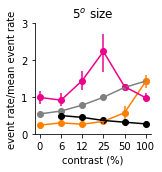

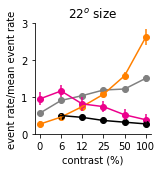

In [244]:
save_fig = False

self = scf.ca_imaging(rsfile)
self.compute_smis(exptwise=exptwise, xaxis=self.ucontrast, norm_to_max=norm_to_max)

reload(ut)
ialign = 0
irun = 0
idir = 0

# ylim = (0,2.5)
ylim = (0,3)

if True:#for iconn,ylim in zip([0,2,3,4],[ylim for _ in range(4)]):

    # nr = network_resps[0][iconn][:,15].reshape((-1,6,6,8))
    # nr_baseline = network_resps[0][0][:,15].reshape((-1,6,6,8))

    # data = sim_utils.gen_size_tuning(data)
    # data = data/np.nanmax(data, axis=1)[:, np.newaxis]

    lbls = ['pc_l4','pc_l23','sst','vip','pv']
    c_l4 = np.array((0,0.5,0))
    c_l23 = [np.array((0.5, 0.5, 0.5)) for i in range(2)]#[np.array((0.33,0.33,0.33)),np.array((0.5,0.5,0.5))][::-1]
    c_sst = [np.array((1, 0.5, 0)) for i in range(2)]#[np.array((0.75,0.45,0)),np.array((1,0.65,0))][::-1]
    c_vip = [np.array((236, 0, 140))/255 for i in range(2)]#[np.array((0.75,0,0.75)),np.array((1,0,1))][::-1]
    c_pv = np.array((0,0,1))
    colors = [c_l4,c_l23,c_sst,c_vip,c_pv]
    usize = [5,8,13,22,36,60]
    ucontrast = [0,6,12,25,50,100]

    for iisize,isize in enumerate([0,3]): #[0,4]):
        plt.figure(figsize=(2.5,2.5))
        these_types = [1,2,3]
        for itype in these_types:#range(len(rsexpt)):
            data = np.nanmean(rsexpt[irun][itype][ialign], -1)
            data = ut.norm_to_mean(data)
#             data = data/np.nanmean(np.nanmean(data,1),1)[:,np.newaxis,np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5,8,13,22,36,60],np.nanmean(data,0)[:,icontrast],compute_sem(data,0)[:,icontrast])
#             ut.plot_pct_errorbars_hillel(ucontrast,data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
            ut.plot_bootstrapped_errorbars_hillel(np.arange(6),data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
        
        # plot SMI as a function of contrast
        pctype = 0
        self.plot_smi_vs_contrast_semilogx(self.smis[irun][pctype][ialign], np.zeros((3,)), alpha=0.0,new_fig=False)

        plt.xticks(np.arange(6),ucontrast)
        plt.xlabel('contrast (%)')
        plt.ylabel('event rate/mean event rate')

#         plt.legend(['PC','SST','VIP'],frameon=False)
        plt.title('%d$^o$ size'%usize[isize])
        plt.ylim(ylim)
        ut.erase_top_right()
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/meas_pc_sst_vip_contrast_by_size_%d.eps'%(isize))

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:651: RuntimeWarning: Mean of empty slice
  rsexpt[iexpt] = np.nanmean(rso[expt_ids==iexpt],0)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:774: RuntimeWarning: Mean of empty slice
  to_return = np.nanmean(data,-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: invalid value encountered in true_divide
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:779: RuntimeWarning: All-NaN slice encountered
  to_return = to_return - np.nanmin(np.nanmin(to_return,1),1)[:,np.newaxis,np.newaxis]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: All-NaN slice encountered
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/opt/anaconda3/envs/py3/lib/python3.6

1.3719448841485047
1.2339053386655878
1.6844219196465129
0.47887012734551204
1.4047654627659705
2.412785594303932
1.0020181388728238
0.47887012734551204


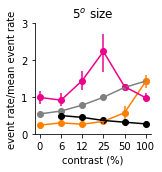

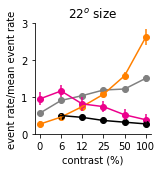

In [252]:
save_fig = False

self = scf.ca_imaging(rsfile)
self.compute_smis(exptwise=exptwise, xaxis=self.ucontrast, norm_to_max=norm_to_max)

reload(ut)
ialign = 0
irun = 0
idir = 0

# ylim = (0,2.5)
ylim = (0,3)

if True:#for iconn,ylim in zip([0,2,3,4],[ylim for _ in range(4)]):

    # nr = network_resps[0][iconn][:,15].reshape((-1,6,6,8))
    # nr_baseline = network_resps[0][0][:,15].reshape((-1,6,6,8))

    # data = sim_utils.gen_size_tuning(data)
    # data = data/np.nanmax(data, axis=1)[:, np.newaxis]

    lbls = ['pc_l4','pc_l23','sst','vip','pv']
    c_l4 = np.array((0,0.5,0))
    c_l23 = [np.array((0.5, 0.5, 0.5)) for i in range(2)]#[np.array((0.33,0.33,0.33)),np.array((0.5,0.5,0.5))][::-1]
    c_sst = [np.array((1, 0.5, 0)) for i in range(2)]#[np.array((0.75,0.45,0)),np.array((1,0.65,0))][::-1]
    c_vip = [np.array((236, 0, 140))/255 for i in range(2)]#[np.array((0.75,0,0.75)),np.array((1,0,1))][::-1]
    c_pv = np.array((0,0,1))
    colors = [c_l4,c_l23,c_sst,c_vip,c_pv]
    usize = [5,8,13,22,36,60]
    ucontrast = [0,6,12,25,50,100]

    for iisize,isize in enumerate([0,3]): #[0,4]):
        plt.figure(figsize=(2.5,2.5))
        these_types = [1,2,3]
        for itype in these_types:#range(len(rsexpt)):
            data = np.nanmean(rsexpt[irun][itype][ialign], -1)
            data = ut.norm_to_mean(data)
#             data = data/np.nanmean(np.nanmean(data,1),1)[:,np.newaxis,np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5,8,13,22,36,60],np.nanmean(data,0)[:,icontrast],compute_sem(data,0)[:,icontrast])
#             ut.plot_pct_errorbars_hillel(ucontrast,data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
            ut.plot_bootstrapped_errorbars_hillel(np.arange(6),data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
        
        # plot SMI as a function of contrast
        pctype = 0
        self.plot_smi_vs_contrast_semilogx(self.smis[irun][pctype][ialign], np.zeros((3,)), alpha=0.0,new_fig=False)

        plt.xticks(np.arange(6),ucontrast)
        plt.xlabel('contrast (%)')
        plt.ylabel('event rate/mean event rate')

#         plt.legend(['PC','SST','VIP'],frameon=False)
        plt.title('%d$^o$ size'%usize[isize])
        plt.ylim(ylim)
        ut.erase_top_right()
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/meas_pc_sst_vip_contrast_by_size_%d.eps'%(isize))

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:651: RuntimeWarning: Mean of empty slice
  rsexpt[iexpt] = np.nanmean(rso[expt_ids==iexpt],0)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:774: RuntimeWarning: Mean of empty slice
  to_return = np.nanmean(data,-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:790: RuntimeWarning: All-NaN slice encountered
  return this_data[:,:,1]/np.nanmax(this_data,2)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:790: RuntimeWarning: invalid value encountered in true_divide
  return this_data[:,:,1]/np.nanmax(this_data,2)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:779: RuntimeWarning: All-NaN slice encountered
  to_return = to_return - np.nanmin(np.nanmin(to_return,1),1)[:,np.newaxis,np.newaxis]
/opt/anaconda3/envs/py3/lib/python3.6/site-packag

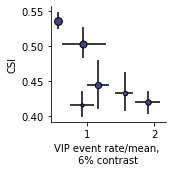

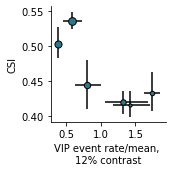

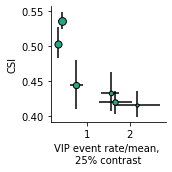

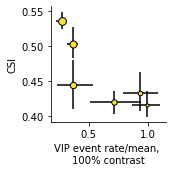

In [25]:
# in this version, scatter plotting VIP activity vs. SMI

save_fig = False

self = scf.ca_imaging(rsfile)
self.compute_csis(exptwise=exptwise, xaxis=self.ucontrast, norm_to_max=norm_to_max)

reload(ut)
ialign = 0
irun = 0
idir = 0

# ylim = (0,2.5)
ylim = (0,4.5)

if True:#for iconn,ylim in zip([0,2,3,4],[ylim for _ in range(4)]):

    # nr = network_resps[0][iconn][:,15].reshape((-1,6,6,8))
    # nr_baseline = network_resps[0][0][:,15].reshape((-1,6,6,8))

    # data = sim_utils.gen_size_tuning(data)
    # data = data/np.nanmax(data, axis=1)[:, np.newaxis]

    icontrasts = [1, 2, 3, 5]
    nfig = len(icontrasts)

    lbls = ['pc_l4','pc_l23','sst','vip','pv']
    c_l4 = np.array((0,0.5,0))
    c_l23 = [np.array((0.5, 0.5, 0.5)) for i in range(nfig)]#[np.array((0.33,0.33,0.33)),np.array((0.5,0.5,0.5))][::-1]
    c_sst = [np.array((1, 0.5, 0)) for i in range(nfig)]#[np.array((0.75,0.45,0)),np.array((1,0.65,0))][::-1]
    c_vip = [np.array((236, 0, 140))/255 for i in range(nfig)]#[np.array((0.75,0,0.75)),np.array((1,0,1))][::-1]
    c_pv = np.array((0,0,1))
    colors = [c_l4,c_l23,c_sst,c_vip,c_pv]
    usize = [5,8,13,22,36,60]
    usize0 = [0] + usize
    ucontrast = [0,6,12,25,50,100]
    ncontrast = len(ucontrast)

    for iicontrast, icontrast in enumerate(icontrasts): #[0,4]):
        plt.figure(figsize=(2.5,2.5))

        viptype = 3
        xdata = np.nanmean(rsexpt[irun][viptype][ialign], -1)
        xdata = ut.norm_to_mean(xdata)

        # plot SMI as a function of contrast
        pctype = 0
        ydata = self.csis[irun][pctype][ialign]

        this_colormap = lambda x: plt.cm.viridis(np.linspace(0, 1, ncontrast))[icontrast]

        sca.scatter_size_contrast_errorbar_rg(xdata[:, :, icontrast:icontrast+1], ydata[:, :, None], equality_line=False, 
            square=False, equate_0=False, use_bootstrap=True, icontrast=icontrast, ncontrast=6)

        # sca.scatter_size_contrast_errorbar(xdata[:, :, icontrast:icontrast+1], ydata[:, :, None], equality_line=False, 
        #     square=False, equate_0=False, use_bootstrap=True, colormap=this_colormap)

        plt.xlabel('VIP event rate/mean, \n%d%% contrast'%ucontrast[icontrast])
        plt.ylabel('CSI')

#         plt.legend(['PC','SST','VIP'],frameon=False)
        # plt.title('CSI vs. intermediate\ncontrast VIP activity')
        # plt.ylim(ylim)
        ut.erase_top_right()
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/meas_vip_vs_csi_contrast_%d_by_size.eps'%(icontrast))

/Users/dan/Documents/code/adesnal/opto_utils.py:316: RuntimeWarning: Mean of empty slice
  rs_ori = np.nanmean(rs_ori,idim) #np.nanmean(rs_ori,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:651: RuntimeWarning: Mean of empty slice
  rsexpt[iexpt] = np.nanmean(rso[expt_ids==iexpt],0)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:774: RuntimeWarning: Mean of empty slice
  to_return = np.nanmean(data,-1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: invalid value encountered in true_divide
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:779: RuntimeWarning: All-NaN slice encountered
  to_return = to_return - np.nanmin(np.nanmin(to_return,1),1)[:,np.newaxis,np.newaxis]
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:784: RuntimeWarning: All-NaN slice encountered
  return this_data[:,big_ind,:]/np.nanmax(this_data,1)
/opt/anaconda3/envs/py3/lib/python3.6

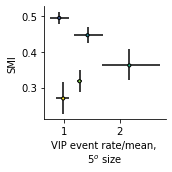

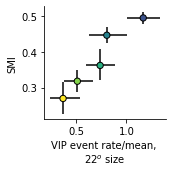

In [27]:
# in this version, scatter plotting VIP activity vs. SMI

save_fig = True

self = scf.ca_imaging(rsfile)
self.compute_smis(exptwise=exptwise, xaxis=self.ucontrast, norm_to_max=norm_to_max)
rsexpt = self.rsexpt

reload(ut)
ialign = 0
irun = 0
idir = 0

# ylim = (0,2.5)
ylim = (0,4.5)

default_dot_scale = 10

if True:#for iconn,ylim in zip([0,2,3,4],[ylim for _ in range(4)]):

    # nr = network_resps[0][iconn][:,15].reshape((-1,6,6,8))
    # nr_baseline = network_resps[0][0][:,15].reshape((-1,6,6,8))

    # data = sim_utils.gen_size_tuning(data)
    # data = data/np.nanmax(data, axis=1)[:, np.newaxis]

    isizes = [0, 3]
    nfig = len(isizes)

    lbls = ['pc_l4','pc_l23','sst','vip','pv']
    c_l4 = np.array((0,0.5,0))
    c_l23 = [np.array((0.5, 0.5, 0.5)) for i in range(nfig)]#[np.array((0.33,0.33,0.33)),np.array((0.5,0.5,0.5))][::-1]
    c_sst = [np.array((1, 0.5, 0)) for i in range(nfig)]#[np.array((0.75,0.45,0)),np.array((1,0.65,0))][::-1]
    c_vip = [np.array((236, 0, 140))/255 for i in range(nfig)]#[np.array((0.75,0,0.75)),np.array((1,0,1))][::-1]
    c_pv = np.array((0,0,1))
    colors = [c_l4,c_l23,c_sst,c_vip,c_pv]
    usize = [5,8,13,22,36,60]
    usize0 = [0] + usize
    ucontrast = [0,6,12,25,50,100]
    ncontrast = len(ucontrast)

    for iisize, isize in enumerate(isizes): #[0,4]):
        plt.figure(figsize=(2.5,2.5))

        viptype = 3
        xdata = np.nanmean(rsexpt[irun][viptype][ialign], -1)
        xdata = ut.norm_to_mean(xdata)

        # plot SMI as a function of contrast
        pctype = 0
        ydata = self.smis[irun][pctype][ialign]

        dot_scale = (isize + 1) * default_dot_scale

        # new colormap maps range(0, ncontrast-1) to range(1,ncontrast)
        this_xtransform = lambda x: 1 / (ncontrast - 1) + (ncontrast - 2) / (ncontrast - 1) * x
        this_colormap = lambda x: plt.cm.viridis(this_xtransform(x))

        # sca.scatter_size_contrast_errorbar(xdata[:, isize:isize+1, 1:], ydata[:, None, 1:], equality_line=False, 
        #     square=False, equate_0=False, use_bootstrap=True, dot_scale=dot_scale, colormap=this_colormap)

        sca.scatter_size_contrast_errorbar_rg(xdata[:, isize:isize+1, 1:], ydata[:, None, 1:], equality_line=False, 
            square=False, equate_0=False, use_bootstrap=True, isize=isize, contrast_rg=(1, None))#, nsize=6, ncontrast=6)

        plt.xlabel('VIP event rate/mean, \n%d$^o$ size'%usize[isize])
        plt.ylabel('SMI')

#         plt.legend(['PC','SST','VIP'],frameon=False)
        # plt.title('SMI vs. intermediate\nsize VIP activity')
        # plt.ylim(ylim)
        ut.erase_top_right()
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/meas_vip_vs_smi_size_%d_by_contrast.eps'%(isize))

In [18]:
%debug

> /Users/dan/Documents/code/adesnal/size_contrast_analysis.py(824)relative_to_absolute_rg()
    822 
    823 def relative_to_absolute_rg(default_len, rg):
--> 824     rg0 = (rg[0] % default_len) if not rg[0] is None else 0
    825     rg1 = (rg[1] % default_len) if ((not rg[1] is None) and (not rg[1] is default_len)) else default_len
    826     return rg0, rg1

*** SyntaxError: unexpected EOF while parsing
0
> /Users/dan/Documents/code/adesnal/size_contrast_analysis.py(859)scatter_size_contrast_errorbar_rg()
    857         size_rg = kwargs['size_rg']
    858         nsize = kwargs['nsize']
--> 859         rg0, rg1 = relative_to_absolute_rg(nsize, size_rg)
    860         kwargs['dot_size_offset'] = default_dot_scale * rg0
    861         kwargs['nsize'] = truncate_with_rg(nsize, size_rg)

0
dict_keys(['equality_line', 'square', 'equate_0', 'use_bootstrap', 'size_rg', 'contrast_rg', 'nsize', 'ncontrast'])


In [250]:
ydata.shape

(10, 6)

<IPython.core.display.Javascript object>


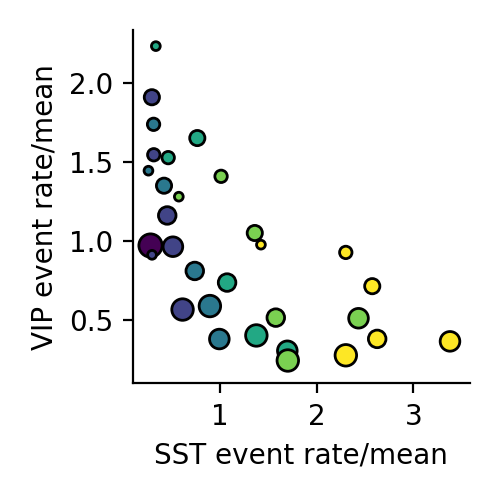

(-0.6214674205288891, 5.227444335972861e-05)


In [109]:
plt.close('all')
reload(sca)
plt.figure(figsize=(2.5, 2.5))
irun, ialign=0, 0
itype1 = 2
itype2 = 3

data = np.nanmean(rsexpt[irun][itype1][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
xdata = np.nanmean(data, 0)
data = np.nanmean(rsexpt[irun][itype2][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
ydata = np.nanmean(data, 0)

# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)
# ydata = np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
sca.scatter_size_contrast(xdata, ydata, equality_line=False, square=False, equate_0=True)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), ydata.flatten())
print((r_value, p_value))
x = np.linspace(xdata.min(), xdata.max(), 10)
y1 = (slope-std_err)*x + intercept
y2 = (slope+std_err)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
plt.xlabel('SST event rate/mean')
plt.ylabel('VIP event rate/mean')
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/sst_vip_scatter.jpg', dpi=300)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


(-0.6214674205288891, 5.227444335972861e-05)


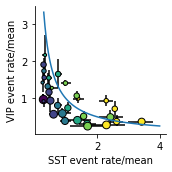

In [ ]:
plt.close('all')
reload(sca)
plt.figure(figsize=(2.5, 2.5))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
cmax = 6

data = np.nanmean(rsexpt[irun][itype1][ialign], -1)
xdata = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
# xdata = np.nanmean(data, 0)
data = np.nanmean(rsexpt[irun][itype2][ialign], -1)
ydata = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
# ydata = np.nanmean(data, 0)

sca.scatter_size_contrast_errorbar(xdata[:, :, :cmax], ydata[:, :, :cmax], equality_line=False, 
    square=False, equate_0=True, use_bootstrap=True)
xtemp = np.linspace(0.3, 4, 100)
plt.plot(xtemp, 1/xtemp)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(np.nanmean(xdata, 0).flatten(), np.nanmean(ydata, 0).flatten())
print((r_value, p_value))
x = np.linspace(np.nanmin(np.nanmean(xdata, 0)), np.nanmax(np.nanmean(xdata, 0)), 10)
y1 = (slope-std_err)*x + intercept
y2 = (slope+std_err)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
plt.xlabel('SST event rate/mean')
plt.ylabel('VIP event rate/mean')
plt.tight_layout()
ut.erase_top_right()
# plt.savefig('figures/sst_vip_scatter_errorbars.jpg', dpi=300)

In [ ]:
# in this cell, I average the VIP and SST data
plt.close('all')
reload(sca)
plt.figure(figsize=(2.5, 2.5))
irun, ialign=0, 0
itypex = 0
itypey1 = 2
itypey2 = 3
cmax = 6

data = np.nanmean(rsexpt[irun][itypex][ialign], -1)
xdata = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
# xdata = np.nanmean(data, 0)
ydata = 0.0
for itypey in [itypey1, itypey2]:
    data = np.nanmean(rsexpt[irun][itypey2][ialign], -1)
    ydata = ydata + 0.5 * data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
# ydata = np.nanmean(data, 0)

sca.scatter_size_contrast_errorbar(xdata[:, :, :cmax], ydata[:, :, :cmax], equality_line=False, 
    square=False, equate_0=True, use_bootstrap=True)
xtemp = np.linspace(0.3, 4, 100)
plt.plot(xtemp, 1/xtemp)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(np.nanmean(xdata, 0).flatten(), np.nanmean(ydata, 0).flatten())
print((r_value, p_value))
x = np.linspace(np.nanmin(np.nanmean(xdata, 0)), np.nanmax(np.nanmean(xdata, 0)), 10)
y1 = (slope-std_err)*x + intercept
y2 = (slope+std_err)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
plt.xlabel('PC event rate/mean')
plt.ylabel('avg. of VIP, SST event rate/mean')
plt.tight_layout()
ut.erase_top_right()
# plt.savefig('figures/sst_vip_scatter_errorbars.jpg', dpi=300)

<module 'pyute' from '/Users/dan/Documents/code/adesnal/pyute.py'>

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


(0.4089876887872584, 0.013259529666535562)
(0.13110087272550794, 0.4459746822001823)
(-0.6214674205288891, 5.227444335972861e-05)


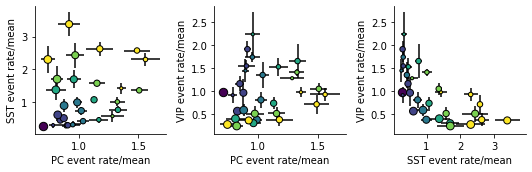

In [75]:
plt.close('all')
reload(sca)
plt.figure(figsize=(7.5, 2.5))
irun, ialign=0, 0
for iplot, (itype1, itype2) in enumerate([(0, 2), (0, 3), (2, 3)]):
    # itype1 = 2
    # itype2 = 3
    cmax = 6
    big_lbls = ['PC', 'PV', 'SST', 'VIP']

    data = np.nanmean(rsexpt[irun][itype1][ialign], -1)
    xdata = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
    # xdata = np.nanmean(data, 0)
    data = np.nanmean(rsexpt[irun][itype2][ialign], -1)
    ydata = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
    # ydata = np.nanmean(data, 0)

    plt.subplot(1, 3, iplot+1)
    sca.scatter_size_contrast_errorbar(xdata[:, :, :cmax], ydata[:, :, :cmax], equality_line=False, square=False, equate_0=True)
    # xtemp = np.linspace(0.3, 4, 100)
    # plt.plot(xtemp, 1/xtemp)
    slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(np.nanmean(xdata, 0).flatten(), np.nanmean(ydata, 0).flatten())
    print((r_value, p_value))
    x = np.linspace(np.nanmin(np.nanmean(xdata, 0)), np.nanmax(np.nanmean(xdata, 0)), 10)
    y1 = (slope-std_err)*x + intercept
    y2 = (slope+std_err)*x + intercept
    # plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
    plt.xlabel(f'{big_lbls[itype1]} event rate/mean')
    plt.ylabel(f'{big_lbls[itype2]} event rate/mean')
    plt.tight_layout()
    ut.erase_top_right()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


[ 0.45133677  1.35688228 -0.17476671  0.7737809 ]
2.2318887953132207
(0.716794636799695, 8.76529594924528e-07)
[ 0.32637062  1.41884987 -0.48271054  1.01688082]
6.275514487975009
(0.7807377783526307, 1.9483127796792363e-08)


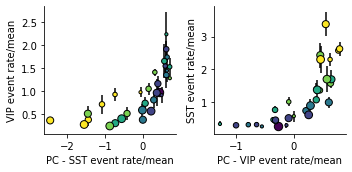

In [211]:
plt.close('all')
reload(sca)
plt.figure(figsize=(5, 2.5))
irun, ialign=0, 0
results = []
for iplot, (itype1, itype2, itype3) in enumerate([(0, 2, 3), (0, 3, 2)]):
    # itype1 = 2
    # itype2 = 3
    cmax = 6
    big_lbls = ['PC', 'PV', 'SST', 'VIP']

    data = np.nanmean(rsexpt[irun][itype1][ialign], -1)
    x1data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
    x2data = np.nanmean(rsexpt[irun][itype2][ialign], -1)
    x2data = x2data/np.nanmean(np.nanmean(x2data, -1), -1)[:, np.newaxis, np.newaxis]
    xdata = (np.nanmean(x1data, 0) - np.nanmean(x2data, 0))[np.newaxis]
    # xdata = np.nanmean(data, 0)
    data = np.nanmean(rsexpt[irun][itype3][ialign], -1)
    ydata = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
    # ydata = np.nanmean(data, 0)

    yy = np.nanmean(ydata, 0).flatten()
    xx = xdata.flatten()
    xx1 = np.nanmean(x1data, 0).flatten()
    xx2 = np.nanmean(x2data, 0).flatten()

    # def predict(theta, x=xx):
    #     a, b, c = theta
    #     return (a + b * np.maximum(0, x - c) ** 2)
    # def cost(theta):
    #     return np.sum( (yy - predict(theta))**2 )

    def predict(theta, x1=xx1, x2=xx2):
        a, b, c, d = theta
        return (a + b * np.maximum(0, x1 - d * x2 - c) ** 2)
    def cost(theta):
        return np.sum( (yy - predict(theta))**2 )
    
    result = sop.minimize(cost, [0, 0, 0, 0], method='L-BFGS-B')
    print(result.x)
    print(result.fun)
    results.append(result)

    plt.subplot(1, 2, iplot+1)
    sca.scatter_size_contrast_errorbar(xdata[:, :, :cmax], ydata[:, :, :cmax], equality_line=False, square=False, equate_0=True)
    # xtemp = np.linspace(0.3, 4, 100)
    # plt.plot(xtemp, 1/xtemp)
    slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(np.nanmean(xdata, 0).flatten(), np.nanmean(ydata, 0).flatten())
    print((r_value, p_value))
    x = np.linspace(np.nanmin(np.nanmean(xdata, 0)), np.nanmax(np.nanmean(xdata, 0)), 10)
    y1 = (slope-std_err)*x + intercept
    y2 = (slope+std_err)*x + intercept
    # plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
    plt.xlabel(f'{big_lbls[itype1]} - {big_lbls[itype2]} event rate/mean')
    plt.ylabel(f'{big_lbls[itype3]} event rate/mean')
    plt.tight_layout()
    ut.erase_top_right()
plt.savefig('figures/sst_vip_pc_nonlinearity_scatter_errorbars.jpg', dpi=300)

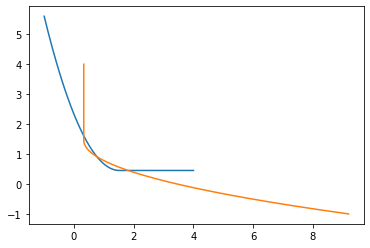

In [108]:
plt.figure()
xs = np.linspace(-1, 4, 500)
x1 = 1
result = results[0]
plt.plot(xs, predict(result.x, x1=x1, x2=xs))
result = results[1]
plt.plot(predict(result.x, x1=x1, x2=xs), xs)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:2252: RuntimeWarning: Mean of empty slice
  means = [np.nanmean(arg,axis=axis) for arg in args]
/Users/dan/Documents/code/adesnal/pyute.py:2253: RuntimeWarning: All-NaN axis encountered
  return np.nanmin(means,axis=0)


(0.8286875427983451, 4.3656819710021953e-10)


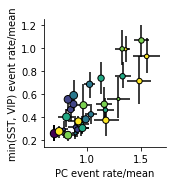

In [210]:
plt.close('all')
reload(sca)
plt.figure(figsize=(2.5, 2.5))
irun, ialign=0, 0
for iplot, (itype1, itype2, itype3) in enumerate([(2, 3, 0)]):
    # itype1 = 2
    # itype2 = 3
    cmax = 6
    big_lbls = ['PC', 'PV', 'SST', 'VIP']

    data = np.nanmean(rsexpt[irun][itype1][ialign], -1)
    y1data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
    y2data = np.nanmean(rsexpt[irun][itype2][ialign], -1)
    y2data = y2data/np.nanmean(np.nanmean(y2data, -1), -1)[:, np.newaxis, np.newaxis]
    ydata = np.minimum(np.nanmean(y1data, 0), np.nanmean(y2data, 0))[np.newaxis]
    # xdata = np.nanmean(data, 0)
    data = np.nanmean(rsexpt[irun][itype3][ialign], -1)
    xdata = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
    # ydata = np.nanmean(data, 0)

    # plt.subplot(1, 2, iplot+1)
    # sca.scatter_size_contrast_errorbar(xdata[:, :, :cmax], ydata[:, :, :cmax], equality_line=False, square=False, equate_0=True)
    sca.scatter_size_contrast_min_errorbar(xdata[:, :, :cmax], (y1data[:, :, :cmax], y2data[:, :, :cmax]),
        equality_line=False, square=False, equate_0=True)
    # xtemp = np.linspace(0.3, 4, 100)
    # plt.plot(xtemp, 1/xtemp)
    slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(np.nanmean(xdata, 0).flatten(), np.nanmean(ydata, 0).flatten())
    print((r_value, p_value))
    x = np.linspace(np.nanmin(np.nanmean(xdata, 0)), np.nanmax(np.nanmean(xdata, 0)), 10)
    y1 = (slope-std_err)*x + intercept
    y2 = (slope+std_err)*x + intercept
    # plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
    plt.ylabel(f'min({big_lbls[itype1]}, {big_lbls[itype2]}) event rate/mean')
    plt.xlabel(f'{big_lbls[itype3]} event rate/mean')
    plt.tight_layout()
    ut.erase_top_right()
plt.savefig('figures/pc_min_sst_vip_scatter_errorbars.jpg', dpi=300)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:939: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer[axis] = slice(None)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:944: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  slicer[axis] = axind
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:951: FutureWarning: Using a non-tuple sequence for multidimensional indexi

(0.5122676539249718, 0.001403143635975947)


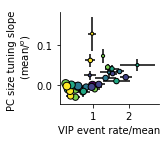

In [148]:
plt.close('all')
reload(sca)
rsexpt = self.rsexpt
usize = self.usize
plt.figure(figsize=(2.5, 2))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][itype2][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
xdata = data[:]#np.nanmean(data, 0)
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][1][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
zdata = data[:]#np.nanmean(data, 0)
# zdata = np.nanmean(np.nanmean(rsexpt[irun][0][ialign], 0), -1)
zdata_diff_avg = scf.compute_slope_avg(usize, zdata, axis=1)
# zdata_diff_avg = compute_diff_avg(zdata, axis=0)
# zdata_diff_avg = zdata_diff_avg/zdata
sca.scatter_size_contrast_errorbar(xdata, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
# plt.ylim(-0.5e-3, 1.5e-3)
# plt.ylim(-5e-3, 5e-3)
plt.xlabel('VIP event rate/mean')
plt.ylabel('PC size tuning slope \n (mean/$^o$)')

nbins = 6
xdata = np.nanmean(xdata, 0)
zdata_diff_avg = np.nanmean(zdata_diff_avg, 0)
mean, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='mean')
count, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='count')
std, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='std')
bin_inds = np.digitize(xdata, np.linspace(xdata.min(), xdata.max(), 10))
bin_ctrs = 0.5*(bin_edges[:-1]+bin_edges[1:])
sem = std/np.sqrt(count)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), zdata_diff_avg.flatten())
print((r_value, p_value))
x = np.linspace(xdata.min(), xdata.max(), 10)
y1 = (slope-std_err/2)*x + intercept
y2 = (slope+std_err/2)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
# plt.fill_between(bin_ctrs, mean-sem/2, mean+sem/2, facecolor='k', alpha=0.5)
ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/vip_pc_slope_size_tuning_scatter.jpg', dpi=300)

In [194]:
sst.spearmanr(xdata.flatten(), zdata_diff_avg.flatten())

SpearmanrResult(correlation=0.7230373230373232, pvalue=6.332807370763816e-07)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:1242: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope_avg = np.zeros_like(zdata)


(-0.36211571930327413, 0.029986243153766166)


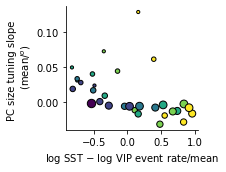

In [63]:
plt.close('all')
reload(sca)
reload(scf)
plt.figure(figsize=(3, 2.5))
irun, ialign=0, 0
itype1a = 2
itype1b = 3
rsexpt = self.rsexpt
usize = self.usize
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][itype1a][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
xdata = np.nanmean(data, 0)
data = np.nanmean(rsexpt[irun][itype1b][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
xdata = -np.log10(np.nanmean(data, 0)) + np.log10(xdata) #xdata = xdata - np.nanmean(data, 0)
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][1][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
zdata = np.nanmean(data, 0)
# zdata = np.nanmean(np.nanmean(rsexpt[irun][0][ialign], 0), -1)
zdata_diff_avg = scf.compute_slope_avg(usize, zdata, axis=0)
# zdata_diff_avg = compute_diff_avg(zdata, axis=0)
# zdata_diff_avg = zdata_diff_avg/zdata
sca.scatter_size_contrast(xdata, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
# plt.ylim(-0.5e-3, 1.5e-3)
# plt.ylim(-5e-3, 5e-3)
plt.xlabel('log SST $-$ log VIP event rate/mean')
plt.ylabel('PC size tuning slope \n (mean/$^o$)')
nbins = 6

mean, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='mean')
count, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='count')
std, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='std')
# bin_inds = np.digitize(xdata-ydata, np.linspace(xdata.min(), xdata.max(), 10))
bin_inds = np.digitize(xdata, np.linspace(xdata.min(), xdata.max(), 10))
bin_ctrs = 0.5*(bin_edges[:-1]+bin_edges[1:])
sem = std/np.sqrt(count)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), zdata_diff_avg.flatten())
print((r_value, p_value))
x = np.linspace(xdata.min(), xdata.max(), 10)
y1 = (slope-std_err/2)*x + intercept
y2 = (slope+std_err/2)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
# plt.fill_between(bin_ctrs, mean-sem/2, mean+sem/2, facecolor='k', alpha=0.5)
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/log_sst_minus_log_vip_pc_slope_size_tuning_scatter.jpg', dpi=300)

(13, 7, 6)
(-0.35144629479197176, 0.035568121446832184)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:1242: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope_avg = np.zeros_like(zdata)


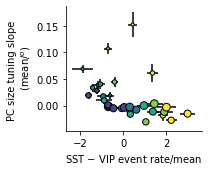

In [64]:
plt.close('all')
reload(sca)
plt.figure(figsize=(3, 2.5))
irun, ialign=0, 0
itype1a = 2
itype1b = 3
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][itype1a][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
x1data = data.copy()
data = np.nanmean(rsexpt[irun][itype1b][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
x2data = data.copy()
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][1][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
data = sim_utils.gen_size_tuning(data)
zdata = data
# zdata = np.nanmean(np.nanmean(rsexpt[irun][0][ialign], 0), -1)
zdata_diff_avg = scf.compute_slope_avg(self.usize0, zdata, axis=1)[:, 1:, :]
# zdata_diff_avg = compute_diff_avg(zdata, axis=0)
# zdata_diff_avg = zdata_diff_avg/zdata
sca.scatter_size_contrast_diff_errorbar(x1data, x2data, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
# plt.ylim(-0.5e-3, 1.5e-3)
# plt.ylim(-5e-3, 5e-3)
plt.xlabel('SST $-$ VIP event rate/mean')
plt.ylabel('PC size tuning slope \n (mean/$^o$)')

nbins = 6
xdata = np.nanmean(x1data, 0)-np.nanmean(x2data, 0)
zdata_diff_avg = np.nanmean(zdata_diff_avg, 0)
mean, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='mean')
count, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='count')
std, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='std')
bin_inds = np.digitize(xdata, np.linspace(xdata.min(), xdata.max(), 10))
bin_ctrs = 0.5*(bin_edges[:-1]+bin_edges[1:])
sem = std/np.sqrt(count)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), zdata_diff_avg.flatten())
print((r_value, p_value))
x = np.linspace(xdata.min(), xdata.max(), 10)
y1 = (slope-std_err/2)*x + intercept
y2 = (slope+std_err/2)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
# plt.fill_between(bin_ctrs, mean-sem/2, mean+sem/2, facecolor='k', alpha=0.5)
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/sst_minus_vip_pc_slope_size_tuning_scatter_errorbar.jpg', dpi=300)

(0.4432603819683311, 0.0067774207573917415)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/size_contrast_figures.py:1242: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope_avg = np.zeros_like(zdata)


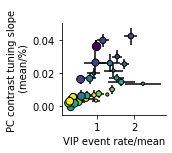

In [65]:
plt.close('all')
reload(sca)
rsexpt = self.rsexpt
ucontrast = self.ucontrast
plt.figure(figsize=(2.5, 2))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][itype2][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
xdata = data[:]#np.nanmean(data, 0)
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][1][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
zdata = data[:]#np.nanmean(data, 0)
# zdata = np.nanmean(np.nanmean(rsexpt[irun][0][ialign], 0), -1)
zdata_diff_avg = scf.compute_slope_avg(ucontrast, zdata, axis=2)
# zdata_diff_avg = compute_diff_avg(zdata, axis=0)
# zdata_diff_avg = zdata_diff_avg/zdata
sca.scatter_size_contrast_errorbar(xdata, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
# sca.scatter_size_contrast(xdata, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
# plt.ylim(-0.5e-3, 1.5e-3)
# plt.ylim(-5e-3, 5e-3)
plt.xlabel('VIP event rate/mean')
plt.ylabel('PC contrast tuning slope \n (mean/%)')

nbins = 6
xdata = np.nanmean(xdata, 0)
zdata_diff_avg = np.nanmean(zdata_diff_avg, 0)
mean, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='mean')
count, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='count')
std, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='std')
bin_inds = np.digitize(xdata, np.linspace(xdata.min(), xdata.max(), 10))
bin_ctrs = 0.5*(bin_edges[:-1]+bin_edges[1:])
sem = std/np.sqrt(count)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), zdata_diff_avg.flatten())
print((r_value, p_value))
x = np.linspace(xdata.min(), xdata.max(), 10)
y1 = (slope-std_err/2)*x + intercept
y2 = (slope+std_err/2)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
# plt.fill_between(bin_ctrs, mean-sem/2, mean+sem/2, facecolor='k', alpha=0.5)
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/vip_pc_slope_contrast_tuning_scatter.jpg', dpi=300)

In [248]:
for irun in range(2):
    for ialign in range(2):
        print((irun, ialign))
        for itype in range(5):
            print(np.sum(~np.isnan(np.nanmean(np.nanmean(np.nanmean(self.rsexpt[irun][itype][ialign][:, -1:], 1), 1), 1))))
        print('')

(0, 0)
5
7
2
3
6

(0, 1)
3
7
3
3
7

(1, 0)
7
3
1
3
2

(1, 1)
4
3
2
2
3



/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


In [140]:
sst.spearmanr(xdata.flatten(), zdata_diff_avg.flatten())

SpearmanrResult(correlation=0.6823680823680824, pvalue=4.56481948751668e-06)

<IPython.core.display.Javascript object>


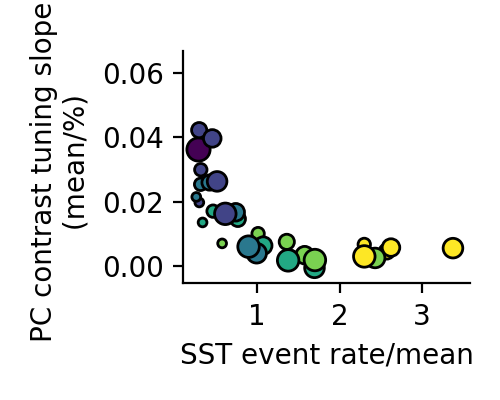

(-0.6589680212781747, 1.242642829758565e-05)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:20: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:25: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:32: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will

In [243]:
plt.close('all')
reload(sca)
plt.figure(figsize=(2.5, 2))
irun, ialign=0, 0
# itype1 = 2
itype2 = 2
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][itype2][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
xdata = np.nanmean(data, 0)
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][1][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
zdata = np.nanmean(data, 0)
# zdata = np.nanmean(np.nanmean(rsexpt[irun][0][ialign], 0), -1)
zdata_diff_avg = compute_slope_avg(ucontrast, zdata, axis=1)
# zdata_diff_avg = compute_diff_avg(zdata, axis=0)
# zdata_diff_avg = zdata_diff_avg/zdata
sca.scatter_size_contrast(xdata, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
# plt.ylim(-0.5e-3, 1.5e-3)
# plt.ylim(-5e-3, 5e-3)
plt.xlabel('SST event rate/mean')
plt.ylabel('PC contrast tuning slope \n (mean/%)')
nbins = 6

mean, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='mean')
count, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='count')
std, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='std')
bin_inds = np.digitize(xdata, np.linspace(xdata.min(), xdata.max(), 10))
bin_ctrs = 0.5*(bin_edges[:-1]+bin_edges[1:])
sem = std/np.sqrt(count)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), zdata_diff_avg.flatten())
print((r_value, p_value))
x = np.linspace(xdata.min(), xdata.max(), 10)
y1 = (slope-std_err/2)*x + intercept
y2 = (slope+std_err/2)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
# plt.fill_between(bin_ctrs, mean-sem/2, mean+sem/2, facecolor='k', alpha=0.5)
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/sst_pc_slope_contrast_tuning_scatter.jpg', dpi=300)

<IPython.core.display.Javascript object>


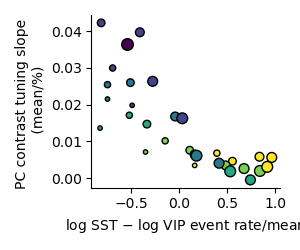

(-0.7243303386704377, 5.914035075505036e-07)


In [186]:
plt.close('all')
reload(sca)
plt.figure(figsize=(3, 2.5))
irun, ialign=0, 0
itype1a = 2
itype1b = 3
ucontrast = self.ucontrast
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][itype1a][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
xdata = np.nanmean(data, 0)
data = np.nanmean(rsexpt[irun][itype1b][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
xdata = np.log10(xdata) - np.log10(np.nanmean(data, 0))
data = np.nanmean(rsexpt[irun][1][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
zdata = np.nanmean(data, 0)
# zdata = np.nanmean(np.nanmean(rsexpt[irun][0][ialign], 0), -1)
zdata_diff_avg = scf.compute_slope_avg(ucontrast, zdata, axis=1)
# zdata_diff_avg = compute_diff_avg(zdata, axis=0)
# zdata_diff_avg = zdata_diff_avg/zdata
sca.scatter_size_contrast(xdata, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
# plt.ylim(-0.5e-3, 1.5e-3)
# plt.ylim(-5e-3, 5e-3)
plt.xlabel('log SST $-$ log VIP event rate/mean')
plt.ylabel('PC contrast tuning slope \n (mean/%)')
nbins = 6

mean, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='mean')
count, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='count')
std, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='std')
bin_inds = np.digitize(xdata, np.linspace(xdata.min(), xdata.max(), 10))
bin_ctrs = 0.5*(bin_edges[:-1]+bin_edges[1:])
sem = std/np.sqrt(count)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), zdata_diff_avg.flatten())
print((r_value, p_value))
x = np.linspace(xdata.min(), xdata.max(), 10)
y1 = (slope-std_err/2)*x + intercept
y2 = (slope+std_err/2)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
# plt.fill_between(bin_ctrs, mean-sem/2, mean+sem/2, facecolor='k', alpha=0.5)
ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/log_sst_minus_log_vip_pc_slope_contrast_tuning_scatter.jpg', dpi=300)

<IPython.core.display.Javascript object>


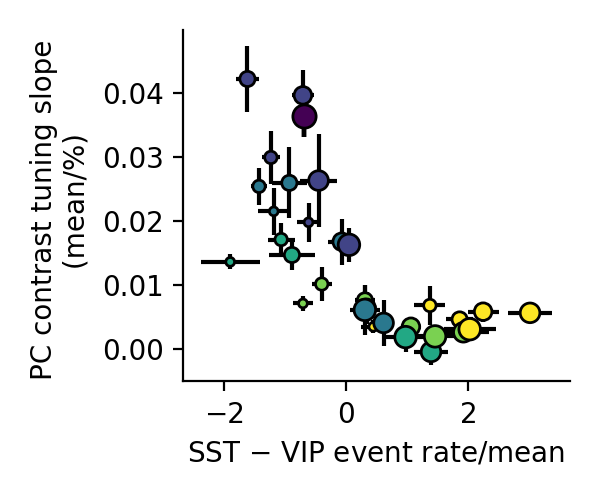

(-0.6385176484159618, 2.7853364557837103e-05)


In [132]:
plt.close('all')
reload(sca)
plt.figure(figsize=(3, 2.5))
irun, ialign=0, 0
itype1a = 2
itype1b = 3
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][itype1a][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
x1data = data.copy()
data = np.nanmean(rsexpt[irun][itype1b][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
x2data = data.copy()
data = np.nanmean(rsexpt[irun][1][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
zdata = data.copy()#np.nanmean(data, 0)
# zdata = np.nanmean(np.nanmean(rsexpt[irun][0][ialign], 0), -1)
zdata_diff_avg = scf.compute_slope_avg(self.ucontrast, zdata, axis=2)
# zdata_diff_avg = compute_diff_avg(zdata, axis=0)
# zdata_diff_avg = zdata_diff_avg/zdata
sca.scatter_size_contrast_diff_errorbar(x1data, x2data, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
# plt.ylim(-0.5e-3, 1.5e-3)
# plt.ylim(-5e-3, 5e-3)
plt.xlabel('SST $-$ VIP event rate/mean')
plt.ylabel('PC contrast tuning slope \n (mean/%)')
nbins = 6

xdata = np.nanmean(x1data, 0)-np.nanmean(x2data, 0)
zdata_diff_avg = np.nanmean(zdata_diff_avg, 0)
mean, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='mean')
count, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='count')
std, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='std')
bin_inds = np.digitize(xdata, np.linspace(xdata.min(), xdata.max(), 10))
bin_ctrs = 0.5*(bin_edges[:-1]+bin_edges[1:])
sem = std/np.sqrt(count)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), zdata_diff_avg.flatten())
print((r_value, p_value))
x = np.linspace(xdata.min(), xdata.max(), 10)
y1 = (slope-std_err/2)*x + intercept
y2 = (slope+std_err/2)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
# plt.fill_between(bin_ctrs, mean-sem/2, mean+sem/2, facecolor='k', alpha=0.5)
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/sst_minus_vip_pc_slope_contrast_tuning_scatter_errorbar.jpg', dpi=300)

<IPython.core.display.Javascript object>


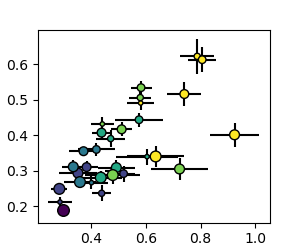

In [32]:
plt.close('all')
reload(sca)
plt.figure(figsize=(3, 2.5))
irun, ialign=0, 0
itype1a = 2
itype1b = 3
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
data = np.nanmean(rsexpt[irun][itype1a][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
x1data = data.copy()
data = np.nanmean(rsexpt[irun][itype1b][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
x2data = data.copy()
data = np.nanmean(rsexpt[irun][1][ialign], -1)
data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
zdata = data.copy()#np.nanmean(data, 0)
sca.scatter_size_contrast_diff_errorbar(x1data/np.nanmax(x1data), -x2data/np.nanmax(x2data), zdata/np.nanmax(zdata), equality_line=False, square=False, equate_0=True)
plt.xlabel('SST $-$ VIP event rate/mean')
plt.ylabel('PC contrast tuning slope \n (mean/%)')
nbins = 6

In [33]:
plt.close('all')

<IPython.core.display.Javascript object>


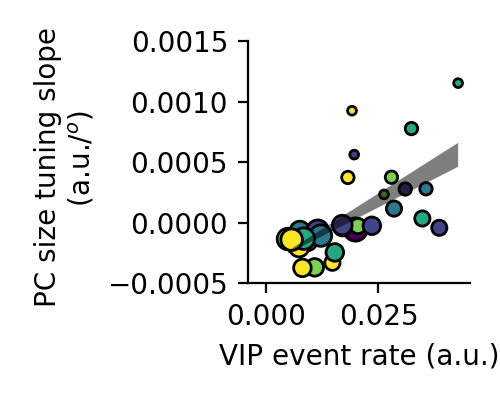

(0.6194725132404889, 5.61351795434774e-05)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:20: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:25: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:32: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will

In [62]:
# plt.close('all')
# reload(sca)
# plt.figure(figsize=(2.5, 2))
# irun, ialign=0, 0
# itype1 = 2
# itype2 = 3
# # xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
# xdata = np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
# zdata = np.nanmean(np.nanmean(rsexpt[irun][0][ialign], 0), -1)
# zdata_diff_avg = compute_slope_avg(usize, zdata, axis=0)
# # zdata_diff_avg = compute_diff_avg(zdata, axis=0)
# # zdata_diff_avg = zdata_diff_avg/zdata
# sca.scatter_size_contrast(xdata, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
# plt.ylim(-0.5e-3, 1.5e-3)
# # plt.ylim(-5e-3, 5e-3)
# plt.xlabel('VIP event rate (a.u.)')
# plt.ylabel('PC size tuning slope \n (a.u./$^o$)')
# # nbins = 6

# # mean, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='mean')
# # count, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='count')
# # std, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='std')
# # bin_inds = np.digitize(xdata-ydata, np.linspace(xdata.min(), xdata.max(), 10))
# bin_ctrs = 0.5*(bin_edges[:-1]+bin_edges[1:])
# sem = std/np.sqrt(count)
# slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), zdata_diff_avg.flatten())
# print((r_value, p_value))
# x = np.linspace(xdata.min(), xdata.max(), 10)
# y1 = (slope-std_err/2)*x + intercept
# y2 = (slope+std_err/2)*x + intercept
# plt.fill_between(x, y1, y2, facecolor='k', alpha=0.5)
# erase_top_right()
# # plt.fill_between(bin_ctrs, mean-sem/2, mean+sem/2, facecolor='k', alpha=0.5)
# plt.tight_layout()
# plt.savefig('figures/vip_pc_slope_size_tuning_scatter.jpg', dpi=300)

<IPython.core.display.Javascript object>


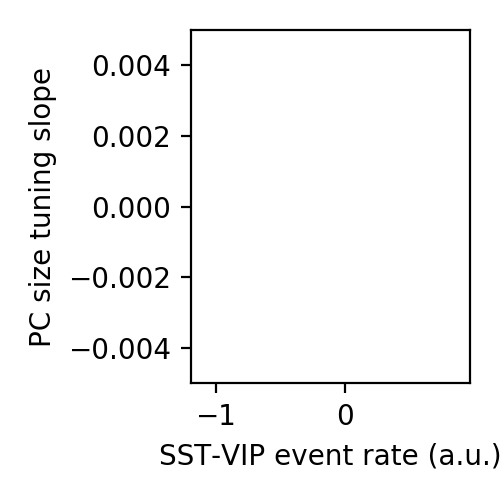

(-0.6371304412510735, 2.9358773328099158e-05)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  import sys
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:14: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  


In [34]:
plt.close('all')
reload(sca)
plt.figure(figsize=(2.5, 2.5))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
xdata = np.nanmean(np.nanmean(rsexpt[irun][itype1][ialign], 0), -1)#-np.nanmean(np.nanmean(rsexpt[irun][itype2][ialign], 0), -1)
zdata = np.nanmean(np.nanmean(rsexpt[irun][0][ialign], 0), -1)
zdata_diff_avg = compute_diff_avg(zdata)
xdata_diff_avg = compute_diff_avg(xdata)
# zdata_diff_avg = zdata_diff_avg/zdata
sca.scatter_size_contrast(xdata_diff_avg, zdata_diff_avg, equality_line=False, square=False, equate_0=True)
plt.ylim(-5e-3, 5e-3)
plt.xlabel('SST-VIP event rate (a.u.)')
plt.ylabel('PC size tuning slope')
nbins = 6

mean, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='mean')
count, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='count')
std, bin_edges, bin_inds = sst.binned_statistic(xdata.flatten(), zdata_diff_avg.flatten(), bins=nbins, statistic='std')
# bin_inds = np.digitize(xdata-ydata, np.linspace(xdata.min(), xdata.max(), 10))
bin_ctrs = 0.5*(bin_edges[:-1]+bin_edges[1:])
sem = std/np.sqrt(count)
slope,  intercept,  r_value,  p_value,  std_err = sst.linregress(xdata.flatten(), zdata_diff_avg.flatten())
print((r_value, p_value))
# plt.fill_between(bin_ctrs, mean-sem/2, mean+sem/2, facecolor='k', alpha=0.5)
plt.tight_layout()
# plt.savefig('figures/sst_vip_pc_size_tuning_scatter.eps')

<IPython.core.display.Javascript object>


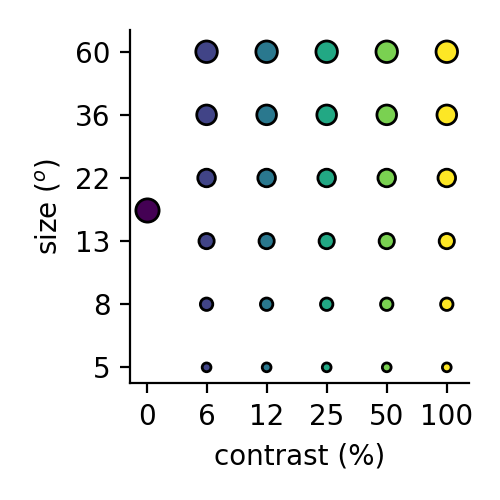

In [57]:
plt.close('all')
reload(sca)
plt.figure(figsize=(2.5, 2.5))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
xdata, ydata = np.meshgrid(np.arange(6), np.arange(6))
sca.scatter_size_contrast(xdata, ydata, equality_line=False, square=False, equate_0=True)
plt.yticks(np.arange(6), [5, 8, 13, 22, 36, 60])
plt.xticks(np.arange(6), [0, 6, 12, 25, 50, 100])
plt.xlabel('contrast (%)')
plt.ylabel('size ($^o$)')
# plt.xlabel('SST event rate (a.u.)')
# plt.ylabel('VIP event rate (a.u.)')
ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/scatter_size_contrast_legend_equate_0.eps')

<IPython.core.display.Javascript object>


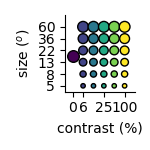

In [209]:
plt.close('all')
reload(sca)
plt.figure(figsize=(1.5, 1.5))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
xdata, ydata = np.meshgrid(np.arange(6), np.arange(6))
sca.scatter_size_contrast(xdata[:, :cmax], ydata[:, :cmax], equality_line=False, square=False, equate_0=True)
plt.yticks(np.arange(6), [5, 8, 13, 22, 36, 60])
# plt.xticks(np.arange(6), [0, 6, 12, 25, 50, 100])
plt.xticks([0, 1, 3, 5], [0, 6, 25, 100])
# plt.xticks([0, 2, 4], [0, 12, 50])
plt.xlim(-0.75, 6)
plt.ylim(-0.5, 6)
plt.xlabel('contrast (%)')
plt.ylabel('size ($^o$)')
# plt.xlabel('SST event rate (a.u.)')
# plt.ylabel('VIP event rate (a.u.)')
ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/scatter_size_contrast_legend_equate_0_small.eps')

<IPython.core.display.Javascript object>


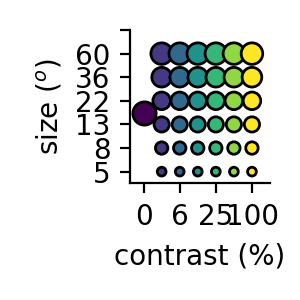

In [53]:
plt.close('all')
reload(sca)
plt.figure(figsize=(1.5, 1.5))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
xdata, ydata = np.meshgrid(np.arange(7), np.arange(6))
sca.scatter_size_contrast(xdata[:, :7], ydata[:, :7], equality_line=False, square=False, equate_0=True)
plt.yticks(np.arange(7), [5, 8, 13, 22, 36, 60])
# plt.xticks(np.arange(6), [0, 6, 12, 25, 50, 100])
plt.xticks([0, 2, 4, 6], [0, 6, 25, 100])
# plt.xticks([0, 2, 4], [0, 12, 50])
plt.xlim(-0.75, 7)
plt.ylim(-0.5, 6)
plt.xlabel('contrast (%)')
plt.ylabel('size ($^o$)')
# plt.xlabel('SST event rate (a.u.)')
# plt.ylabel('VIP event rate (a.u.)')
ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/scatter_size_contrast_legend_7_contrasts_equate_0_small.eps')

<IPython.core.display.Javascript object>


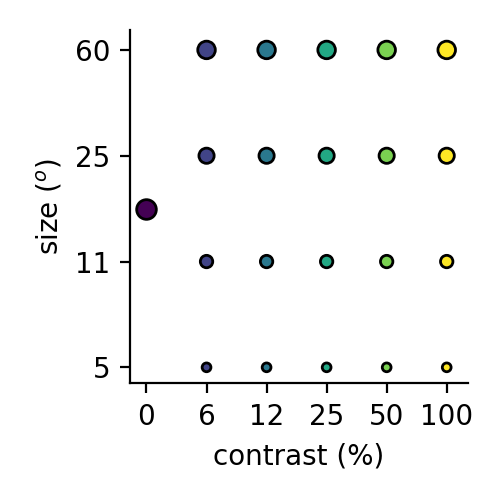

In [90]:
plt.close('all')
reload(sca)
plt.figure(figsize=(2.5, 2.5))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
xdata, ydata = np.meshgrid(np.arange(6), np.arange(4))
sca.scatter_size_contrast(xdata, ydata, equality_line=False, square=False, equate_0=True)
plt.yticks(np.arange(4), [5, 11, 25, 60])
plt.xticks(np.arange(6), [0, 6, 12, 25, 50, 100])
plt.xlabel('contrast (%)')
plt.ylabel('size ($^o$)')
# plt.xlabel('SST event rate (a.u.)')
# plt.ylabel('VIP event rate (a.u.)')
ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/scatter_size_contrast_legend_4_sizes_equate_0.eps')

<IPython.core.display.Javascript object>


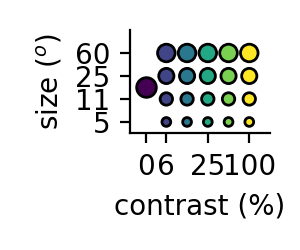

In [421]:
plt.close('all')
reload(sca)
plt.figure(figsize=(1.5, 1.25))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
xdata, ydata = np.meshgrid(np.arange(6), np.arange(4))
sca.scatter_size_contrast(xdata, ydata, equality_line=False, square=False, equate_0=True)
plt.yticks(np.arange(4), [5, 11, 25, 60])
# plt.xticks(np.arange(6), [0, 6, 12, 25, 50, 100])
plt.xticks([0, 1, 3, 5], [0, 6, 25, 100])
plt.xlabel('contrast (%)')
plt.ylabel('size ($^o$)')
# plt.xlabel('SST event rate (a.u.)')
# plt.ylabel('VIP event rate (a.u.)')
plt.xlim(-0.75, 6)
plt.ylim(-0.5, 4)
ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/scatter_size_contrast_legend_4_sizes_equate_0_small.eps')

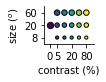

In [240]:
plt.close('all')
reload(sca)
plt.figure(figsize=(1.5, 1.25))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
xdata, ydata = np.meshgrid(np.arange(6), np.arange(3))
sca.scatter_size_contrast(xdata, ydata, equality_line=False, square=False, equate_0=True)
plt.yticks(np.arange(3), [8, 20, 60])
# plt.xticks(np.arange(6), [0, 6, 12, 25, 50, 100])
plt.xticks([0, 1, 3, 5], [0, 5, 20, 80])
plt.xlabel('contrast (%)')
plt.ylabel('size ($^o$)')
# plt.xlabel('SST event rate (a.u.)')
# plt.ylabel('VIP event rate (a.u.)')
plt.xlim(-0.75, 6)
plt.ylim(-0.5, 2.5)
ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/scatter_size_contrast_legend_3_sizes_equate_0_small.eps')

<IPython.core.display.Javascript object>


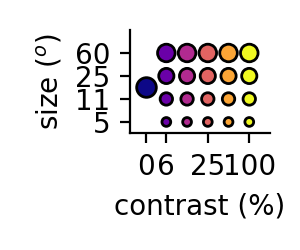

In [420]:
plt.close('all')
reload(sca)
plt.figure(figsize=(1.5, 1.25))
irun, ialign=0, 0
itype1 = 2
itype2 = 3
xdata, ydata = np.meshgrid(np.arange(6), np.arange(4))
sca.scatter_size_contrast(xdata, ydata, equality_line=False, square=False, equate_0=True, colormap=plt.cm.plasma)
plt.yticks(np.arange(4), [5, 11, 25, 60])
# plt.xticks(np.arange(6), [0, 6, 12, 25, 50, 100])
plt.xticks([0, 1, 3, 5], [0, 6, 25, 100])
plt.xlabel('contrast (%)')
plt.ylabel('size ($^o$)')
# plt.xlabel('SST event rate (a.u.)')
# plt.ylabel('VIP event rate (a.u.)')
plt.xlim(-0.75, 6)
plt.ylim(-0.5, 4)
ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/scatter_size_contrast_legend_4_sizes_equate_0_small_plasma.eps')

In [141]:
rs[0][1][0].shape

TypeError: 'int' object is not subscriptable

In [172]:
for irun in range(2):
    for itype in range(5):
        for ialign in range(2):
            data = rs[irun][itype][ialign]#.copy()#[:, :, :, :]
            pref_angle = np.argmax(np.nanmean(np.nanmean(data[:, :, 1:5, :], 1), 1), axis=-1)
            rs[irun][itype][ialign] = ut.circ_align_to_entry(data, pref_angle, axis=3)

In [174]:
irun, ialign = 0, 0
itype = 1
uangle = np.arange(0, 360, 45)
pref_size = np.argmax(np.nanmean(np.nanmean(rs[irun][itype][ialign], 3), 2), axis=1)

<IPython.core.display.Javascript object>


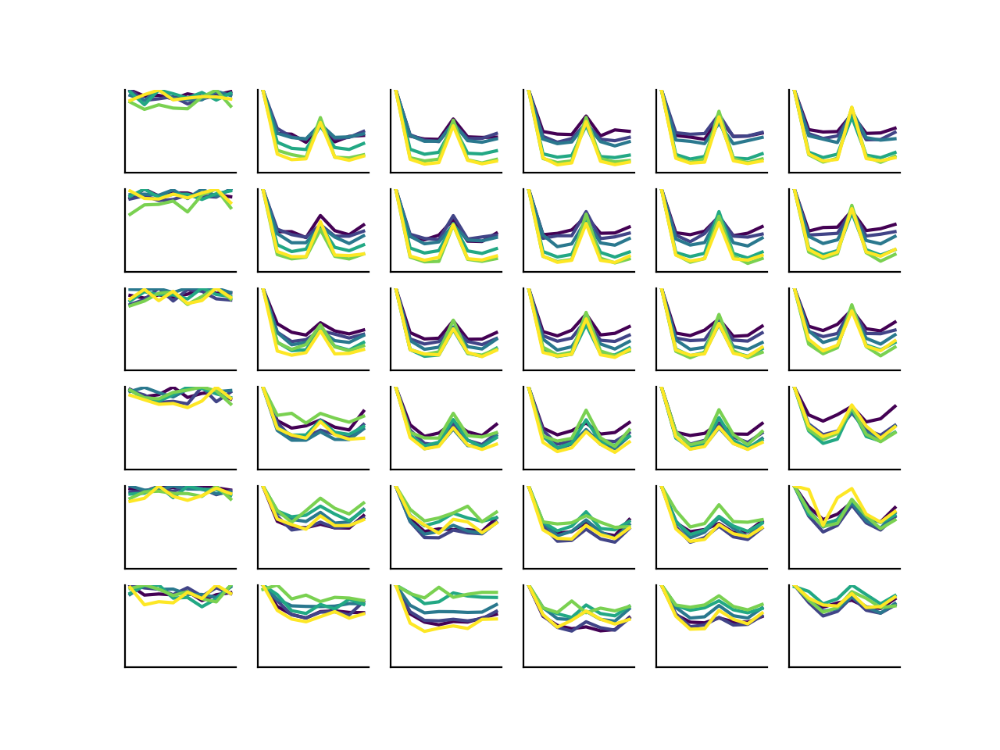

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if __name__ == '__main__':


In [175]:
nsize, ncontrast = 6, 6
plt.figure()
this_colormap = plt.cm.viridis(np.linspace(0, 1, nsize))
for this_pref_size in np.arange(nsize):
    this_data = rs[irun][itype][ialign][pref_size==this_pref_size]
    data = np.nanmean(this_data[:, :, :, :], 0)
    for isize in range(nsize):
        for icontrast in range(ncontrast):
            plt.subplot(nsize, ncontrast, (nsize-1-isize)*nsize+icontrast+1)
            plt.plot(data[isize, icontrast, :]/data[isize, icontrast, :].max(), c=this_colormap[this_pref_size])
            plt.ylim(0, 1)
            plt.xticks(())
            plt.yticks(())
            ut.erase_top_right()
#             plt.axhline(0.5, c='k', linestyle='dashed')
#             plt.plot(data[isize, icontrast, :])#/data[isize, icontrast, :].max())
#             plt.ylim(0, data.max())
# plt.savefig('figures/ori_tuning_by_size_contrast_prefsize_norm.eps')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


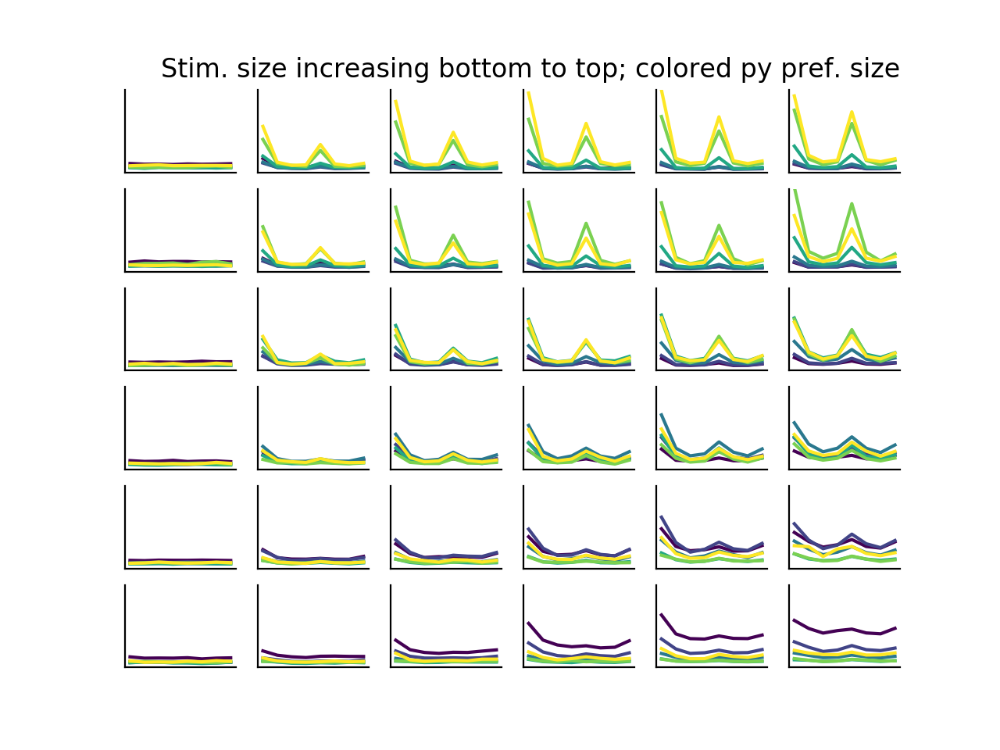

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:18: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


In [283]:
nsize, ncontrast = 6, 6
plt.figure()
this_colormap = plt.cm.viridis(np.linspace(0, 1, nsize))
for this_pref_size in np.arange(nsize):
    data = np.nanmean(rs[irun][itype][ialign][pref_size==this_pref_size, :, :, :], 0)
    for isize in range(nsize):
        for icontrast in range(ncontrast):
            plt.subplot(nsize, ncontrast, (nsize-1-isize)*nsize+icontrast+1)
#             plt.plot(data[isize, icontrast, :]/data[isize, icontrast, :].max(), c=this_colormap[this_pref_size])
#             plt.ylim(0, 1)
#             plt.axhline(0.5, c='k', linestyle='dashed')
            plt.plot(data[isize, icontrast, :], c=this_colormap[this_pref_size])#/data[isize, icontrast, :].max())
            plt.ylim(0, data.max())
            plt.xticks(())
            plt.yticks(())
            ut.erase_top_right()
plt.title('Stim. size increasing bottom to top; colored py pref. size', loc='right')
plt.tight_layout()
plt.savefig('figures/ori_tuning_by_size_contrast_prefsize.eps')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


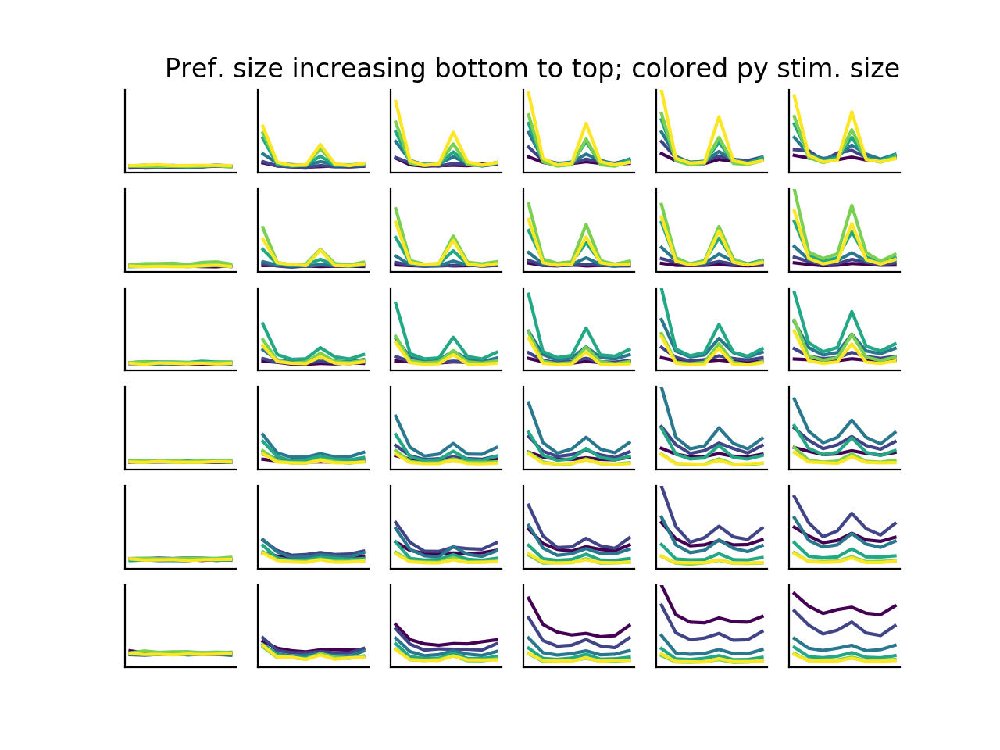

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


In [284]:
nsize, ncontrast = 6, 6
plt.figure()
this_colormap = plt.cm.viridis(np.linspace(0, 1, nsize))
for this_pref_size in np.arange(nsize):
    data = np.nanmean(rs[irun][itype][ialign][pref_size==this_pref_size, :, :, :], 0)
    for isize in range(nsize):
        for icontrast in range(ncontrast):
            plt.subplot(nsize, ncontrast, (nsize-1-this_pref_size)*nsize+icontrast+1)
#             plt.plot(data[isize, icontrast, :]/data[isize, icontrast, :].max(), c=this_colormap[this_pref_size])
#             plt.ylim(0, 1)
#             plt.axhline(0.5, c='k', linestyle='dashed')
            plt.plot(data[isize, icontrast, :], c=this_colormap[isize])#/data[isize, icontrast, :].max())
            plt.ylim(0, data.max())
            plt.xticks(())
            plt.yticks(())
            ut.erase_top_right()
plt.title('Pref. size increasing bottom to top; colored py stim. size', loc='right')
plt.savefig('figures/ori_tuning_by_prefsize_contrast_size.eps')

In [214]:
def von_mises_function(x, kappa, mu, ht):
    # x: directions in radians
    # kappa: tuning sharpness parameter
    # mu: preferred direction in radians
    # ht: height of non-preferred direction peak relative to preferred
    return (np.exp(kappa*np.cos(x-mu)) + ht*np.exp(kappa*np.cos(x-mu-np.pi)))/(np.exp(kappa) + ht*np.exp(-kappa))
def sym_von_mises_function(x, kappa, amplitude, offset=0):
    # constraining ht = 1 above
    # multiplies output of von_mises_function() by amplitude
    return amplitude*von_mises_function(x, kappa, 0, 1)+offset
def svm_fn(*args):#kappa, amplitude):
    # wrapper function,  using fixed uangle in degrees
    return sym_von_mises_function(np.deg2rad(uangle), *args)#kappa, amplitude)
def svm_cost(x, data):
    # computes cost given parameters (kappa,  amplitude[,  optionally offset])
    return np.nansum((data-svm_fn(*x))**2)
def svm_cost_l1(x, data, lam=1):
    # computes cost given (kappa,  amplitude[,  optionally offset]),  with an L1 penalty on kappa (exponential distribution prior on kappa)
    return np.nansum((data-svm_fn(*x))**2) + lam*x[0]
def optimize_kappa(data, x0=None, cost_fn=svm_cost, args=()):
    # given data,  optimize (kappa,  amplitude) inputs to svm_fn(),  and return kappa
    if x0 is None:
        x0 = np.array((1, np.nanmax(data)))
    result = sop.minimize(cost_fn, x0, args=(data, )+args, bounds=[(0, np.inf), (0, np.inf)])
    kappa = result.x[0]
    return kappa
def optimize_kappa_offset(data, x0=None, cost_fn=svm_cost, args=()):
    # given data,  optimize (kappa,  amplitude) inputs to svm_fn(),  and return kappa
    if x0 is None:
        x0 = np.array((1, np.nanmax(data), 0))
    result = sop.minimize(cost_fn, x0, args=(data, )+args, bounds=[(0, np.inf), (0, np.inf), (-np.inf, np.inf)])
    kappa = result.x[0]
    return kappa
def kappa_s0_fn(s0, k0, sizes):
    return k0**2/(1/s0**2 + 1/sizes**2)
def kappa_s0_cost(x, data, k0, sizes):
    return np.nansum((data-kappa_s0_fn(x, k0, sizes))**2)
def optimize_s0(data, k0=k0, sizes=usize, x0=np.array((10, )), cost_fn=kappa_s0_cost, args=()):
    result = sop.minimize(kappa_s0_cost, x0, args=(data, k0, sizes)+args, bounds=[(0, np.inf)])
    s0 = result.x
    return s0


In [ ]:
def ayaz_s0_cost(x, data, k0, sizes):
    return np.nansum((data-kappa_s0_fn(x, k0, sizes))**2)
def optimize_ayaz_s0_cost(data, k0=k0, sizes=usize, contrasts=ucontrast, x0=np.array((10, )), cost_fn=ayaz_kappa_s0_cost, args=()):
    # data (nsize, ncontrast, nangle)
    result = sop.minimize(kappa_s0_cost, x0, args=(data, k0, sizes)+args, bounds=[(0, np.inf)])
    s0 = result.x

In [261]:
# l1_lambda = 3e-2
l1_lambda = 0e-2

In [207]:
import von_mises_analysis as vma

<IPython.core.display.Javascript object>


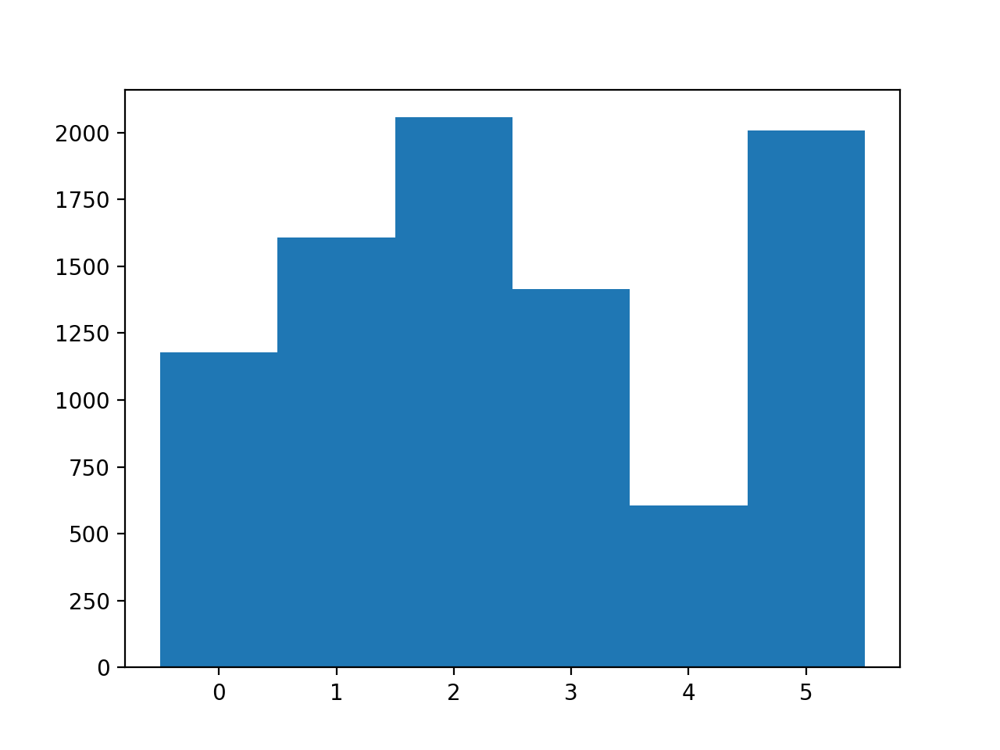

(array([1179., 1607., 2056., 1415.,  606., 2007.]),
 array([-0.5,  0.5,  1.5,  2.5,  3.5,  4.5,  5.5]),
 <a list of 6 Patch objects>)

In [208]:
plt.figure()
plt.hist(pref_size, bins=np.arange(7)-0.5)

In [271]:
reload(vma)
kappa = np.zeros((nsize, nsize, ncontrast))
amplitude = np.zeros((nsize, nsize, ncontrast))
kappa_offset = np.zeros((nsize, nsize, ncontrast))
for this_pref_size in range(nsize):
    data = rs[irun][itype][ialign][pref_size==this_pref_size, :, :, :]
    pref_angle = np.argmax(np.nanmean(np.nanmean(data[:, :, 1:5, :], 1), 1), axis=-1)
    data = ut.circ_align_to_entry(data, pref_angle, axis=3)
    data = np.nanmean(data, 0)
    for isize in range(nsize):
        for icontrast in range(ncontrast):
#             print((this_pref_size, isize, icontrast))
#             result = sop.minimize(svm_cost, np.array((1, 1)), args=(data[isize, icontrast], ), bounds=[(0, np.inf), (0, np.inf)])
#             kappa[this_pref_size, isize, icontrast] = result.x[0]
            kappa[this_pref_size, isize, icontrast], amplitude[this_pref_size, isize, icontrast] = vma.optimize_kappa(data[isize, icontrast], cost_fn=vma.svm_cost_l1, args=(l1_lambda, ))#, x0=(1, 1))
#             kappa[this_pref_size, isize, icontrast] = optimize_kappa(data, cost_fn=svm_cost, x0=(1, 1))
            kappa_offset[this_pref_size, isize, icontrast] = vma.optimize_kappa_offset(data[isize, icontrast], cost_fn=vma.svm_cost_l1, args=(0.3*l1_lambda, ))#, x0=(1, 1))
    

In [244]:
vma.svm_cost((1, np.nanmean(data)), data)

0.046042870291165564

In [245]:
vma.svm_cost((0, np.nanmean(data)), data)

0.050510697725278636

<IPython.core.display.Javascript object>


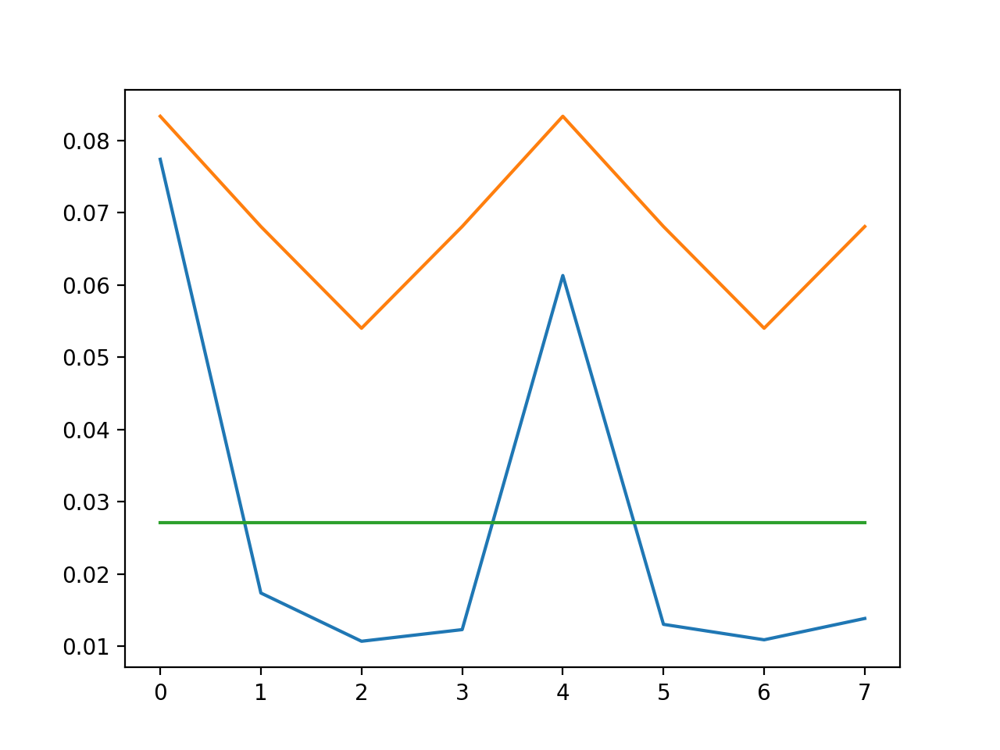

In [260]:
plt.figure()
plt.plot(data[isize, icontrast])
plt.plot(vma.svm_fn(1, np.nanmax(data)))
plt.plot(vma.svm_fn(0, 0.027123479514770763))

In [263]:
kappa#[this_pref_size, isize, icontrast]

array([[[4.16465194e-01, 7.59718648e-01, 8.58662621e-01, 9.99977892e-01,
         9.99926751e-01, 7.06467626e-01],
        [1.16025139e-02, 9.99992823e-01, 1.11109119e+00, 1.34110865e+00,
         1.23122537e+00, 9.99973166e-01],
        [6.92083344e-02, 9.99995554e-01, 1.37645885e+00, 1.29946282e+00,
         1.36612713e+00, 9.99989218e-01],
        [2.97607227e-02, 1.26680069e+00, 1.59254172e+00, 1.44216127e+00,
         1.41806989e+00, 1.29757332e+00],
        [6.49255322e-02, 1.35086657e+00, 1.64545799e+00, 9.99999026e-01,
         9.99999315e-01, 9.99998587e-01],
        [2.91273076e-01, 1.35123388e+00, 1.54103003e+00, 9.99998888e-01,
         1.47270591e+00, 9.99998991e-01]],

       [[2.44771739e-01, 7.70184772e-01, 8.58796703e-01, 1.15420289e+00,
         1.00003516e+00, 9.99926685e-01],
        [2.47028552e-01, 1.00008458e+00, 1.29772680e+00, 1.60632383e+00,
         1.59339187e+00, 1.35359318e+00],
        [3.65294895e-01, 1.34275287e+00, 1.82545337e+00, 1.63690993e+00,
     

<IPython.core.display.Javascript object>


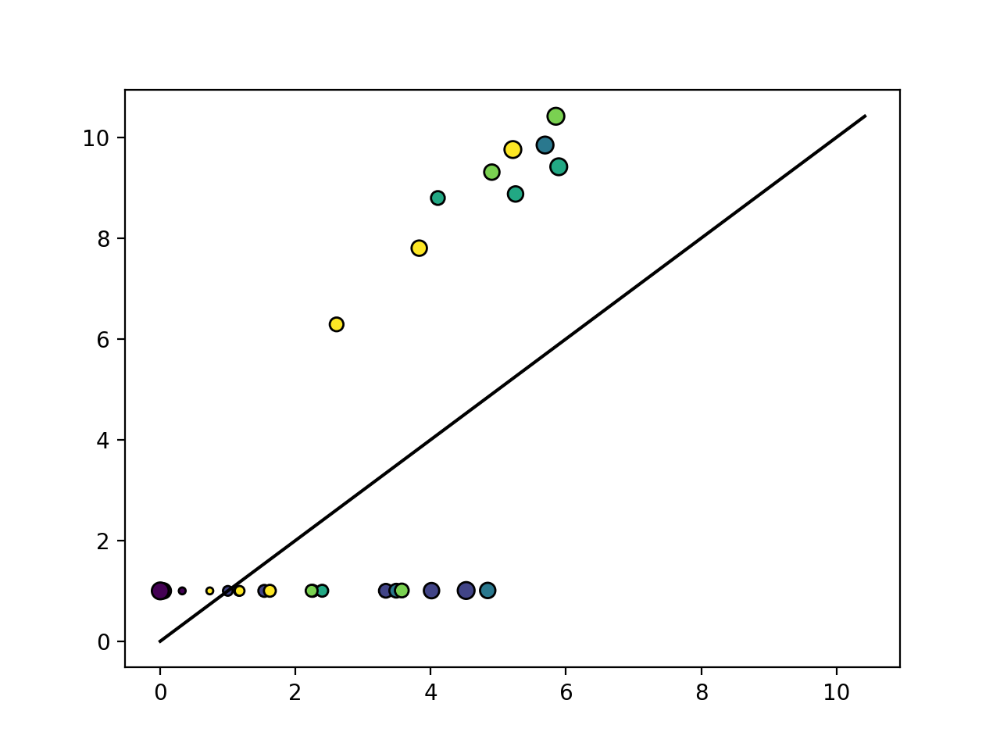

In [264]:
plt.figure()
sca.scatter_size_contrast(kappa[-1], kappa_offset[-1])

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


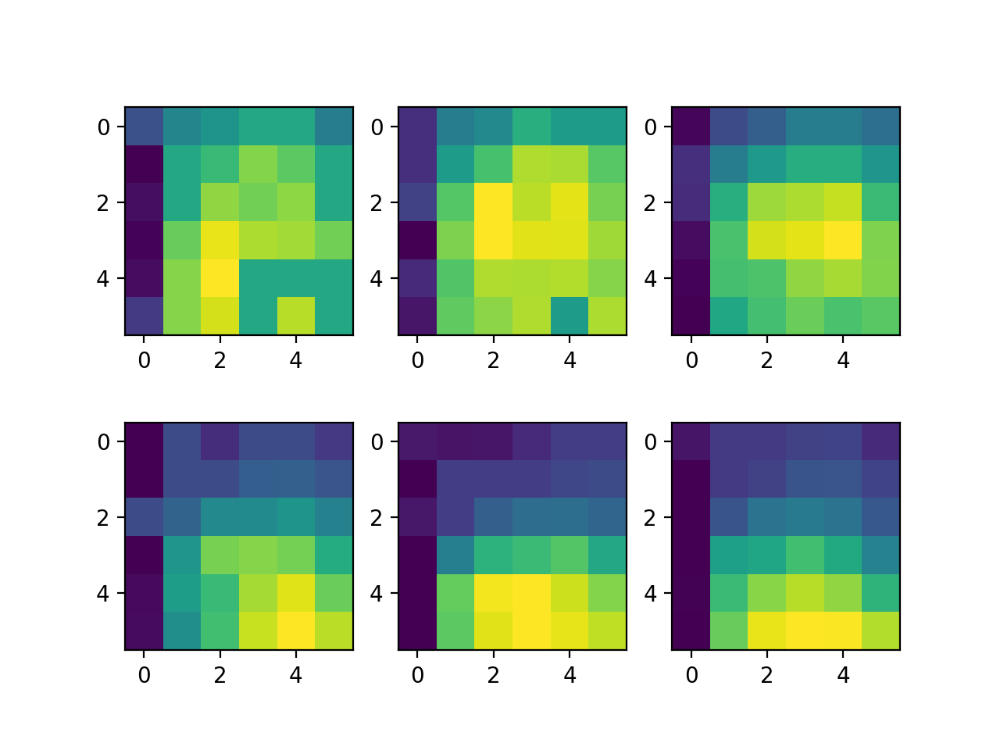

In [286]:
plt.figure()
for isize in range(nsize):
    plt.subplot(2, 3, isize+1)
    plt.imshow(kappa[isize])

In [402]:
k0 = 0.08
s0 = 20
a = 1.25

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


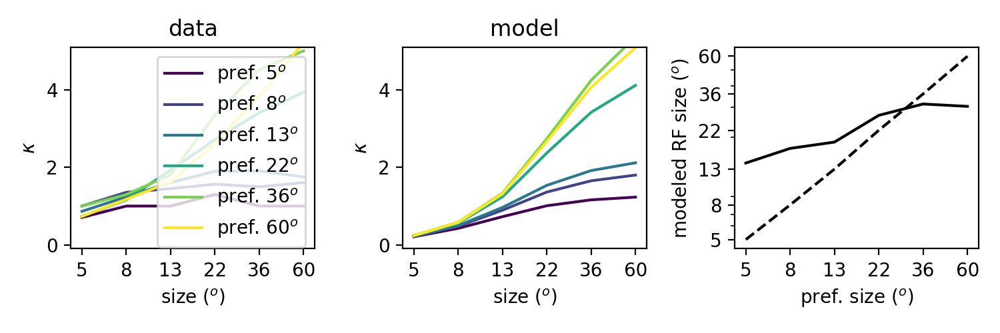

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous 

In [403]:
s0s = np.zeros((nsize, ))
# plt.figure(figsize=(10.5, 3.5))
plt.figure(figsize=(7.5, 2.5))
ylim = (-0.1, 5.1)
for isize in range(nsize):
    plt.subplot(1, 3, 1)
    plt.plot(kappa[isize, :, -1], c=this_colormap[isize], label='pref. %d$^o$'%usize[isize])
#     s0 = usize[isize]/2
    s0s[isize] = optimize_s0(kappa[isize, :, -1], k0=k0, sizes=a*usize)
    modeled_kappa = k0**2/(1/s0s[isize]**2 + 1/(a*usize)**2)
    plt.ylim(ylim)
    plt.subplot(1, 3, 2)
    plt.plot(modeled_kappa, c=this_colormap[isize])
for iplot in range(2):
    plt.subplot(1, 3, iplot+1)
    plt.ylim(ylim)
    plt.xlabel('size ($^o$)')
    plt.ylabel('$\kappa$')
    plt.xticks(np.arange(6), usize)
plt.subplot(1, 3, 1)
plt.title('data')
plt.legend()
plt.subplot(1, 3, 2)
plt.title('model')
plt.subplot(1, 3, 3)
plt.semilogy(s0s, c='k')
plt.semilogy(usize, c='k', linestyle='dashed')
plt.xticks(np.arange(6), usize)
plt.yticks([])
plt.yticks(usize, usize)
plt.xlabel('pref. size ($^o$)')
plt.ylabel('modeled RF size ($^o$)')
plt.tight_layout()
# plt.savefig('figures/kappa_by_size_and_pref_size.eps')

<IPython.core.display.Javascript object>


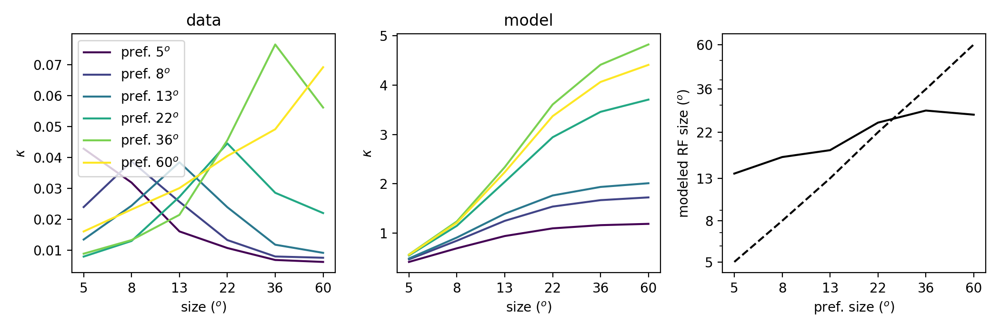

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Adding an axes us

In [276]:
s0s = np.zeros((nsize, ))
plt.figure(figsize=(10.5, 3.5))
ylim = (-0.1, 5.1)
for isize in range(nsize):
    plt.subplot(1, 3, 1)
    plt.plot(amplitude[isize, :, -1], c=this_colormap[isize], label='pref. %d$^o$'%usize[isize])
#     s0 = usize[isize]/2
    s0s[isize] = optimize_s0(kappa[isize, :, -1], k0=k0, sizes=a*usize)
    modeled_kappa = k0**2/(1/s0s[isize]**2 + 1/(a*usize)**2)
#     plt.ylim(ylim)
    plt.subplot(1, 3, 2)
    plt.plot(modeled_kappa, c=this_colormap[isize])
for iplot in range(2):
    plt.subplot(1, 3, iplot+1)
#     plt.ylim(ylim)
    plt.xlabel('size ($^o$)')
    plt.ylabel('$\kappa$')
    plt.xticks(np.arange(6), usize)
plt.subplot(1, 3, 1)
plt.title('data')
plt.legend()
plt.subplot(1, 3, 2)
plt.title('model')
plt.subplot(1, 3, 3)
plt.semilogy(s0s, c='k')
plt.semilogy(usize, c='k', linestyle='dashed')
plt.xticks(np.arange(6), usize)
plt.yticks([])
plt.yticks(usize, usize)
plt.xlabel('pref. size ($^o$)')
plt.ylabel('modeled RF size ($^o$)')
plt.tight_layout()
# plt.savefig('figures/kappa_by_size_and_pref_size.eps')

In [393]:
reload(vma)
irun, itype, ialign = 0, 1, 0
nneuron = rs[irun][itype][ialign].shape[0]
kappa_neuron = np.zeros((nneuron, nsize, ncontrast))
amplitude_neuron = np.zeros((nneuron, nsize, ncontrast))
kappa_offset_neuron = np.zeros((nneuron, nsize, ncontrast))
for ineuron in range(nneuron):
    data = rs[irun][itype][ialign][ineuron, :, :, :]
    pref_angle = np.argmax(np.nanmean(np.nanmean(data[:, 1:, :], 0), 0), axis=-1)
    data = ut.circ_align_to_entry(data[np.newaxis], pref_angle[np.newaxis], axis=3)[0]
#     data = np.nanmean(data, 0)
    for isize in range(nsize):
        for icontrast in range(ncontrast):
#             print((this_pref_size, isize, icontrast))
#             result = sop.minimize(svm_cost, np.array((1, 1)), args=(data[isize, icontrast], ), bounds=[(0, np.inf), (0, np.inf)])
#             kappa[this_pref_size, isize, icontrast] = result.x[0]
            kappa_neuron[ineuron, isize, icontrast], amplitude_neuron[ineuron, isize, icontrast] = vma.optimize_kappa(data[isize, icontrast], cost_fn=vma.svm_cost_l1, args=(l1_lambda, ))#, x0=(1, 1))
#             kappa[this_pref_size, isize, icontrast] = optimize_kappa(data, cost_fn=svm_cost, x0=(1, 1))
            kappa_offset_neuron[ineuron, isize, icontrast] = vma.optimize_kappa_offset(data[isize, icontrast], cost_fn=vma.svm_cost_l1, args=(0.3*l1_lambda, ))#, x0=(1, 1))
    

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: overflow encountered in exp
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/von_mises_analysis.py:14: RuntimeWarning: invalid value encountered in true_divide
  return (np.exp(kappa*np.cos(x-mu)) + ht*np.exp(kappa*np.cos(x-mu-np.pi)))/(np.exp(kappa) + ht*np.exp(-kappa))


In [342]:
irun, itype, ialign = 0, 1, 0
data = rs[irun][itype][ialign][:, :, :, :, np.newaxis]
osi = ut.compute_osi(data)[:, :, :, 0]
pref_size = np.argmax(np.nanmean(np.nanmean(rs[irun][itype][ialign], 3), 2), axis=1)

In [375]:
pref_size.shape

(8870,)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


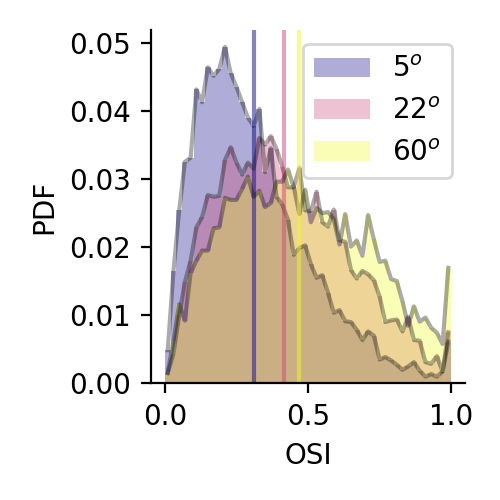

0.3111446287691844
0.4163997115296443
0.468831184800508


In [372]:
reload(ut)
plt.figure(figsize=(2.5, 2.5))
icontrast = 5
these_sizes = [0, 3, 5]
alpha = 0.33
cs = plt.cm.plasma(np.linspace(0, 1, len(these_sizes)))
for iisize, isize in enumerate(these_sizes):
    ut.bar_pdf(osi[:, isize, icontrast], alpha=alpha, bins=np.linspace(0, 1, 51), color=cs[iisize])
plt.legend(['%d$^o$'%n for n in [5, 22, 60]])
for iisize, isize in enumerate(these_sizes):
    ut.line_pdf(osi[:, isize, icontrast], alpha=alpha, bins=np.linspace(0, 1, 51), color='k')
    plt.axvline(np.nanmean(osi[:, isize, icontrast]), c=cs[iisize], alpha=0.5)#linestyle='dashed')
    print(np.nanmean(osi[:, isize, icontrast]))
plt.xlabel('OSI')
plt.ylabel('PDF')
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/osi_pdf_l23_pc_by_size.jpg', dpi=300)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


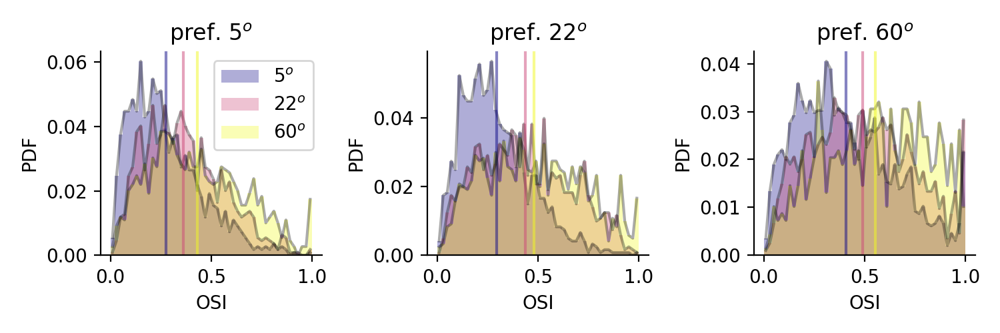

0.27437274726127503
0.36135792699690245
0.4295221168326001
0.29447333073843057
0.4358670997943588
0.4793640370770648
0.4072314836668548
0.4895337074319337
0.5535971447597022


In [380]:
reload(ut)
these_sizes = [0, 3, 5]
icontrast = 5

plt.figure(figsize=(7.5, 2.5))
for ipref, this_pref_size in enumerate(these_sizes):
    plt.subplot(1, 3, ipref+1)
    alpha = 0.33
    cs = plt.cm.plasma(np.linspace(0, 1, len(these_sizes)))
    for iisize, isize in enumerate(these_sizes):
        ut.bar_pdf(osi[pref_size==this_pref_size, isize, icontrast], alpha=alpha, bins=np.linspace(0, 1, 51), color=cs[iisize])
    if ipref==0:
        plt.legend(['%d$^o$'%n for n in [5, 22, 60]])
    for iisize, isize in enumerate(these_sizes):
        ut.line_pdf(osi[pref_size==this_pref_size, isize, icontrast], alpha=alpha, bins=np.linspace(0, 1, 51), color='k')
        plt.axvline(np.nanmean(osi[pref_size==this_pref_size, isize, icontrast]), c=cs[iisize], alpha=0.5)#linestyle='dashed')
        print(np.nanmean(osi[pref_size==this_pref_size, isize, icontrast]))
    plt.xlabel('OSI')
    plt.ylabel('PDF')
    ut.erase_top_right()
    plt.title('pref. %d$^o$'%usize[this_pref_size])
plt.tight_layout()
plt.savefig('figures/osi_pdf_l23_pc_by_pref_size_and_size.jpg', dpi=300)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


<IPython.core.display.Javascript object>


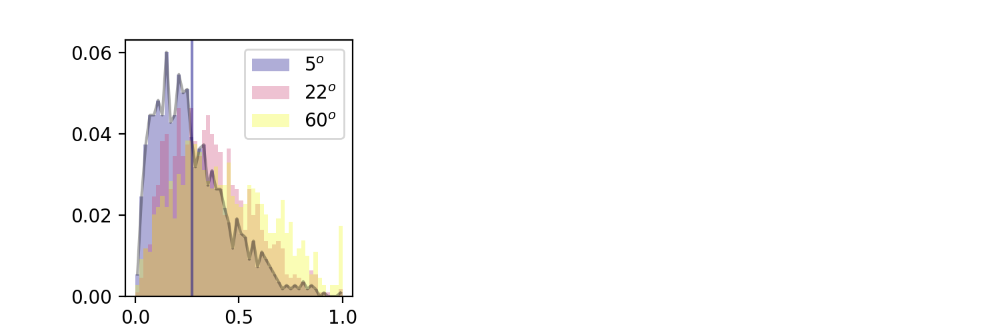

IndexError: boolean index did not match indexed array along dimension 0; dimension is 204 but corresponding boolean dimension is 8870

In [392]:
reload(ut)
these_sizes = [0, 3, 5]
icontrast = 5

plt.figure(figsize=(7.5, 2.5))
osi_mean = np.zeros((len(these_sizes), len(these_sizes)))
osi_sem = np.zeros((len(these_sizes), len(these_sizes)))
kappa_mean = np.zeros((len(these_sizes), len(these_sizes)))
kappa_sem = np.zeros((len(these_sizes), len(these_sizes)))
for ipref, this_pref_size in enumerate(these_sizes):
    plt.subplot(1, 3, ipref+1)
    alpha = 0.33
    cs = plt.cm.plasma(np.linspace(0, 1, len(these_sizes)))
    for iisize, isize in enumerate(these_sizes):
        ut.bar_pdf(osi[pref_size==this_pref_size, isize, icontrast], alpha=alpha, bins=np.linspace(0, 1, 51), color=cs[iisize])
    if ipref==0:
        plt.legend(['%d$^o$'%n for n in [5, 22, 60]])
    for iisize, isize in enumerate(these_sizes):
        ut.line_pdf(osi[pref_size==this_pref_size, isize, icontrast], alpha=alpha, bins=np.linspace(0, 1, 51), color='k')
        plt.axvline(np.nanmean(osi[pref_size==this_pref_size, isize, icontrast]), c=cs[iisize], alpha=0.5)#linestyle='dashed')
        osi_mean[ipref, iisize] = np.nanmean(osi[pref_size==this_pref_size, isize, icontrast])
        osi_sem[ipref, iisize] = np.nanstd(osi[pref_size==this_pref_size, isize, icontrast])/np.sqrt((pref_size==this_pref_size).sum())
        kappa_mean[ipref, iisize] = np.nanmean(kappa_neuron[pref_size==this_pref_size, isize, icontrast])
        kappa_sem[ipref, iisize] = np.nanstd(kappa_neuron[pref_size==this_pref_size, isize, icontrast])/np.sqrt((pref_size==this_pref_size).sum())
    plt.xlabel('OSI')
    plt.ylabel('PDF')
    ut.erase_top_right()
    plt.title('pref. %d$^o$'%usize[this_pref_size])
plt.tight_layout()
# plt.savefig('figures/osi_pdf_l23_pc_by_pref_size_and_size.jpg', dpi=300)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


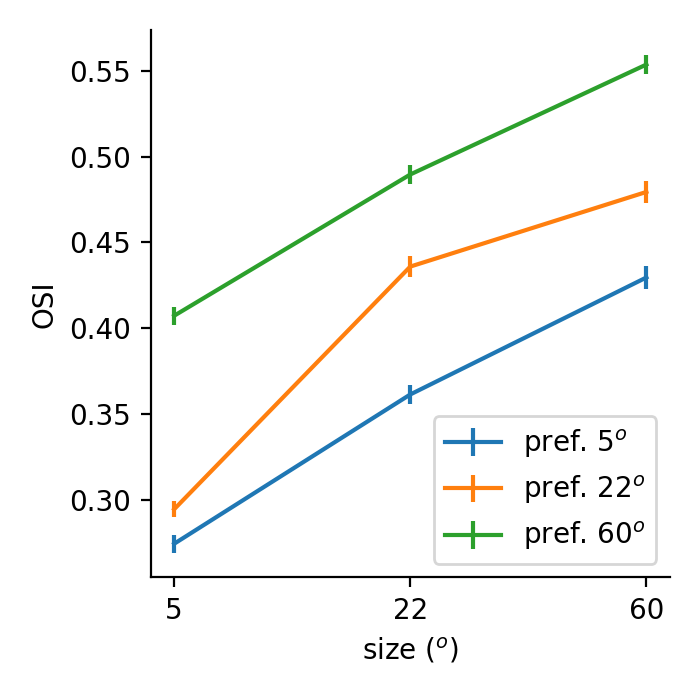

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [391]:
plt.figure(figsize=(3.5, 3.5))
for ipref in range(3):
    plt.errorbar(np.arange(3), osi_mean[ipref], osi_sem[ipref])
plt.xticks(np.arange(3), [usize[ts] for ts in these_sizes])
plt.xlabel('size ($^o$)')
plt.ylabel('OSI')
plt.tight_layout()
ut.erase_top_right()
plt.legend(['pref. %d$^o$'%usize[ts] for ts in these_sizes])
plt.savefig('figures/mean_osi_by_size_and_pref_size.eps')

In [54]:
# import scipy.io as sio

# irun = 0
# ialign = 0

# usize = np.array((5, 8, 13, 22, 36, 60))
# ucontrast = np.array((0, 6, 12, 25, 50, 100))

# def norm_to_exptwise_mean(vip_sc_event_rate, vip_sc_expt_ids):
#     nexpt = int(vip_sc_expt_ids.max()+1)
#     mn = np.ones((nexpt, ))
#     for iexpt in range(nexpt):
#         mn[iexpt] = np.nanmean(vip_sc_event_rate[vip_sc_expt_ids==iexpt])
#     print(mn)
#     return vip_sc_event_rate/mn[vip_sc_expt_ids.astype('int')][:, np.newaxis, np.newaxis]

# itype = 3
# # lkat = (expt_ids[irun][itype][ialign]!=10)
# lkat = np.ones((rs[irun][itype][ialign].shape[0], ), dtype='bool')
# vip_sc_event_rate = np.nanmean(rs[irun][itype][ialign][lkat], 3)
# vip_sc_expt_ids = expt_ids[irun][itype][ialign][lkat]
# vip_sc_event_rate_norm = norm_to_exptwise_mean(vip_sc_event_rate, vip_sc_expt_ids)

# itype = 2
# sst_sc_event_rate = np.nanmean(rs[irun][itype][ialign], 3)
# sst_sc_expt_ids = expt_ids[irun][itype][ialign]
# sst_sc_event_rate_norm = norm_to_exptwise_mean(sst_sc_event_rate, sst_sc_expt_ids)

# matdict = {'vip_sc_event_rate':vip_sc_event_rate, \
#            'vip_sc_event_rate_norm':vip_sc_event_rate_norm, \
#            'sst_sc_event_rate':sst_sc_event_rate, \
#            'sst_sc_event_rate_norm':sst_sc_event_rate_norm, \
#            'sizes':usize, \
#            'contrasts':ucontrast, \
#            'array_dims':'Neuron_x_Size_x_Contrast', \
#            'vip_sc_expt_ids':vip_sc_expt_ids, \
#            'sst_sc_expt_ids':sst_sc_expt_ids}


# sio.savemat('vip_sst_sc_responses.mat', matdict)

[       nan        nan        nan        nan 0.01489402        nan
        nan 0.0261286         nan        nan 0.02270917 0.02044668
 0.01799931]
[       nan        nan        nan 0.02678233 0.11144424        nan
 0.03871549 0.02818461        nan 0.01639918]


In [67]:
import scipy.io as sio
reload(calnet.utils)

irun = 0
ialign = 0

def norm_to_exptwise_mean_non_running(vip_sc_event_rate, vip_sc_expt_ids):
    nexpt = int(vip_sc_expt_ids.max()+1)
    mn = np.ones((nexpt, ))
    for iexpt in range(nexpt):
        mn[iexpt] = np.nanmean(vip_sc_event_rate[vip_sc_expt_ids==iexpt, 0])
    print(mn)
    return vip_sc_event_rate/mn[vip_sc_expt_ids.astype('int')][:, np.newaxis, np.newaxis, np.newaxis]

itype = 3
lkat = [(expt_ids[irun][itype][ialign]!=10) for irun in range(2)]
vip_sc_event_rate = [np.nanmean(rs[irun][itype][ialign][lkat[irun]], 3) for irun in range(2)]
vip_sc_expt_ids = [expt_ids[irun][itype][ialign][lkat[irun]] for irun in range(2)]
vip_sc_event_rate, vip_sc_expt_ids, vip_sc_neuron_ids = calnet.utils.merge_by_neuron(*vip_sc_event_rate, *vip_sc_expt_ids)
vip_sc_event_rate_norm = norm_to_exptwise_mean_non_running(vip_sc_event_rate, vip_sc_expt_ids)

itype = 2
lkat = [(expt_ids[irun][itype][ialign]!=10) for irun in range(2)]
sst_sc_event_rate = [np.nanmean(rs[irun][itype][ialign][lkat[irun]], 3) for irun in range(2)]
sst_sc_expt_ids = [expt_ids[irun][itype][ialign][lkat[irun]] for irun in range(2)]
sst_sc_event_rate, sst_sc_expt_ids, sst_sc_neuron_ids = calnet.utils.merge_by_neuron(*sst_sc_event_rate, *sst_sc_expt_ids)
sst_sc_event_rate_norm = norm_to_exptwise_mean_non_running(sst_sc_event_rate, sst_sc_expt_ids)


running_lbls = ['non_running', 'running']

matdict = {'vip_sc_event_rate':vip_sc_event_rate, \
           'vip_sc_event_rate_norm':vip_sc_event_rate_norm, \
           'sst_sc_event_rate':sst_sc_event_rate, \
           'sst_sc_event_rate_norm':sst_sc_event_rate_norm, \
           'sizes':usize, \
           'contrasts':ucontrast, \
           'running_lbls':running_lbls, \
           'array_dims':'Neuron_x_Running_x_Size_x_Contrast', \
           'vip_sc_expt_ids':vip_sc_expt_ids, \
           'sst_sc_expt_ids':sst_sc_expt_ids, \
           'vip_sc_neuron_ids':vip_sc_neuron_ids, \
           'sst_sc_neuron_ids':sst_sc_neuron_ids}

sio.savemat('vip_sst_sc_responses_by_running.mat', matdict)

[       nan        nan        nan        nan 0.01489402        nan
        nan 0.0261286         nan        nan        nan 0.02044668
 0.01799931]
[       nan        nan        nan 0.02678233 0.11144424        nan
 0.03871549 0.02818461        nan 0.01639918]


In [101]:
sst_sc_expt_ids[~np.isnan(sst_sc_event_rate_norm[:, 1, 5, 0])]

array([9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9])

In [98]:
np.sum(~np.isnan(sst_sc_event_rate_norm), axis=0)

array([[[348, 348, 348, 348, 348, 348],
        [348, 348, 348, 348, 348, 348],
        [348, 348, 348, 348, 348, 348],
        [348, 348, 348, 348, 348, 348],
        [348, 348, 348, 348, 348, 348],
        [181, 181, 181, 181, 181, 181]],

       [[113, 113, 113, 113, 113, 113],
        [113, 113, 113, 113, 113, 113],
        [113, 113, 113, 113, 113, 113],
        [113, 113, 113, 113, 113, 113],
        [113, 113, 113, 113, 113, 113],
        [ 59,  59,  59,  59,  59,  59]]])

<IPython.core.display.Javascript object>


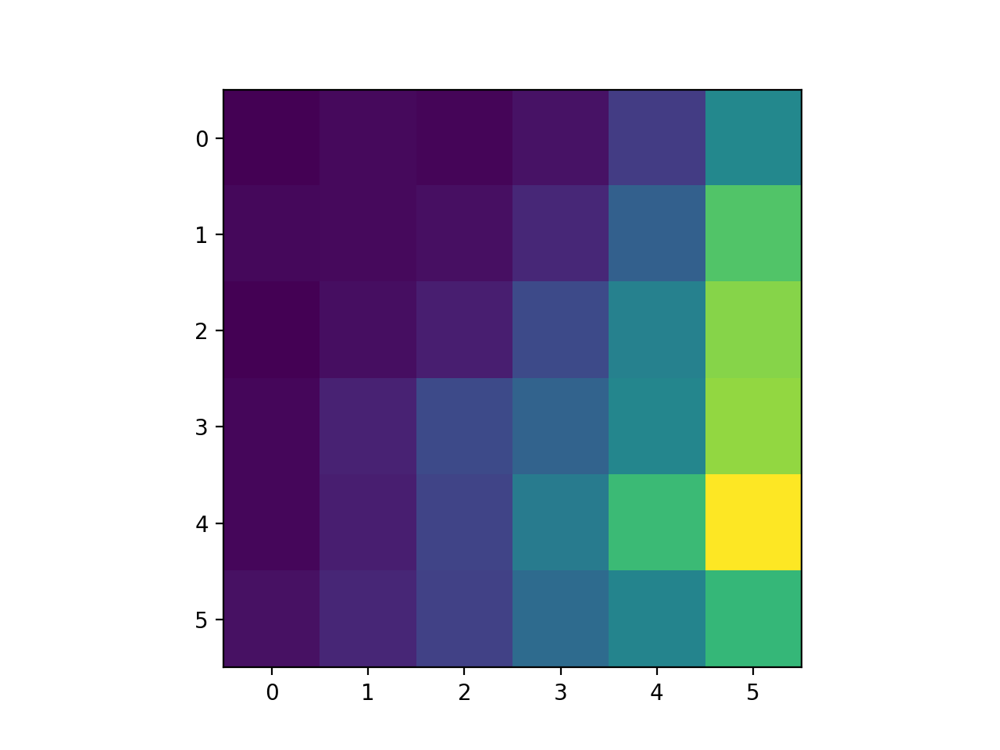

In [42]:
plt.figure()
plt.imshow(np.nanmean(sst_sc_event_rate_norm, 0))

In [29]:
vip_sc_event_rate.shape

(807, 6, 6)

In [18]:
rs[irun][itype][ialign].shape

(94, 6, 6, 8)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


<IPython.core.display.Javascript object>


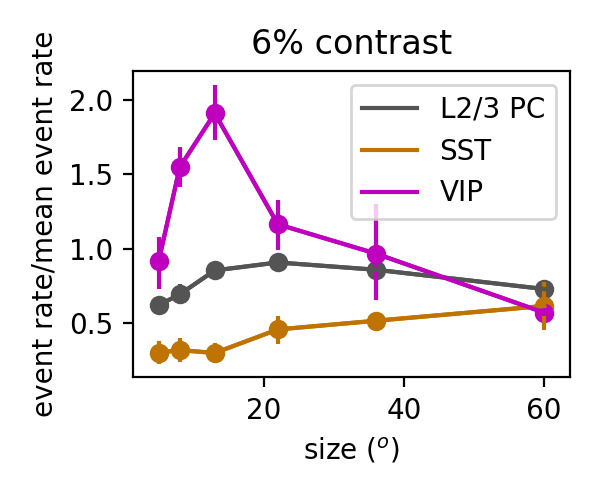

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.8556032188083442
0.4673970447440056
1.7191994499278378


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<IPython.core.display.Javascript object>


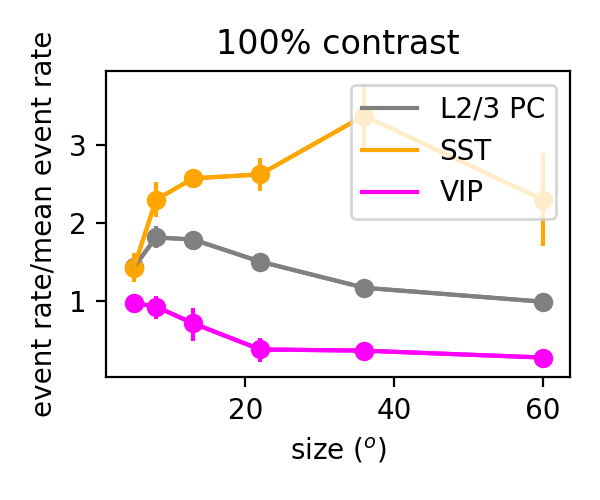

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


1.691752841545223
2.979658301710941
0.8676837149987611


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [281]:
reload(ut)
ialign = 0
irun = 0

lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
c_l4 = np.array((0, 0.5, 0))
c_l23 = [np.array((0.33, 0.33, 0.33)), np.array((0.5, 0.5, 0.5))]
c_sst = [np.array((0.75, 0.45, 0)), np.array((1, 0.65, 0))]
c_vip = [np.array((0.75, 0, 0.75)), np.array((1, 0, 1))]
c_pv = np.array((0, 0, 1))
colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
ucontrast = [0, 6, 12, 25, 50, 100]

for iicontrast, icontrast in enumerate([1, 5]):
    plt.figure(figsize=(3, 2.5))
    for itype in [1, 2, 3]:#range(len(rsexpt)):
        data = np.nanmean(rsexpt[irun][itype][ialign], -1)
        data = data/np.nanmean(np.nanmean(data, 1), 1)[:, np.newaxis, np.newaxis]
    #     for icontrast in range(6):
        #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
        ut.plot_bootstrapped_errorbars_hillel([5, 8, 13, 22, 36, 60], data[:, :, icontrast:icontrast+1].transpose((0, 2, 1)), pct=(16, 84), colors=colors[itype][iicontrast][np.newaxis])
#         plt.legend(['6%', '25%', '100%'])
        plt.xlabel('size ($^o$)')
        plt.ylabel('event rate/mean event rate')
        plt.title('%d%% contrast'%ucontrast[icontrast])
        plt.legend(['L2/3 PC', 'SST', 'VIP'])
        plt.tight_layout()
#     plt.savefig('figures/pc_sst_vip_size_by_contrast_%d.eps'%icontrast)

<IPython.core.display.Javascript object>


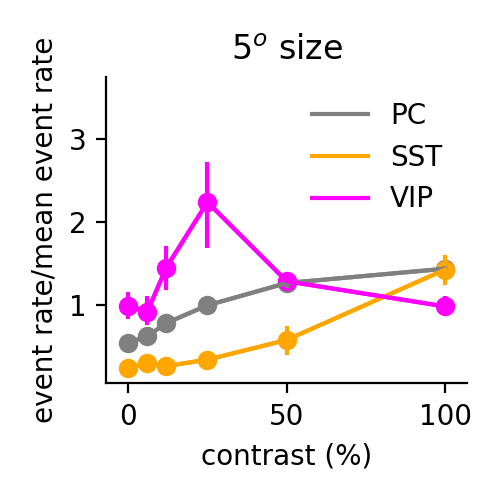

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


1.3719448841485047
1.233905338665588
1.6844219196465127


<IPython.core.display.Javascript object>


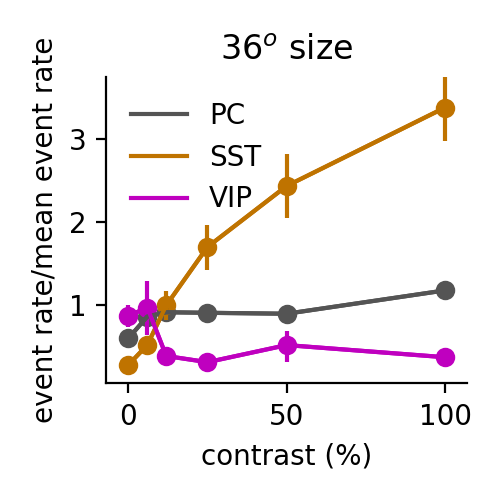

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


1.0712052435825166
2.979658301710941
0.7305596198174552


In [44]:
reload(ut)
ialign = 0
irun = 0

lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
c_l4 = np.array((0, 0.5, 0))
c_l23 = [np.array((0.33, 0.33, 0.33)), np.array((0.5, 0.5, 0.5))][::-1]
c_sst = [np.array((0.75, 0.45, 0)), np.array((1, 0.65, 0))][::-1]
c_vip = [np.array((0.75, 0, 0.75)), np.array((1, 0, 1))][::-1]
c_pv = np.array((0, 0, 1))
colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
usize = [5, 8, 13, 22, 36, 60]
ylim = (0.05, 3.75)

for iisize, isize in enumerate([0, 4]):
    plt.figure(figsize=(2.5, 2.5))
    these_types = [1, 2, 3]
    for itype in these_types:#range(len(rsexpt)):
        data = np.nanmean(rsexpt[irun][itype][ialign], -1)
        data = data/np.nanmean(np.nanmean(data, 1), 1)[:, np.newaxis, np.newaxis]
    #     for icontrast in range(6):
        #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
        ut.plot_bootstrapped_errorbars_hillel([0, 6, 12, 25, 50, 100], data[:, isize:isize+1, :], pct=(16, 84), colors=colors[itype][iisize][np.newaxis])
#         plt.legend(['6%', '25%', '100%'])
        plt.xlabel('contrast (%)')
        plt.ylabel('event rate/mean event rate')
    plt.legend(['PC', 'SST', 'VIP'], frameon=False)
    plt.title('%d$^o$ size'%usize[isize])
    ut.erase_top_right()
    plt.ylim(ylim)
    plt.tight_layout()
    plt.savefig('figures/pc_sst_vip_contrast_by_size_%d.eps'%isize)

In [240]:
alignment_lbls = ['aligned', 'misaligned']
running_lbls = ['non_running', 'running']

In [107]:
reload(nra)
ams_all = [[[None for _ in range(5)] for _ in range(2)] for _ in range(2)]
for ialign in range(2):
    if ialign == 0:
        delta0 = 0
    else:
        delta0 = 10
    for irun in range(2):
        for itype in range(5):#range(len(rsexpt)):
            data = np.nanmean(rsexpt[irun][itype][ialign], -1)
            data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
            norm_top=False
            norm_bottom=False
            theta0 = None
            if itype == 2:
                ams_all[ialign][irun][itype] = nra.ayaz_model(data, delta0=delta0, norm_top=norm_top, norm_bottom=norm_bottom)
                theta0 = ams_all[ialign][irun][itype].theta
                norm_bottom = True
            if itype == 3:
                norm_top = True
            ams_all[ialign][irun][itype] = nra.ayaz_model(data, delta0=delta0, norm_top=norm_top, norm_bottom=norm_bottom, theta0=theta0)

In [93]:
for ialign in range(2):
    for irun in range(2):
        for itype in range(5):
            print(ams_all[ialign][irun][itype].theta[-1])
        print('')

0.0
0.0
0.0
0.0
0.0

0.0
0.0
0.0
0.0
0.0

10.240729863999132
6.8319401804599025
16.48082052502482
40.651322439392764
0.0

8.88644770801481
8.621760562292485
18.92051662253947
9.92277781520886
8.829407699542838



/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a

1.4308921713443568
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.6917528415452228
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a

2.979658301710941
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.719199449927838
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a

1.8028503725312983
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.55580309073696
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

1.9377399034950145
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
3.199106524770949
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

1.5427631344096724
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
2.0806166314456913
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

1.3192366107396065
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.533427242420915
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a

3.576011335460456
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.4689833854838674
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.6892423182758625
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

1.4990883509232418
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.700285531515513
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a

2.8127370479813973
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
1.6807751511179407
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)
/Users/dan/Documents/code/adesnal/pyute.py:140: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping wil

2.2368657782517265
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


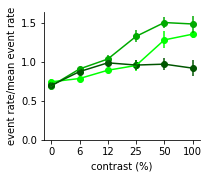

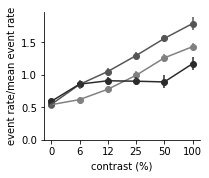

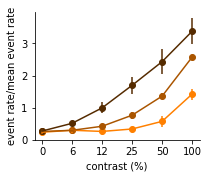

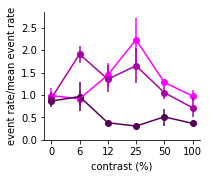

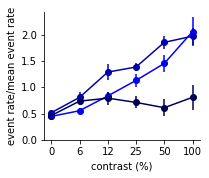

...

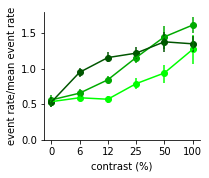

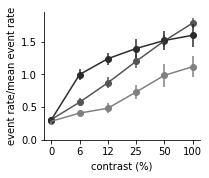

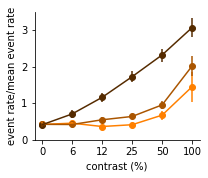

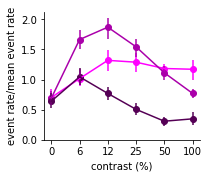

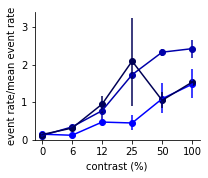

In [36]:
# c_l4 = np.array(((0, 0.3, 0), (0, 0.6, 0), (0, 1, 0)))
# c_l23 = np.array(((0.5, 0.5, 0.5), (0.25, 0.25, 0.25), (0., 0., 0.)))
# c_sst = np.array(((0.3, 0.2, 0), (0.6, 0.4, 0), (1, 0.65, 0)))
# c_vip = np.array(((0.3, 0, 0.3), (0.6, 0, 0.6), (1, 0, 1)))
# c_pv = np.array(((0, 0, 0.3), (0, 0, 0.6), (0, 0, 1)))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
# cfrac = np.linspace(1, 0, this_ncontrast+1)[:-1]
# c_l4 = cfrac[:, np.newaxis]*np.array(((0, 1, 0)))
# c_sst = cfrac[:, np.newaxis]*np.array(((1, 0.65, 0)))
# c_vip = cfrac[:, np.newaxis]*np.array(((1, 0, 1)))
# c_pv = cfrac[:, np.newaxis]*np.array(((0, 0, 1)))
# c_l23 = cfrac[:, np.newaxis]*np.array(((0.5, 0.5, 0.5)))
# colors = [c_l4, c_l23, c_sst, c_vip, c_pv]
cmax = 6

ucontrast = np.array([0, 6, 12, 25, 50, 100])

reload(ut)
ialign = 0
irun = 0
lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
for ialign in range(2):
    for irun in range(2):
        for itype in [0, 1, 2, 3, 4]:#range(len(rsexpt)):
            plt.figure(figsize=(3, 2.5))
            data = np.nanmean(self.rsexpt[irun][itype][ialign], -1)
            data = data/np.nanmean(np.nanmean(data, -1), -1)[:, np.newaxis, np.newaxis]
#             nra.plot_interp_contrast_tuning(ams=ams_all[ialign][irun][itype], usize=usize, these_sizes=these_sizes, colors=colors[itype])
#             data = data/np.nanmean(np.n)
#             data = data/np.nanmax(data, axis=1)[:, np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
            ut.plot_bootstrapped_errorbars_hillel(np.arange(cmax), data[:, [0, 2, 4], :cmax], pct=(16, 84), colors=self.colors2d[itype])
            plt.gca().set_ylim(bottom=0)
            plt.xticks(np.arange(cmax), ucontrast[:cmax])
#                         plt.legend(['5$^o$', '13$^o$', '36$^o$'])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate/mean event rate')
            ut.erase_top_right()
            plt.tight_layout()
            plt.savefig('figures/%s_contrast_by_3_sizes_%s_%s.eps'%(self.celltype_lbls[itype], self.running_lbls[irun], self.alignment_lbls[ialign]))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


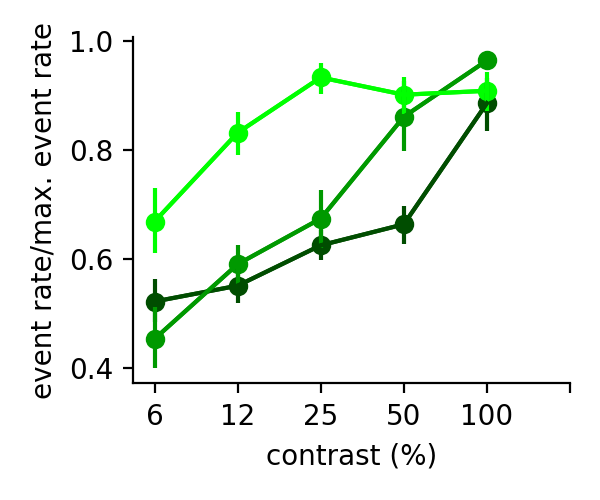

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9504320574705508


<IPython.core.display.Javascript object>


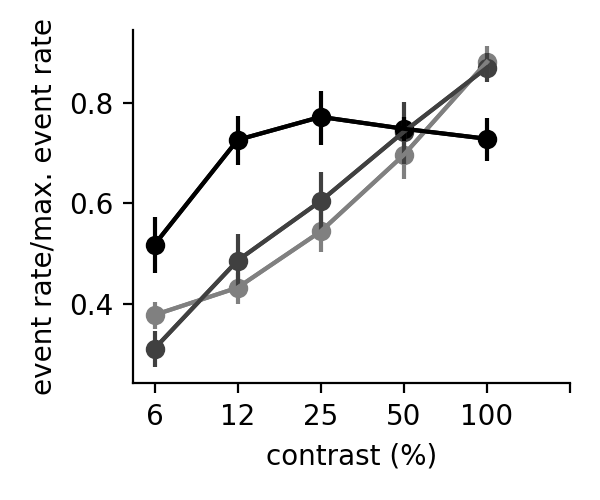

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.8486890505803254


<IPython.core.display.Javascript object>


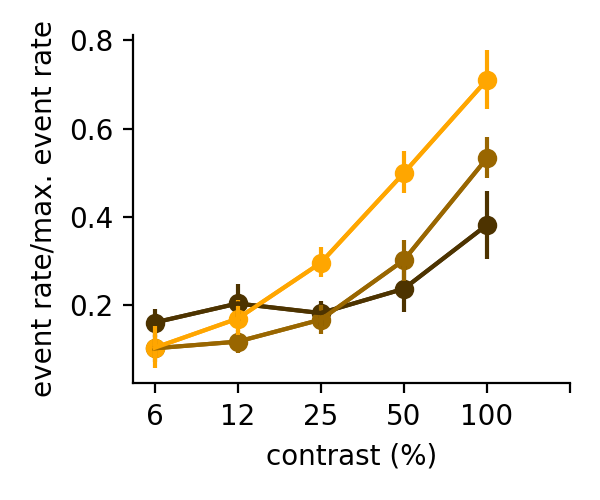

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.643895030745019


<IPython.core.display.Javascript object>


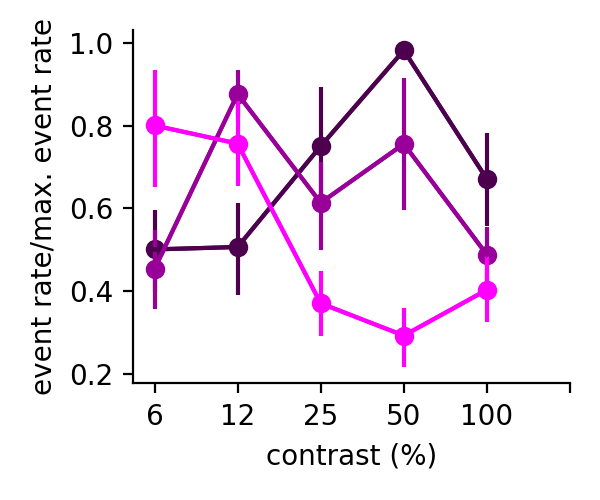

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9722795208755871


<IPython.core.display.Javascript object>


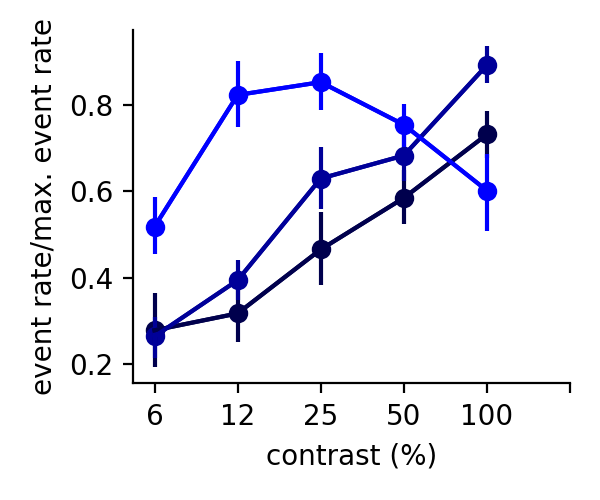

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.8475219744522625


<IPython.core.display.Javascript object>


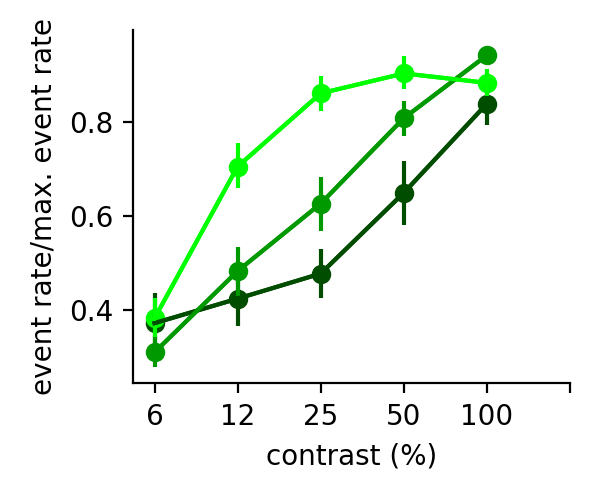

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9213005510026663


<IPython.core.display.Javascript object>


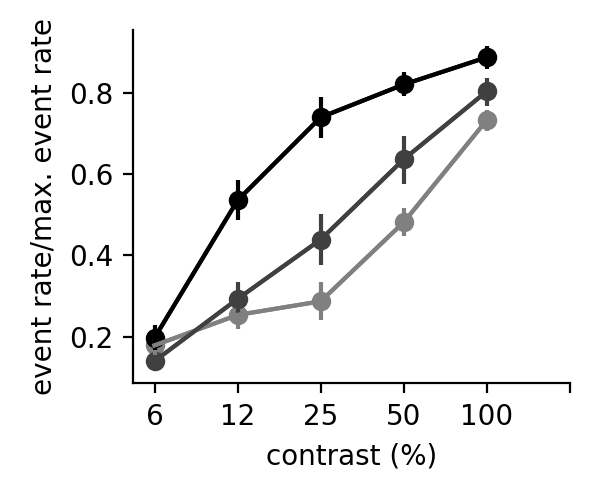

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.8594340745644782


<IPython.core.display.Javascript object>


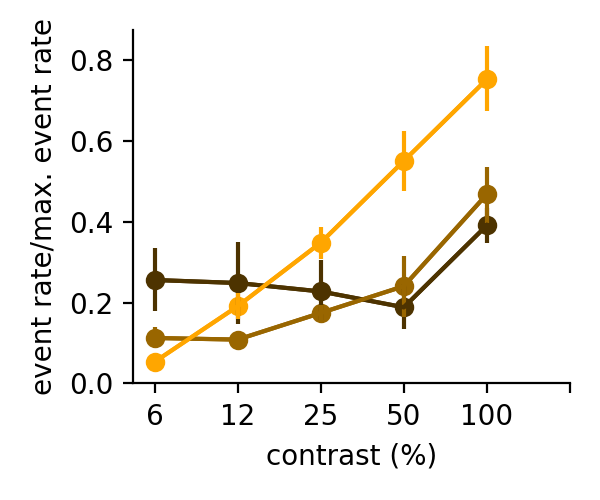

0.6713631041786899


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


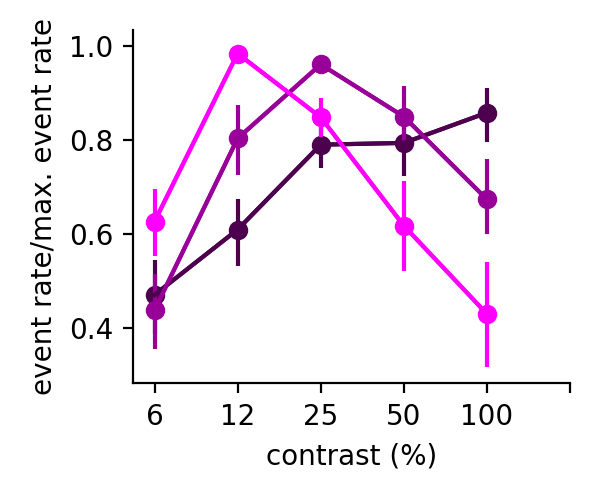

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9683533808852547


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


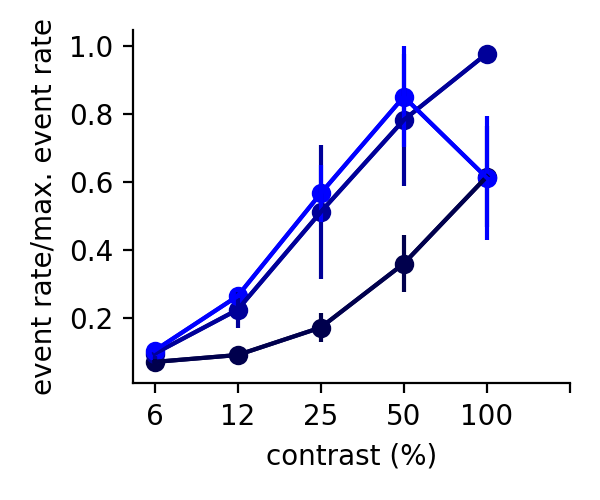

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9561460756543003


<IPython.core.display.Javascript object>


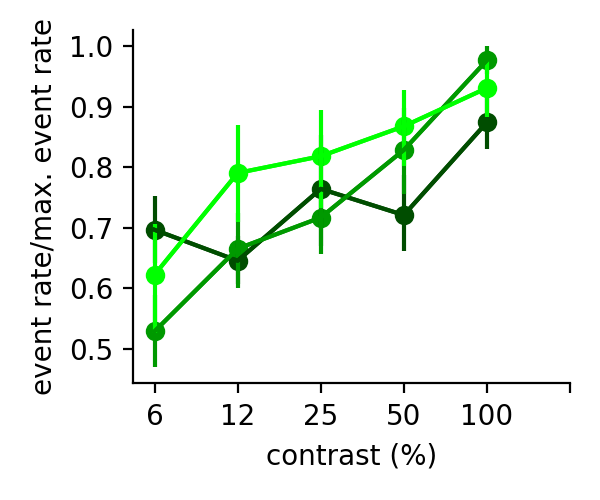

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9530513828431644


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


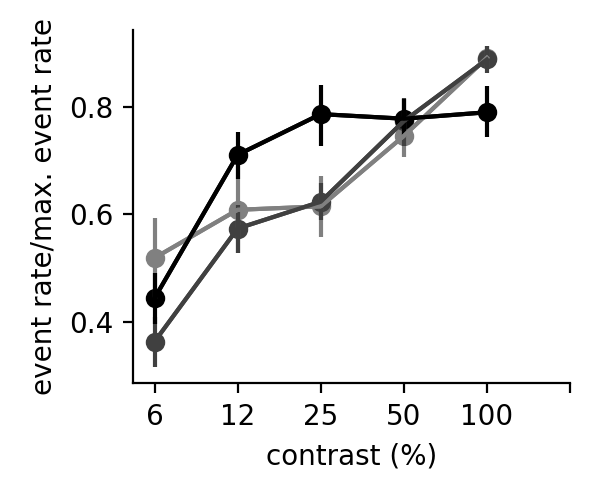

0.8693601768842287


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


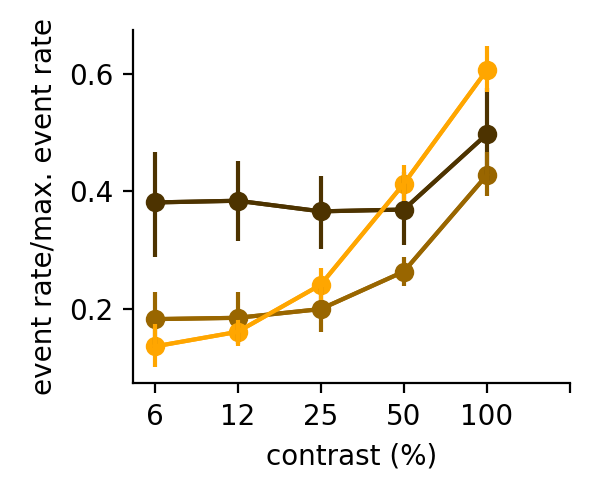

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.5661659910625458


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


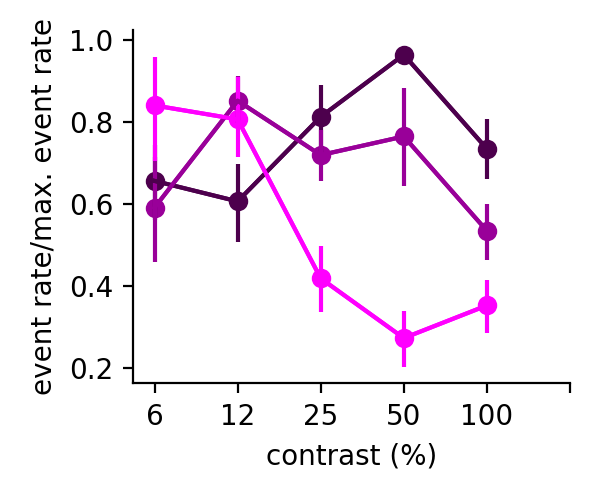

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9435377394091444


<IPython.core.display.Javascript object>


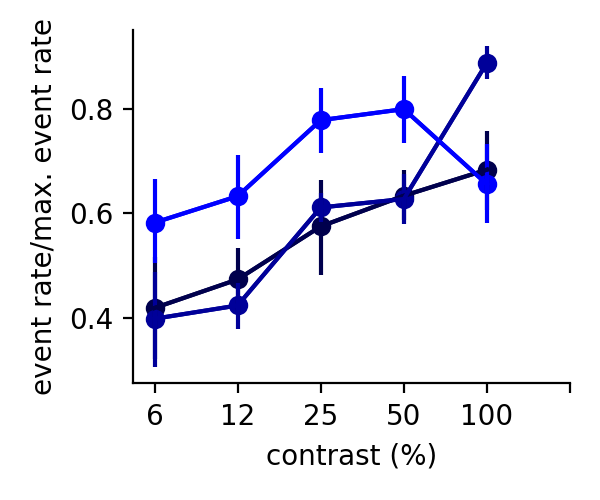

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.856692236173751


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


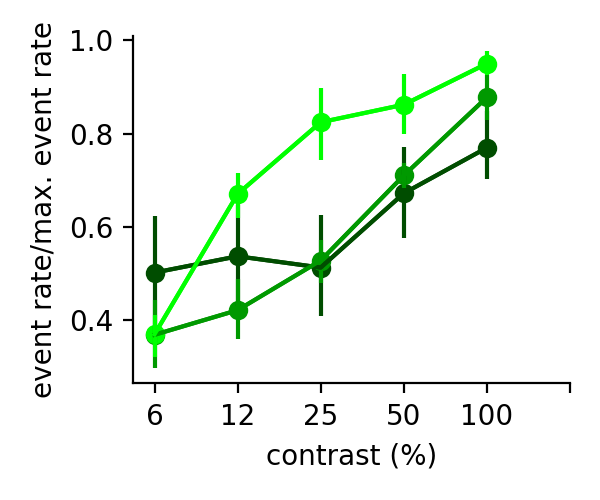

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9242101054146821


<IPython.core.display.Javascript object>


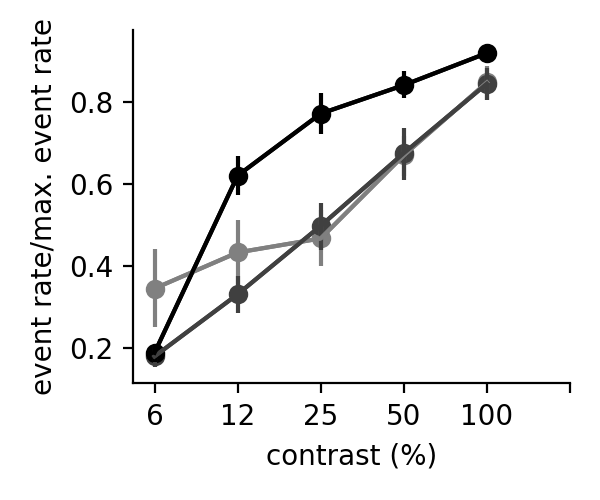

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9023823383079033


<IPython.core.display.Javascript object>


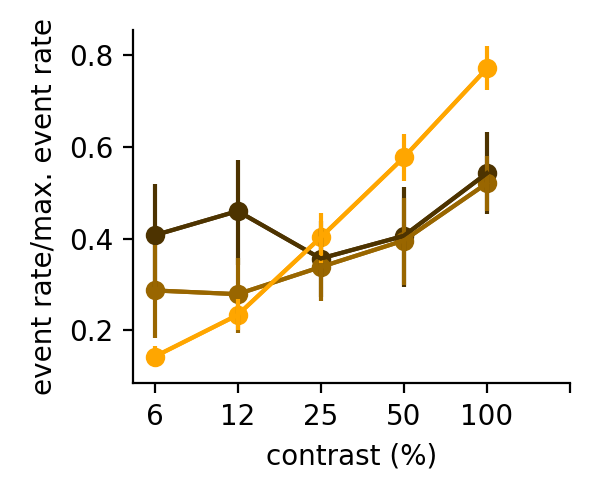

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.7221084676440086


<IPython.core.display.Javascript object>


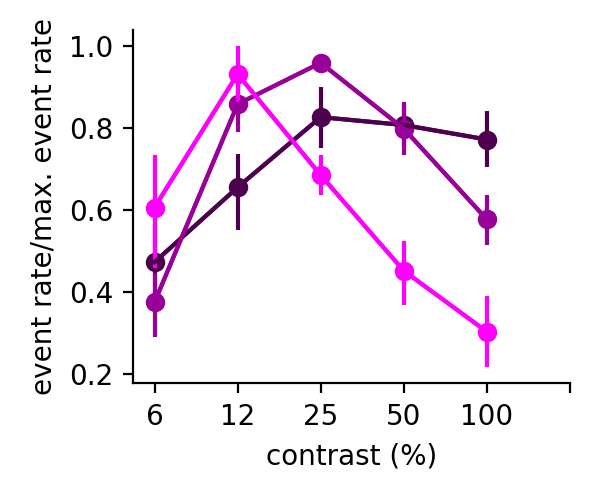

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.936608306101881


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


<IPython.core.display.Javascript object>


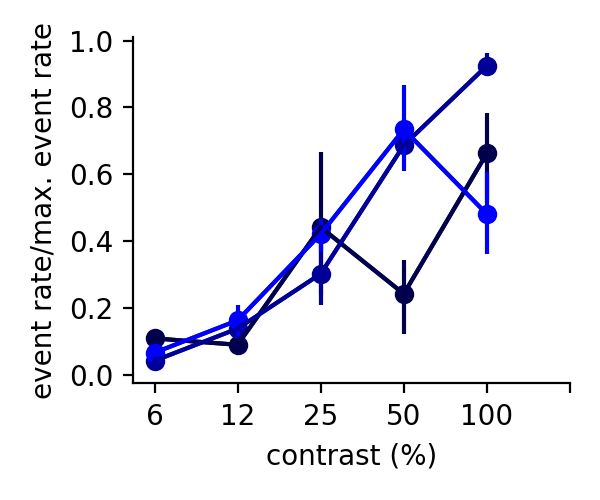

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.8875746638697519


In [141]:
reload(ut)
ialign = 0
irun = 0
lbls = ['pc_l4', 'pc_l23', 'sst', 'vip', 'pv']
for ialign in range(2):
    for irun in range(2):
        for itype in [0, 1, 2, 3, 4]:#range(len(rsexpt)):
            plt.figure(figsize=(3, 2.5))
            data = np.nanmean(rsexpt[irun][itype][ialign], -1)
            data = data/np.nanmax(data, axis=2)[:, :, np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5, 8, 13, 22, 36, 60], np.nanmean(data, 0)[:, icontrast], compute_sem(data, 0)[:, icontrast])
            ut.plot_bootstrapped_errorbars_hillel(np.arange(cmax), data[:, [0, 2, 4], :cmax], pct=(16, 84), colors=colors[itype])
            plt.xticks(np.arange(6), ucontrast[:cmax])
            #             plt.legend(['5$^o$', '13$^o$', '36$^o$'])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate/max. event rate')
            ut.erase_top_right()
            plt.tight_layout()
            plt.savefig('figures/%s_contrast_by_3_sizes_%s_%s_norm_to_max.eps'%(lbls[itype], running_lbls[irun], alignment_lbls[ialign]))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


<IPython.core.display.Javascript object>


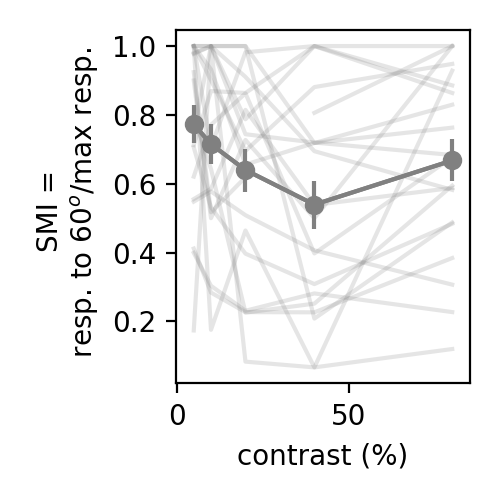

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially

0.7164073455115809


<IPython.core.display.Javascript object>


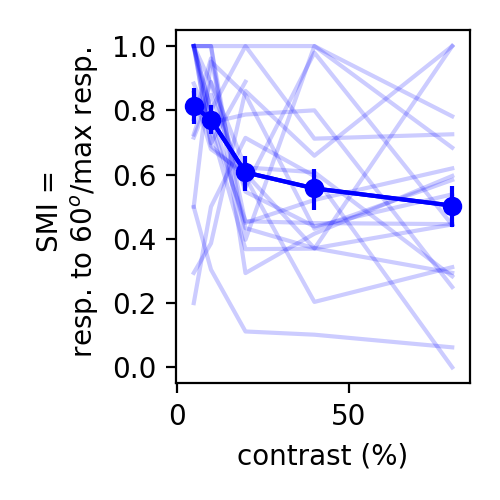

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.75517468365413


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

<IPython.core.display.Javascript object>


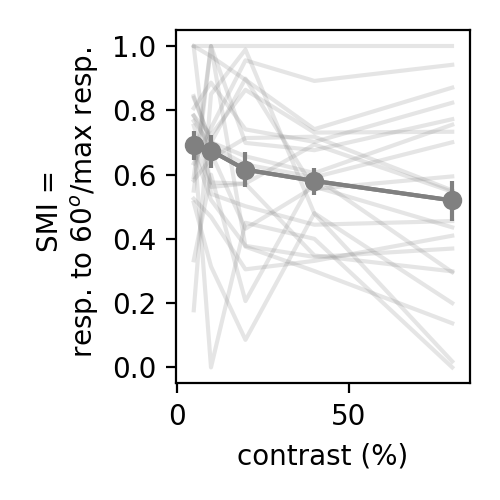

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.651380668372353


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

<IPython.core.display.Javascript object>


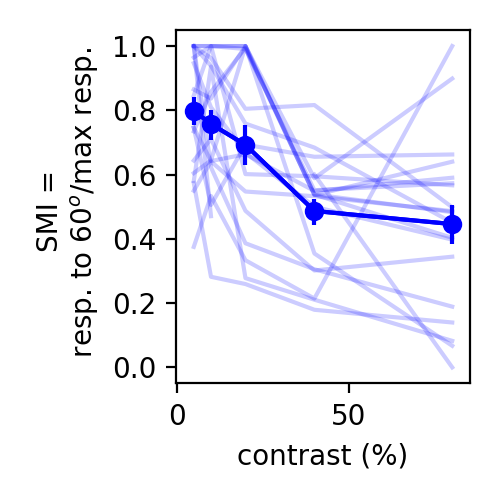

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.7545351075940296


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

In [947]:
# smimis = [None for irun in range(2)]
# p = [None for irun in range(2)]
# for irun in range(2):
#     smimis[irun] = [None for itype in range(2)]
#     p[irun] = [None for itype in range(2)]
#     for itype, data, c, lbl in zip([0, 1], [rrs[irun], rfs[irun]], [c_l23, c_pv], ['pc_l23', 'pv_l23']):
#         shp = data.shape
#         nexpt = shp[0]
#         nlight = shp[3]
#         smi_expt = data[:, -1, :, 0]/np.nanmax(data[:, :, :, 0], 1)
#         plt.figure(figsize=(2.5, 2.5))
#         ucontrast = [5, 10, 20, 40, 80]
#         plt.plot(ucontrast, smi_expt[:, 1:].T, c=c, alpha=0.2)
#         ut.plot_bootstrapped_errorbars_hillel(ucontrast, smi_expt[:, np.newaxis, 1:], colors=c[np.newaxis], pct=(16, 84))
# #         plt.legend(['5%', '20%', '80%'])
# #         plt.xlabel('size ($^o$)')
#         plt.ylabel('SMI = \n resp. to 60$^o$/max resp.')
#         plt.xlabel('contrast (%)')
        
#         plt.tight_layout()
        
#         smimis[irun][itype] = smi_expt[:, 1]-smi_expt[:, -1]
#         plt.savefig('figures/ephys_%s_c50_by_size_%s.eps'%(lbl, running_lbls[irun]))
#         _, p[irun][itype] = sst.wilcoxon(smi_expt[:, 1], smi_expt[:, -1])